# train

In [1]:
import yaml
import os

with open("./config.yaml", 'rb') as f:
    config = yaml.load(f)

<ipython-input-1-1499ab5789c7>:5: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  config = yaml.load(f)


In [2]:
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
os.makedirs(OUTPUT_ROOT, exist_ok=True)

## load library

In [3]:
# python default library
import os
import shutil
import datetime
import sys
import pickle
import random
from random import sample

# general analysis tool-kit
import numpy as np
import pandas as pd
#from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

# pytorch
import torch
from torch import optim, nn
from torch.utils.tensorboard import SummaryWriter

#from torchsummary import summary

# etc
import yaml
yaml.warnings({'YAMLLoadWarning': False})

# original library
sys.path.append('/home/hiroki/research/dcase2021_task2/src/functions')
import common as com
import pytorch_modeler as modeler
from pytorch_model import Conditional_VAE as Model
#from pytorch_utils import filtered_load_model
#import models

import librosa
import IPython
import librosa.display

## load config and set logger

In [4]:
log_file = config['IO_OPTION']['OUTPUT_ROOT']+'/train_{0}.log'.format(datetime.date.today())
logger = com.setup_logger(log_file, '00_train.py')

## Setting

In [5]:
# Setting seed
modeler.set_seed(777)

In [6]:
############################################################################
# Setting I/O path
############################################################################
# input dirs
INPUT_ROOT = config['IO_OPTION']['INPUT_ROOT']
#dev_dir = INPUT_ROOT + "/dev_data"
#add_dev_dir = INPUT_ROOT + "/add_dev_data"
# machine type
machine_types = ['ToyCar', 'gearbox', 'valve', 'ToyTrain', 'pump', 'fan', 'slider']
# output dirs
OUTPUT_ROOT = config['IO_OPTION']['OUTPUT_ROOT']
MODEL_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/models'
TB_DIR = config['IO_OPTION']['OUTPUT_ROOT'] + '/tb'
OUT_FEATURE_DIR = OUTPUT_ROOT + '/extraction_features'
OUT_SCORE_DIR = OUTPUT_ROOT + '/score'
OUT_PRED_DIR = OUTPUT_ROOT + '/pred'
#os.makedirs(OUTPUT_ROOT, exist_ok=True)
os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(TB_DIR, exist_ok=True)
os.makedirs(OUT_FEATURE_DIR, exist_ok=True)
os.makedirs(OUT_SCORE_DIR, exist_ok=True)
os.makedirs(OUT_PRED_DIR, exist_ok=True)
# copy config
shutil.copy('./config.yaml', OUTPUT_ROOT)

'/media/hiroki/HDD1TB/research/dcase2021_task2/output/CenterLossVAE/ex15/config.yaml'

In [7]:
torch.cuda.is_available()

True

In [8]:
ext_data = pd.read_pickle(f'{INPUT_ROOT}/valve_features.pkl')

In [9]:
#train_features = ext_data['train']['features']

In [10]:
#train_features.shape

## training

In [11]:
def random_feature_selection(x, t_d=3776, d=2048):
    idx = torch.tensor(sample(range(0, t_d), d)) # t_d(特徴量)の中からランダムにd個サンプリングする(ぜんぶやると重いから) # わからん
    # 0~t_d idxの中からランダムにd個サンプリングする
    x = np.take(x, idx, 1)
    return x

In [12]:
#ext_data['train'].keys()

In [13]:
#############################################################################
# run
#############################################################################
def run(machine_type):
    com.tic()
    logger.info('TARGET MACHINE_TYPE: {0}'.format(machine_type))
    logger.info('MAKE DATA_LOADER')
    # dataloader
    #for machine in machine_types:
    #    if machine_type == machine:
    #        ext_data = pd.read_pickle(f'{INPUT_ROOT}/{machine}_features.pkl')
    #    else:
    #        ext_data_ = pd.read_pickle(f'{INPUT_ROOT}/{machine}_features.pkl')
    #        ext_data['train']['features'] = np.concatenate([ext_data['train']['features'],
    #                                                        ext_data_['train']['features']], axis=0)
    #        ext_data['train']['labels'] = np.concatenate([ext_data['train']['labels'],
    #                                                     ext_data_['train']['labels']], axis=0)
    #        ext_data['train']['wav_names'] = np.concatenate([ext_data['train']['wav_names'],
    #                                                         ext_data_['train']['wav_names']], axis=0)
            
    #t_d = 3776    # 全特徴量数
    #d = 1024      # 使う特徴量数
    #for phase in ['train', 'valid_source', 'valid_target']:
    #    x = ext_data[phase]['features']
    #    x = random_feature_selection(x)
    #    ext_data[phase]['features'] = x
    #    x = ext_data[phase]['features'][:,512:2048]
    #    ext_data[phase]['features'] = x
    dataloaders_dict = modeler.make_dataloader(ext_data)
    # define writer for tensorbord
    os.makedirs(TB_DIR+'/'+machine_type, exist_ok=True)
    tb_log_dir = TB_DIR + '/' + machine_type
    writer = SummaryWriter(log_dir = tb_log_dir)
    # out path
    model_out_path = MODEL_DIR+'/{}_model.pth'.format(machine_type)
    score_out_path = OUT_SCORE_DIR + '/{}_score.csv'.format(machine_type)
    pred_out_path = OUT_PRED_DIR + '/{}_pred.csv'.format(machine_type)
    logger.info('TRAINING')
    # parameter setting
    in_features = ext_data['train']['features'].shape[1]
    mid_size = config['param']['mid_size']
    latent_size = config['param']['latent_size']
    num_classes = 6
    net = Model(in_features, mid_size, latent_size, num_classes)
    optimizer = optim.Adam(net.parameters(), lr=1e-4)
    num_epochs = config['param']['num_epochs']
    #scheduler = optim.lr_scheduler.OneCycleLR(optimizer=optimizer, pct_start=0.1, div_factor=1e-2, 
    #                                          max_lr=1e-3, epochs=num_epochs, steps_per_epoch=len(dataloaders_dict['train']))
    # training
    output_dicts = modeler.train_net(net, dataloaders_dict, optimizer, num_epochs, writer, model_out_path, score_out_path, pred_out_path)
    
    com.toc()

In [14]:
machine_types

['ToyCar', 'gearbox', 'valve', 'ToyTrain', 'pump', 'fan', 'slider']

2021-05-30 21:00:36,665 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyCar
2021-05-30 21:00:36,666 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 21:00:37,711 - 00_train.py - INFO - TRAINING
2021-05-30 21:00:42,902 - pytorch_modeler.py - INFO - train
  0%|          | 0/12 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 12/12 [00:01<00:00,  7.88it/s]
2021-05-30 21:00:44,428 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.91it/s]
2021-05-30 21:00:44,507 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.10it/s]


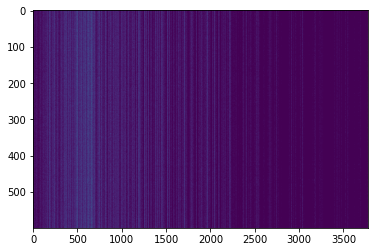

,AUC,pAUC
Source_0,0.521100,0.540526
Source_1,0.566100,0.547368
Source_2,0.602800,0.528947
Target_0,0.481200,0.545789
Target_1,0.657000,0.593158
Target_2,0.524200,0.490000
mean,0.558733,0.540965
h_mean,0.552879,0.539256


2021-05-30 21:00:46,446 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:189617.226562, val_AUC_hmean:0.552879, val_pAUC_hmean:0.539256, best_flag:True
2021-05-30 21:00:46,447 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.73it/s]
2021-05-30 21:00:47,391 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.98it/s]
2021-05-30 21:00:47,442 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.12it/s]


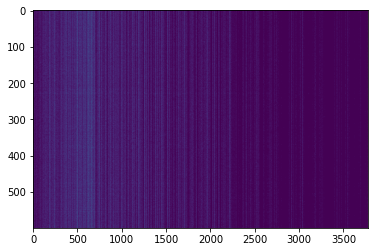

,AUC,pAUC
Source_0,0.548100,0.541053
Source_1,0.594800,0.567895
Source_2,0.658700,0.557368
Target_0,0.511300,0.580000
Target_1,0.672000,0.583684
Target_2,0.611500,0.495263
mean,0.599400,0.554211
h_mean,0.593878,0.552496


2021-05-30 21:00:49,357 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:128406.160156, val_AUC_hmean:0.593878, val_pAUC_hmean:0.552496, best_flag:True
2021-05-30 21:00:49,358 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.66it/s]
2021-05-30 21:00:50,239 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.85it/s]
2021-05-30 21:00:50,300 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 43.05it/s]


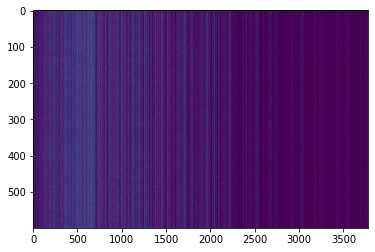

,AUC,pAUC
Source_0,0.558200,0.544211
Source_1,0.609200,0.562632
Source_2,0.634500,0.572105
Target_0,0.532200,0.584737
Target_1,0.698100,0.589474
Target_2,0.620400,0.509474
mean,0.608767,0.560439
h_mean,0.604088,0.559064


2021-05-30 21:00:52,276 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:99766.023438, val_AUC_hmean:0.604088, val_pAUC_hmean:0.559064, best_flag:True
2021-05-30 21:00:52,277 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.70it/s]
2021-05-30 21:00:53,224 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 12.17it/s]
2021-05-30 21:00:53,413 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.93it/s]
2021-05-30 21:00:53,475 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:85762.103516, val_AUC_hmean:0.621516, val_pAUC_hmean:0.555116, best_flag:False
2021-05-30 21:00:53,476 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.26it/s]
2021-05-30 21:00:54,457 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.68it/s]
2021-05-30 21:00:54,522 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.76it/s]


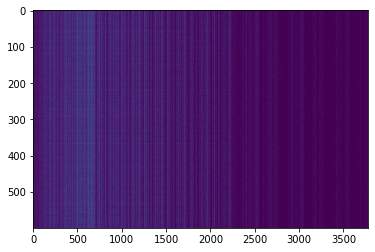

,AUC,pAUC
Source_0,0.560800,0.559474
Source_1,0.630400,0.564211
Source_2,0.729000,0.599474
Target_0,0.530600,0.615263
Target_1,0.694300,0.576842
Target_2,0.623400,0.512632
mean,0.628083,0.571316
h_mean,0.620458,0.569393


2021-05-30 21:00:56,343 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:78294.450521, val_AUC_hmean:0.620458, val_pAUC_hmean:0.569393, best_flag:True
2021-05-30 21:00:56,344 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.80it/s]
2021-05-30 21:00:57,283 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 61.56it/s]
2021-05-30 21:00:57,338 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.59it/s]


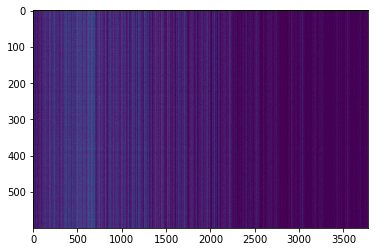

,AUC,pAUC
Source_0,0.572700,0.568947
Source_1,0.640100,0.562105
Source_2,0.787300,0.633684
Target_0,0.528900,0.612632
Target_1,0.695600,0.590526
Target_2,0.659100,0.499474
mean,0.647283,0.577895
h_mean,0.636667,0.574573


2021-05-30 21:00:59,275 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:74048.190104, val_AUC_hmean:0.636667, val_pAUC_hmean:0.574573, best_flag:True
2021-05-30 21:00:59,277 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.08it/s]
2021-05-30 21:01:00,273 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.39it/s]
2021-05-30 21:01:00,343 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.98it/s]


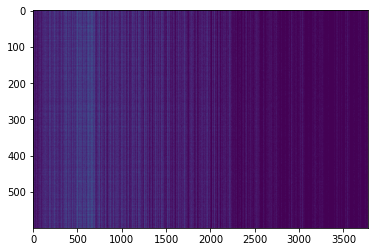

,AUC,pAUC
Source_0,0.570500,0.584211
Source_1,0.644800,0.548421
Source_2,0.770400,0.623684
Target_0,0.519800,0.622105
Target_1,0.687600,0.585789
Target_2,0.623700,0.520526
mean,0.636133,0.580789
h_mean,0.626094,0.578359


2021-05-30 21:01:02,335 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:71296.484375, val_AUC_hmean:0.626094, val_pAUC_hmean:0.578359, best_flag:True
2021-05-30 21:01:02,337 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.32it/s]
2021-05-30 21:01:03,313 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 61.79it/s]
2021-05-30 21:01:03,368 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.67it/s]


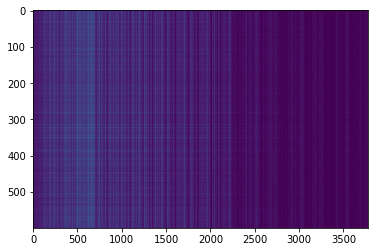

,AUC,pAUC
Source_0,0.590100,0.595263
Source_1,0.707600,0.575263
Source_2,0.823800,0.674211
Target_0,0.543900,0.633158
Target_1,0.710200,0.585263
Target_2,0.614800,0.509474
mean,0.665067,0.595439
h_mean,0.652535,0.590999


2021-05-30 21:01:05,265 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:69418.686849, val_AUC_hmean:0.652535, val_pAUC_hmean:0.590999, best_flag:True
2021-05-30 21:01:05,266 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.58it/s]
2021-05-30 21:01:06,222 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 38.27it/s]
2021-05-30 21:01:06,312 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.17it/s]


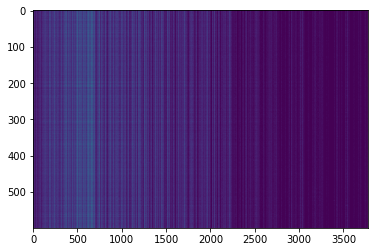

,AUC,pAUC
Source_0,0.599600,0.603684
Source_1,0.698600,0.577895
Source_2,0.813900,0.646316
Target_0,0.551600,0.633158
Target_1,0.711100,0.600000
Target_2,0.654800,0.510000
mean,0.671600,0.595175
h_mean,0.661213,0.591659


2021-05-30 21:01:08,074 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:67513.634766, val_AUC_hmean:0.661213, val_pAUC_hmean:0.591659, best_flag:True
2021-05-30 21:01:08,075 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.30it/s]
2021-05-30 21:01:09,055 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.42it/s]
2021-05-30 21:01:09,124 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.99it/s]


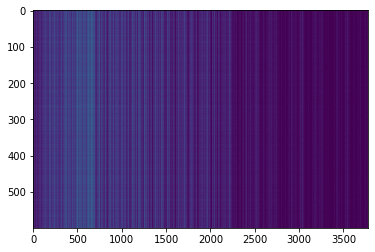

,AUC,pAUC
Source_0,0.587900,0.607368
Source_1,0.716500,0.597895
Source_2,0.802100,0.645789
Target_0,0.552800,0.639474
Target_1,0.721500,0.598421
Target_2,0.614900,0.506842
mean,0.665950,0.599298
h_mean,0.654691,0.595514


2021-05-30 21:01:11,034 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:66162.370768, val_AUC_hmean:0.654691, val_pAUC_hmean:0.595514, best_flag:True
2021-05-30 21:01:11,035 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.47it/s]
2021-05-30 21:01:12,000 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.04it/s]
2021-05-30 21:01:12,075 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 41.93it/s]


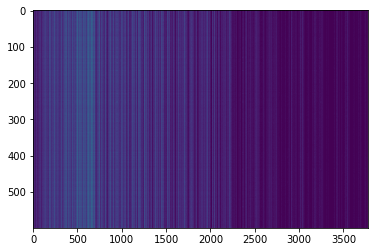

,AUC,pAUC
Source_0,0.597700,0.605263
Source_1,0.699300,0.587368
Source_2,0.830700,0.689474
Target_0,0.556700,0.630000
Target_1,0.707800,0.601579
Target_2,0.613300,0.499474
mean,0.667583,0.602193
h_mean,0.655986,0.596613


2021-05-30 21:01:14,020 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:65361.052083, val_AUC_hmean:0.655986, val_pAUC_hmean:0.596613, best_flag:True
2021-05-30 21:01:14,021 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.29it/s]
2021-05-30 21:01:15,000 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.61it/s]
2021-05-30 21:01:15,063 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.11it/s]


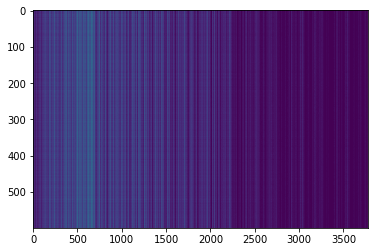

,AUC,pAUC
Source_0,0.637800,0.608421
Source_1,0.711800,0.585789
Source_2,0.826900,0.685789
Target_0,0.585500,0.644211
Target_1,0.713700,0.587368
Target_2,0.637900,0.504211
mean,0.685600,0.602632
h_mean,0.677289,0.597195


2021-05-30 21:01:17,043 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:64097.644206, val_AUC_hmean:0.677289, val_pAUC_hmean:0.597195, best_flag:True
2021-05-30 21:01:17,044 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.54it/s]
2021-05-30 21:01:18,003 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 45.87it/s]
2021-05-30 21:01:18,077 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.38it/s]


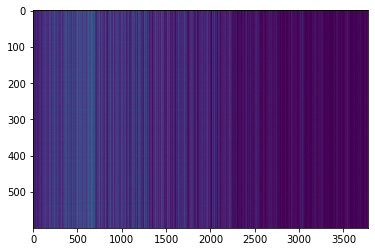

,AUC,pAUC
Source_0,0.613900,0.621579
Source_1,0.716700,0.577368
Source_2,0.829800,0.693684
Target_0,0.574400,0.642632
Target_1,0.714800,0.600526
Target_2,0.659500,0.513684
mean,0.684850,0.608246
h_mean,0.675253,0.602990


2021-05-30 21:01:19,983 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:62868.462565, val_AUC_hmean:0.675253, val_pAUC_hmean:0.602990, best_flag:True
2021-05-30 21:01:19,984 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.51it/s]
2021-05-30 21:01:20,946 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.14it/s]
2021-05-30 21:01:21,001 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.17it/s]


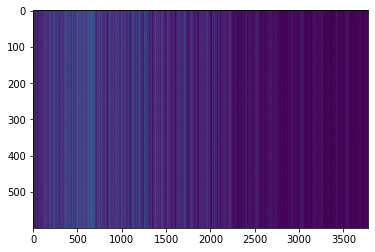

,AUC,pAUC
Source_0,0.625300,0.618947
Source_1,0.735100,0.595789
Source_2,0.834400,0.694211
Target_0,0.584400,0.638947
Target_1,0.719900,0.605263
Target_2,0.643400,0.507895
mean,0.690417,0.610175
h_mean,0.680848,0.604794


2021-05-30 21:01:22,781 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:61975.158203, val_AUC_hmean:0.680848, val_pAUC_hmean:0.604794, best_flag:True
2021-05-30 21:01:22,782 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.78it/s]
2021-05-30 21:01:23,803 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.87it/s]
2021-05-30 21:01:23,862 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.22it/s]
2021-05-30 21:01:23,922 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:61270.604492, val_AUC_hmean:0.677436, val_pAUC_hmean:0.601759, best_flag:False
2021-05-30 21:01:23,923 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.10it/s]
2021-05-30 21:01:24,917 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 38.94it/s]
2021-05-30 21:01:24,997 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.52it/s]
2021-05-30 21

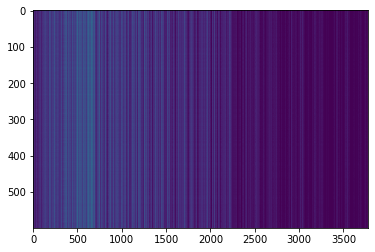

,AUC,pAUC
Source_0,0.626100,0.625263
Source_1,0.734100,0.606316
Source_2,0.821100,0.671053
Target_0,0.575900,0.640526
Target_1,0.730400,0.602105
Target_2,0.655700,0.511053
mean,0.690550,0.609386
h_mean,0.681207,0.604983


2021-05-30 21:01:28,207 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:59916.049479, val_AUC_hmean:0.681207, val_pAUC_hmean:0.604983, best_flag:True
2021-05-30 21:01:28,208 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.95it/s]
2021-05-30 21:01:29,221 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.33it/s]
2021-05-30 21:01:29,282 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.81it/s]


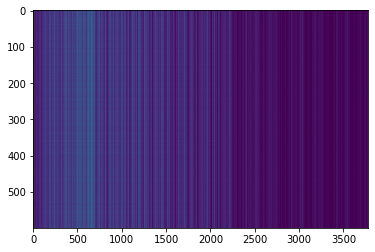

,AUC,pAUC
Source_0,0.653100,0.621579
Source_1,0.715200,0.591579
Source_2,0.836400,0.696842
Target_0,0.600900,0.647368
Target_1,0.722900,0.600526
Target_2,0.652500,0.510526
mean,0.696833,0.611404
h_mean,0.689257,0.605881


2021-05-30 21:01:31,366 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:59228.384766, val_AUC_hmean:0.689257, val_pAUC_hmean:0.605881, best_flag:True
2021-05-30 21:01:31,367 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.93it/s]
2021-05-30 21:01:32,375 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.11it/s]
2021-05-30 21:01:32,434 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.50it/s]


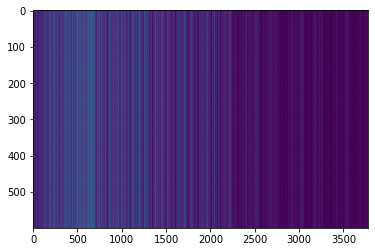

,AUC,pAUC
Source_0,0.654100,0.625263
Source_1,0.750500,0.618421
Source_2,0.821700,0.677895
Target_0,0.593700,0.644211
Target_1,0.725700,0.602105
Target_2,0.669300,0.529474
mean,0.702500,0.616228
h_mean,0.694872,0.612664


2021-05-30 21:01:34,380 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:58910.545247, val_AUC_hmean:0.694872, val_pAUC_hmean:0.612664, best_flag:True
2021-05-30 21:01:34,381 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 10.87it/s]
2021-05-30 21:01:35,487 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.25it/s]
2021-05-30 21:01:35,549 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.61it/s]


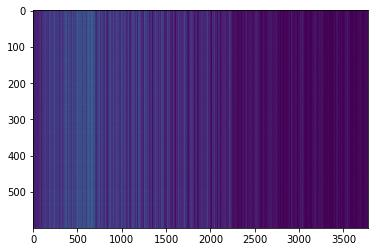

,AUC,pAUC
Source_0,0.667600,0.622105
Source_1,0.753500,0.640000
Source_2,0.809600,0.668947
Target_0,0.611100,0.647895
Target_1,0.767400,0.655263
Target_2,0.680900,0.518947
mean,0.715017,0.625526
h_mean,0.708520,0.621030


2021-05-30 21:01:37,437 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:58080.749349, val_AUC_hmean:0.708520, val_pAUC_hmean:0.621030, best_flag:True
2021-05-30 21:01:37,438 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.04it/s]
2021-05-30 21:01:38,444 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.16it/s]
2021-05-30 21:01:38,516 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.03it/s]
2021-05-30 21:01:38,585 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:57508.821289, val_AUC_hmean:0.697175, val_pAUC_hmean:0.609953, best_flag:False
2021-05-30 21:01:38,586 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.66it/s]
2021-05-30 21:01:39,537 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.18it/s]
2021-05-30 21:01:39,607 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 46.67it/s]
2021-05-30 21

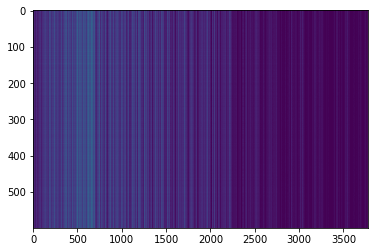

,AUC,pAUC
Source_0,0.666400,0.635263
Source_1,0.746100,0.614737
Source_2,0.828000,0.700000
Target_0,0.610300,0.646316
Target_1,0.752500,0.632632
Target_2,0.681000,0.528421
mean,0.714050,0.626228
h_mean,0.707172,0.621775


2021-05-30 21:01:44,767 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:55490.334961, val_AUC_hmean:0.707172, val_pAUC_hmean:0.621775, best_flag:True
2021-05-30 21:01:44,768 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.53it/s]
2021-05-30 21:01:45,728 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.52it/s]
2021-05-30 21:01:45,793 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 44.47it/s]
2021-05-30 21:01:45,869 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:54928.483073, val_AUC_hmean:0.703212, val_pAUC_hmean:0.620501, best_flag:False
2021-05-30 21:01:45,870 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.60it/s]
2021-05-30 21:01:46,825 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.71it/s]
2021-05-30 21:01:46,897 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.78it/s]
2021-05-30 21

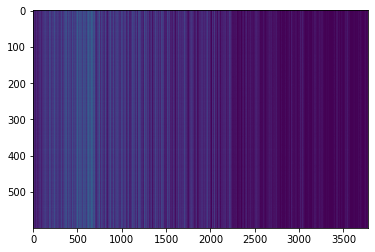

,AUC,pAUC
Source_0,0.665500,0.638947
Source_1,0.749000,0.627895
Source_2,0.823700,0.687895
Target_0,0.605100,0.655263
Target_1,0.753900,0.632632
Target_2,0.673900,0.519474
mean,0.711850,0.627018
h_mean,0.704661,0.622198


2021-05-30 21:01:53,333 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:52643.712240, val_AUC_hmean:0.704661, val_pAUC_hmean:0.622198, best_flag:True
2021-05-30 21:01:53,335 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.61it/s]
2021-05-30 21:01:54,289 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.56it/s]
2021-05-30 21:01:54,347 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 44.72it/s]


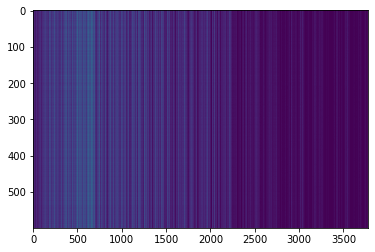

,AUC,pAUC
Source_0,0.660300,0.639474
Source_1,0.763600,0.640000
Source_2,0.826400,0.694737
Target_0,0.598900,0.648421
Target_1,0.766600,0.636316
Target_2,0.665100,0.516316
mean,0.713483,0.629211
h_mean,0.704901,0.623945


2021-05-30 21:01:56,260 - pytorch_modeler.py - INFO - epoch:32/300, train_losses:52172.484049, val_AUC_hmean:0.704901, val_pAUC_hmean:0.623945, best_flag:True
2021-05-30 21:01:56,262 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.89it/s]
2021-05-30 21:01:57,273 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.90it/s]
2021-05-30 21:01:57,328 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 47.31it/s]
2021-05-30 21:01:57,396 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:51889.781901, val_AUC_hmean:0.701566, val_pAUC_hmean:0.622971, best_flag:False
2021-05-30 21:01:57,397 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.85it/s]
2021-05-30 21:01:58,207 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 88.26it/s]
2021-05-30 21:01:58,251 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.71it/s]


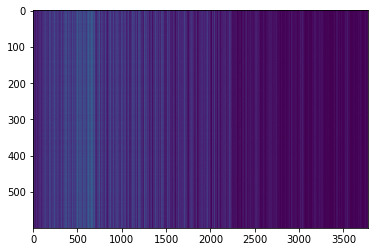

,AUC,pAUC
Source_0,0.664900,0.633158
Source_1,0.752800,0.630000
Source_2,0.823500,0.707368
Target_0,0.594200,0.648421
Target_1,0.760200,0.637368
Target_2,0.684000,0.528947
mean,0.713267,0.630877
h_mean,0.705297,0.626169


2021-05-30 21:01:59,995 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:51653.193359, val_AUC_hmean:0.705297, val_pAUC_hmean:0.626169, best_flag:True
2021-05-30 21:01:59,996 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.41it/s]
2021-05-30 21:02:00,617 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.52it/s]
2021-05-30 21:02:00,661 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.95it/s]
2021-05-30 21:02:00,726 - pytorch_modeler.py - INFO - epoch:35/300, train_losses:51155.746094, val_AUC_hmean:0.703364, val_pAUC_hmean:0.622209, best_flag:False
2021-05-30 21:02:00,728 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.14it/s]
2021-05-30 21:02:01,357 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.49it/s]
2021-05-30 21:02:01,399 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.86it/s]
2021-05-30 21

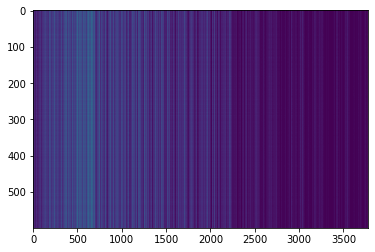

,AUC,pAUC
Source_0,0.673300,0.642105
Source_1,0.756100,0.637895
Source_2,0.813000,0.712632
Target_0,0.603500,0.653684
Target_1,0.768500,0.645789
Target_2,0.686300,0.527895
mean,0.716783,0.636667
h_mean,0.709796,0.631520


2021-05-30 21:02:04,565 - pytorch_modeler.py - INFO - epoch:38/300, train_losses:49864.043945, val_AUC_hmean:0.709796, val_pAUC_hmean:0.631520, best_flag:True
2021-05-30 21:02:04,566 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.68it/s]
2021-05-30 21:02:05,211 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.76it/s]
2021-05-30 21:02:05,265 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.48it/s]
2021-05-30 21:02:05,324 - pytorch_modeler.py - INFO - epoch:39/300, train_losses:49544.461914, val_AUC_hmean:0.713023, val_pAUC_hmean:0.627357, best_flag:False
2021-05-30 21:02:05,325 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.26it/s]
2021-05-30 21:02:05,984 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.63it/s]
2021-05-30 21:02:06,032 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.21it/s]
2021-05-30 21

100%|██████████| 2/2 [00:00<00:00, 45.35it/s]
2021-05-30 21:02:19,173 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 53.73it/s]
2021-05-30 21:02:19,235 - pytorch_modeler.py - INFO - epoch:55/300, train_losses:43957.492513, val_AUC_hmean:0.719189, val_pAUC_hmean:0.618484, best_flag:False
2021-05-30 21:02:19,236 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.56it/s]
2021-05-30 21:02:20,123 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.51it/s]
2021-05-30 21:02:20,191 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 46.85it/s]
2021-05-30 21:02:20,262 - pytorch_modeler.py - INFO - epoch:56/300, train_losses:43604.659831, val_AUC_hmean:0.723806, val_pAUC_hmean:0.628736, best_flag:False
2021-05-30 21:02:20,263 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.32it/s]
2021-05-30 21:02:21,241 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 21:02:35,759 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.53it/s]
2021-05-30 21:02:36,719 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.54it/s]
2021-05-30 21:02:36,789 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.22it/s]
2021-05-30 21:02:36,856 - pytorch_modeler.py - INFO - epoch:72/300, train_losses:38576.894206, val_AUC_hmean:0.716971, val_pAUC_hmean:0.616615, best_flag:False
2021-05-30 21:02:36,859 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.43it/s]
2021-05-30 21:02:37,827 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.76it/s]
2021-05-30 21:02:37,904 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.85it/s]
2021-05-30 21:02:37,972 - pytorch_modeler.py - INFO - epoch:73/300, train_losses:38213.785807, val_AUC_hmean:0.726309, val_pAUC_hmean:0.630035, best_flag:False
2021-05-30 2

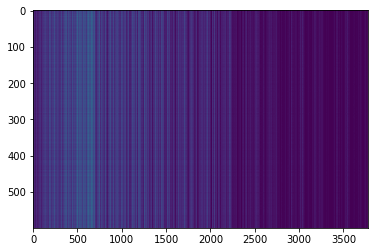

,AUC,pAUC
Source_0,0.739200,0.646842
Source_1,0.764700,0.647368
Source_2,0.824400,0.704737
Target_0,0.636200,0.643158
Target_1,0.803700,0.672632
Target_2,0.676300,0.526842
mean,0.740750,0.640263
h_mean,0.734553,0.634969


2021-05-30 21:02:40,892 - pytorch_modeler.py - INFO - epoch:74/300, train_losses:38010.783529, val_AUC_hmean:0.734553, val_pAUC_hmean:0.634969, best_flag:True
2021-05-30 21:02:40,893 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.51it/s]
2021-05-30 21:02:41,854 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.45it/s]
2021-05-30 21:02:41,929 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 47.13it/s]
2021-05-30 21:02:41,998 - pytorch_modeler.py - INFO - epoch:75/300, train_losses:37706.236979, val_AUC_hmean:0.724217, val_pAUC_hmean:0.622793, best_flag:False
2021-05-30 21:02:41,999 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.68it/s]
2021-05-30 21:02:42,948 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.48it/s]
2021-05-30 21:02:43,024 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 44.57it/s]
2021-05-30 21

100%|██████████| 2/2 [00:00<00:00, 48.97it/s]
2021-05-30 21:03:00,090 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.54it/s]
2021-05-30 21:03:00,154 - pytorch_modeler.py - INFO - epoch:91/300, train_losses:33470.575521, val_AUC_hmean:0.728952, val_pAUC_hmean:0.629425, best_flag:False
2021-05-30 21:03:00,156 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.46it/s]
2021-05-30 21:03:01,121 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 42.79it/s]
2021-05-30 21:03:01,192 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 42.17it/s]
2021-05-30 21:03:01,265 - pytorch_modeler.py - INFO - epoch:92/300, train_losses:33180.867839, val_AUC_hmean:0.733952, val_pAUC_hmean:0.626711, best_flag:False
2021-05-30 21:03:01,266 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.32it/s]
2021-05-30 21:03:02,242 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 21:03:18,060 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.37it/s]
2021-05-30 21:03:19,032 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.41it/s]
2021-05-30 21:03:19,099 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 44.06it/s]
2021-05-30 21:03:19,174 - pytorch_modeler.py - INFO - epoch:108/300, train_losses:29172.309408, val_AUC_hmean:0.736051, val_pAUC_hmean:0.624397, best_flag:False
2021-05-30 21:03:19,176 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.51it/s]
2021-05-30 21:03:20,137 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 40.89it/s]
2021-05-30 21:03:20,211 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.58it/s]
2021-05-30 21:03:20,291 - pytorch_modeler.py - INFO - epoch:109/300, train_losses:29079.041829, val_AUC_hmean:0.734520, val_pAUC_hmean:0.627764, best_flag:False
2021-05-30

100%|██████████| 2/2 [00:00<00:00, 42.77it/s]
2021-05-30 21:03:37,106 - pytorch_modeler.py - INFO - epoch:124/300, train_losses:25657.666829, val_AUC_hmean:0.734607, val_pAUC_hmean:0.625437, best_flag:False
2021-05-30 21:03:37,107 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.39it/s]
2021-05-30 21:03:38,080 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.63it/s]
2021-05-30 21:03:38,149 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 46.73it/s]
2021-05-30 21:03:38,228 - pytorch_modeler.py - INFO - epoch:125/300, train_losses:25448.562663, val_AUC_hmean:0.737085, val_pAUC_hmean:0.621107, best_flag:False
2021-05-30 21:03:38,229 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.42it/s]
2021-05-30 21:03:39,198 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 39.08it/s]
2021-05-30 21:03:39,279 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 12.62it/s]
2021-05-30 21:03:55,966 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.31it/s]
2021-05-30 21:03:56,035 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 47.19it/s]
2021-05-30 21:03:56,109 - pytorch_modeler.py - INFO - epoch:141/300, train_losses:22297.536947, val_AUC_hmean:0.735336, val_pAUC_hmean:0.628588, best_flag:False
2021-05-30 21:03:56,110 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.99it/s]
2021-05-30 21:03:57,112 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.47it/s]
2021-05-30 21:03:57,197 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.79it/s]
2021-05-30 21:03:57,267 - pytorch_modeler.py - INFO - epoch:142/300, train_losses:22163.122721, val_AUC_hmean:0.742423, val_pAUC_hmean:0.632998, best_flag:False
2021-05-30 21:03:57,269 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 42.76it/s]
2021-05-30 21:04:13,767 - pytorch_modeler.py - INFO - epoch:157/300, train_losses:19362.599935, val_AUC_hmean:0.726462, val_pAUC_hmean:0.625206, best_flag:False
2021-05-30 21:04:13,768 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.66it/s]
2021-05-30 21:04:14,721 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.03it/s]
2021-05-30 21:04:14,791 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 46.38it/s]
2021-05-30 21:04:14,862 - pytorch_modeler.py - INFO - epoch:158/300, train_losses:19289.168457, val_AUC_hmean:0.742515, val_pAUC_hmean:0.630656, best_flag:False
2021-05-30 21:04:14,863 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.65it/s]
2021-05-30 21:04:15,815 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 39.81it/s]
2021-05-30 21:04:15,891 - pytorch_modeler.py - INFO - valid_target
100%|█████

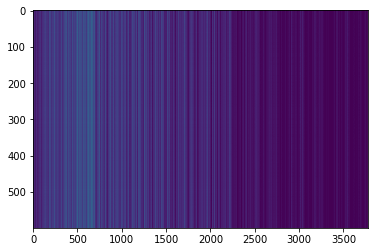

,AUC,pAUC
Source_0,0.758900,0.650526
Source_1,0.767000,0.653684
Source_2,0.828400,0.702105
Target_0,0.654400,0.656842
Target_1,0.799000,0.667368
Target_2,0.645200,0.517895
mean,0.742150,0.641404
h_mean,0.735455,0.635388


2021-05-30 21:04:33,709 - pytorch_modeler.py - INFO - epoch:173/300, train_losses:16838.363688, val_AUC_hmean:0.735455, val_pAUC_hmean:0.635388, best_flag:True
2021-05-30 21:04:33,710 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.31it/s]
2021-05-30 21:04:34,688 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.28it/s]
2021-05-30 21:04:34,764 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.90it/s]
2021-05-30 21:04:34,835 - pytorch_modeler.py - INFO - epoch:174/300, train_losses:16676.004720, val_AUC_hmean:0.734527, val_pAUC_hmean:0.631124, best_flag:False
2021-05-30 21:04:34,836 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.48it/s]
2021-05-30 21:04:35,799 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.03it/s]
2021-05-30 21:04:35,873 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 49.74it/s]
2021-05-30 

100%|██████████| 2/2 [00:00<00:00, 52.46it/s]
2021-05-30 21:04:52,699 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 49.11it/s]
2021-05-30 21:04:52,769 - pytorch_modeler.py - INFO - epoch:190/300, train_losses:14547.729980, val_AUC_hmean:0.737548, val_pAUC_hmean:0.634893, best_flag:False
2021-05-30 21:04:52,770 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.74it/s]
2021-05-30 21:04:53,715 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.81it/s]
2021-05-30 21:04:53,787 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.83it/s]
2021-05-30 21:04:53,856 - pytorch_modeler.py - INFO - epoch:191/300, train_losses:14247.303060, val_AUC_hmean:0.735328, val_pAUC_hmean:0.621742, best_flag:False
2021-05-30 21:04:53,857 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.54it/s]
2021-05-30 21:04:54,816 - pytorch_modeler.py - INFO - valid_source
100%|█████

2021-05-30 21:05:10,526 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.45it/s]
2021-05-30 21:05:11,496 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.45it/s]
2021-05-30 21:05:11,565 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.93it/s]
2021-05-30 21:05:11,635 - pytorch_modeler.py - INFO - epoch:207/300, train_losses:12150.579020, val_AUC_hmean:0.739555, val_pAUC_hmean:0.629170, best_flag:False
2021-05-30 21:05:11,636 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.47it/s]
2021-05-30 21:05:12,600 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.91it/s]
2021-05-30 21:05:12,679 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 47.92it/s]
2021-05-30 21:05:12,745 - pytorch_modeler.py - INFO - epoch:208/300, train_losses:12052.412354, val_AUC_hmean:0.743181, val_pAUC_hmean:0.624999, best_flag:False
2021-05-30

100%|██████████| 2/2 [00:00<00:00, 61.82it/s]
2021-05-30 21:05:28,508 - pytorch_modeler.py - INFO - epoch:223/300, train_losses:10372.807861, val_AUC_hmean:0.742282, val_pAUC_hmean:0.620989, best_flag:False
2021-05-30 21:05:28,510 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.38it/s]
2021-05-30 21:05:29,132 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.49it/s]
2021-05-30 21:05:29,190 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.52it/s]
2021-05-30 21:05:29,256 - pytorch_modeler.py - INFO - epoch:224/300, train_losses:10299.335612, val_AUC_hmean:0.742826, val_pAUC_hmean:0.623796, best_flag:False
2021-05-30 21:05:29,257 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.91it/s]
2021-05-30 21:05:29,899 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.42it/s]
2021-05-30 21:05:29,947 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 19.95it/s]
2021-05-30 21:05:40,685 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.98it/s]
2021-05-30 21:05:40,729 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.16it/s]
2021-05-30 21:05:40,780 - pytorch_modeler.py - INFO - epoch:240/300, train_losses:8703.841390, val_AUC_hmean:0.733708, val_pAUC_hmean:0.616766, best_flag:False
2021-05-30 21:05:40,781 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.31it/s]
2021-05-30 21:05:41,374 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.73it/s]
2021-05-30 21:05:41,417 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.07it/s]
2021-05-30 21:05:41,468 - pytorch_modeler.py - INFO - epoch:241/300, train_losses:8593.194580, val_AUC_hmean:0.729841, val_pAUC_hmean:0.621342, best_flag:False
2021-05-30 21:05:41,469 - pytorch_modeler.py - INFO - train
100%|███████

2021-05-30 21:05:52,398 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.48it/s]
2021-05-30 21:05:53,016 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.13it/s]
2021-05-30 21:05:53,065 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.02it/s]
2021-05-30 21:05:53,120 - pytorch_modeler.py - INFO - epoch:257/300, train_losses:7194.294271, val_AUC_hmean:0.728119, val_pAUC_hmean:0.621222, best_flag:False
2021-05-30 21:05:53,121 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.30it/s]
2021-05-30 21:05:53,745 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.94it/s]
2021-05-30 21:05:53,799 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.33it/s]
2021-05-30 21:05:53,855 - pytorch_modeler.py - INFO - epoch:258/300, train_losses:7155.484090, val_AUC_hmean:0.722563, val_pAUC_hmean:0.618514, best_flag:False
2021-05-30 2

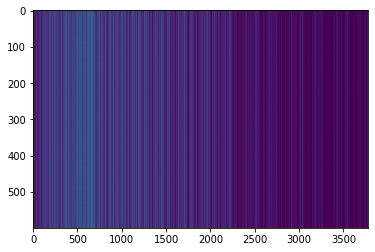

,AUC,pAUC
Source_0,0.77330,0.650000
Source_1,0.76100,0.633684
Source_2,0.83870,0.710526
Target_0,0.66810,0.648421
Target_1,0.78470,0.681053
Target_2,0.65680,0.526842
mean,0.74710,0.641754
h_mean,0.74136,0.636094


2021-05-30 21:05:57,633 - pytorch_modeler.py - INFO - epoch:261/300, train_losses:6969.090454, val_AUC_hmean:0.741360, val_pAUC_hmean:0.636094, best_flag:True
2021-05-30 21:05:57,634 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.54it/s]
2021-05-30 21:05:58,251 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.11it/s]
2021-05-30 21:05:58,307 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.58it/s]
2021-05-30 21:05:58,357 - pytorch_modeler.py - INFO - epoch:262/300, train_losses:6889.375529, val_AUC_hmean:0.738214, val_pAUC_hmean:0.625401, best_flag:False
2021-05-30 21:05:58,358 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.65it/s]
2021-05-30 21:05:58,972 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.75it/s]
2021-05-30 21:05:59,022 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.71it/s]
2021-05-30 21

100%|██████████| 2/2 [00:00<00:00, 72.56it/s]
2021-05-30 21:06:09,601 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.83it/s]
2021-05-30 21:06:09,653 - pytorch_modeler.py - INFO - epoch:278/300, train_losses:5667.948120, val_AUC_hmean:0.726066, val_pAUC_hmean:0.626632, best_flag:False
2021-05-30 21:06:09,655 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.20it/s]
2021-05-30 21:06:10,283 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.90it/s]
2021-05-30 21:06:10,331 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.11it/s]
2021-05-30 21:06:10,383 - pytorch_modeler.py - INFO - epoch:279/300, train_losses:5738.654907, val_AUC_hmean:0.717838, val_pAUC_hmean:0.615285, best_flag:False
2021-05-30 21:06:10,385 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.41it/s]
2021-05-30 21:06:11,006 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 21:06:21,683 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.32it/s]
2021-05-30 21:06:22,378 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 65.46it/s]
2021-05-30 21:06:22,447 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.30it/s]
2021-05-30 21:06:22,513 - pytorch_modeler.py - INFO - epoch:295/300, train_losses:4763.856730, val_AUC_hmean:0.733047, val_pAUC_hmean:0.627160, best_flag:False
2021-05-30 21:06:22,514 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.86it/s]
2021-05-30 21:06:23,153 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.18it/s]
2021-05-30 21:06:23,201 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.92it/s]
2021-05-30 21:06:23,251 - pytorch_modeler.py - INFO - epoch:296/300, train_losses:4760.333333, val_AUC_hmean:0.733474, val_pAUC_hmean:0.622370, best_flag:False
2021-05-30 2

,AUC,pAUC
Source_0,0.77330,0.650000
Source_1,0.76100,0.633684
Source_2,0.83870,0.710526
Target_0,0.66810,0.648421
Target_1,0.78470,0.681053
Target_2,0.65680,0.526842
mean,0.74710,0.641754
h_mean,0.74136,0.636094


2021-05-30 21:06:26,211 - 00_train.py - INFO - TARGET MACHINE_TYPE: gearbox
2021-05-30 21:06:26,212 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 21:06:26,214 - 00_train.py - INFO - TRAINING


elapsed time: 349.546384335 [sec]


2021-05-30 21:06:26,627 - pytorch_modeler.py - INFO - train
 17%|█▋        | 2/12 [00:00<00:00, 18.79it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 19.49it/s]
2021-05-30 21:06:27,246 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.21it/s]
2021-05-30 21:06:27,292 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.50it/s]


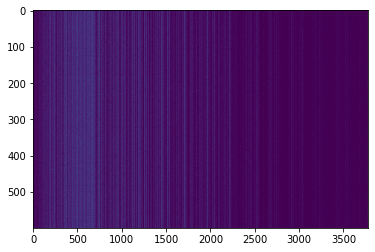

,AUC,pAUC
Source_0,0.512400,0.534211
Source_1,0.574000,0.534737
Source_2,0.567400,0.515789
Target_0,0.473900,0.535263
Target_1,0.636000,0.563158
Target_2,0.484700,0.488421
mean,0.541400,0.528596
h_mean,0.535628,0.527606


2021-05-30 21:06:28,994 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:191991.358073, val_AUC_hmean:0.535628, val_pAUC_hmean:0.527606, best_flag:True
2021-05-30 21:06:28,994 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.16it/s]
2021-05-30 21:06:29,592 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.16it/s]
2021-05-30 21:06:29,637 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.53it/s]


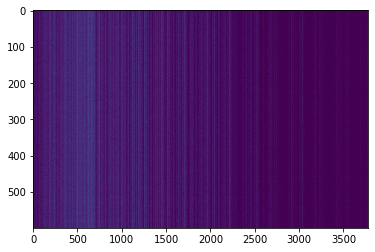

,AUC,pAUC
Source_0,0.538900,0.536316
Source_1,0.581200,0.544737
Source_2,0.635700,0.541053
Target_0,0.500900,0.565789
Target_1,0.654400,0.576842
Target_2,0.603500,0.500000
mean,0.585767,0.544123
h_mean,0.580787,0.543007


2021-05-30 21:06:31,287 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:131451.274740, val_AUC_hmean:0.580787, val_pAUC_hmean:0.543007, best_flag:True
2021-05-30 21:06:31,288 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.11it/s]
2021-05-30 21:06:31,887 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 65.01it/s]
2021-05-30 21:06:31,946 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.97it/s]


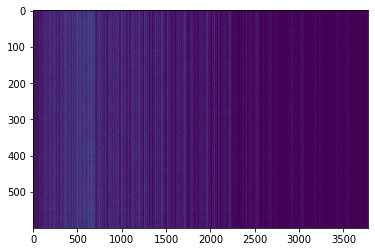

,AUC,pAUC
Source_0,0.547400,0.552105
Source_1,0.603200,0.550526
Source_2,0.667000,0.570526
Target_0,0.522000,0.577895
Target_1,0.680700,0.584737
Target_2,0.640600,0.522632
mean,0.610150,0.559737
h_mean,0.604247,0.558948


2021-05-30 21:06:33,680 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:102327.337240, val_AUC_hmean:0.604247, val_pAUC_hmean:0.558948, best_flag:True
2021-05-30 21:06:33,681 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.98it/s]
2021-05-30 21:06:34,352 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.79it/s]
2021-05-30 21:06:34,397 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.27it/s]
2021-05-30 21:06:34,454 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:87881.527995, val_AUC_hmean:0.610000, val_pAUC_hmean:0.556002, best_flag:False
2021-05-30 21:06:34,455 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.65it/s]
2021-05-30 21:06:35,067 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.30it/s]
2021-05-30 21:06:35,115 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.21it/s]


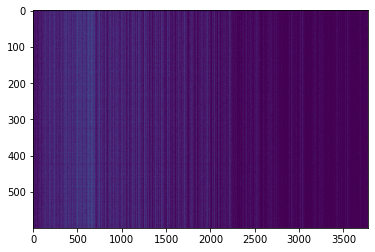

,AUC,pAUC
Source_0,0.554400,0.564737
Source_1,0.647300,0.556842
Source_2,0.742400,0.615789
Target_0,0.516800,0.602632
Target_1,0.680900,0.574737
Target_2,0.653100,0.528947
mean,0.632483,0.573947
h_mean,0.623027,0.572499


2021-05-30 21:06:36,809 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:81065.416667, val_AUC_hmean:0.623027, val_pAUC_hmean:0.572499, best_flag:True
2021-05-30 21:06:36,810 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.76it/s]
2021-05-30 21:06:37,419 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 14.82it/s]
2021-05-30 21:06:37,576 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.95it/s]
2021-05-30 21:06:37,628 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:76482.347656, val_AUC_hmean:0.625356, val_pAUC_hmean:0.569317, best_flag:False
2021-05-30 21:06:37,629 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.05it/s]
2021-05-30 21:06:38,229 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.36it/s]
2021-05-30 21:06:38,283 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.83it/s]


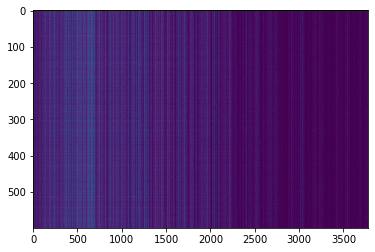

,AUC,pAUC
Source_0,0.573800,0.576316
Source_1,0.665100,0.552105
Source_2,0.793700,0.628947
Target_0,0.525300,0.616842
Target_1,0.694600,0.590000
Target_2,0.632300,0.506842
mean,0.647467,0.578509
h_mean,0.636193,0.575515


2021-05-30 21:06:40,041 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:73689.863281, val_AUC_hmean:0.636193, val_pAUC_hmean:0.575515, best_flag:True
2021-05-30 21:06:40,041 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.03it/s]
2021-05-30 21:06:40,674 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.77it/s]
2021-05-30 21:06:40,724 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.81it/s]


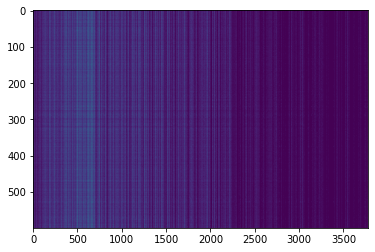

,AUC,pAUC
Source_0,0.595900,0.587895
Source_1,0.686600,0.592105
Source_2,0.792300,0.650526
Target_0,0.539600,0.626316
Target_1,0.715400,0.594211
Target_2,0.609700,0.496316
mean,0.656583,0.591228
h_mean,0.646000,0.586999


2021-05-30 21:06:42,404 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:71330.645182, val_AUC_hmean:0.646000, val_pAUC_hmean:0.586999, best_flag:True
2021-05-30 21:06:42,405 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.68it/s]
2021-05-30 21:06:43,017 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.66it/s]
2021-05-30 21:06:43,067 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.91it/s]


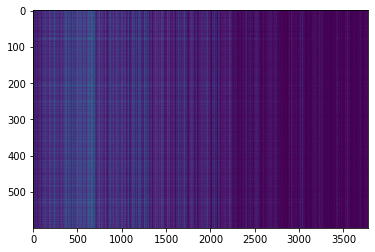

,AUC,pAUC
Source_0,0.599000,0.587895
Source_1,0.696900,0.593158
Source_2,0.790800,0.667368
Target_0,0.544900,0.633158
Target_1,0.709900,0.601579
Target_2,0.592400,0.498421
mean,0.655650,0.596930
h_mean,0.645105,0.592107


2021-05-30 21:06:44,925 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:69773.800130, val_AUC_hmean:0.645105, val_pAUC_hmean:0.592107, best_flag:True
2021-05-30 21:06:44,926 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.24it/s]
2021-05-30 21:06:45,586 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.58it/s]
2021-05-30 21:06:45,632 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.95it/s]


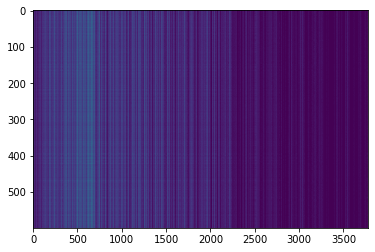

,AUC,pAUC
Source_0,0.593500,0.586842
Source_1,0.703900,0.602105
Source_2,0.790400,0.684737
Target_0,0.543100,0.639474
Target_1,0.725300,0.610000
Target_2,0.567500,0.500526
mean,0.653950,0.603947
h_mean,0.641513,0.598425


2021-05-30 21:06:47,414 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:68255.690755, val_AUC_hmean:0.641513, val_pAUC_hmean:0.598425, best_flag:True
2021-05-30 21:06:47,415 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.83it/s]
2021-05-30 21:06:48,022 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.62it/s]
2021-05-30 21:06:48,075 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.42it/s]
2021-05-30 21:06:48,128 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:66979.404948, val_AUC_hmean:0.657623, val_pAUC_hmean:0.597517, best_flag:False
2021-05-30 21:06:48,129 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.16it/s]
2021-05-30 21:06:48,758 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.01it/s]
2021-05-30 21:06:48,814 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.30it/s]


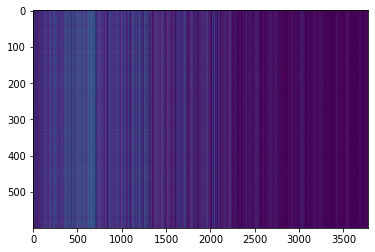

,AUC,pAUC
Source_0,0.607400,0.596316
Source_1,0.723700,0.606316
Source_2,0.791500,0.654737
Target_0,0.554200,0.639474
Target_1,0.736300,0.613158
Target_2,0.570600,0.507368
mean,0.663950,0.602895
h_mean,0.651702,0.598848


2021-05-30 21:06:50,533 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:65858.998698, val_AUC_hmean:0.651702, val_pAUC_hmean:0.598848, best_flag:True
2021-05-30 21:06:50,534 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.86it/s]
2021-05-30 21:06:51,141 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.44it/s]
2021-05-30 21:06:51,185 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.52it/s]
2021-05-30 21:06:51,239 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:64811.780599, val_AUC_hmean:0.647472, val_pAUC_hmean:0.593512, best_flag:False
2021-05-30 21:06:51,240 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.40it/s]
2021-05-30 21:06:51,830 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.67it/s]
2021-05-30 21:06:51,893 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.67it/s]


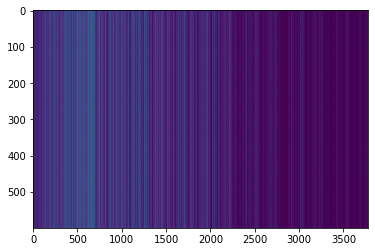

,AUC,pAUC
Source_0,0.622100,0.606842
Source_1,0.726900,0.617895
Source_2,0.813200,0.693158
Target_0,0.566100,0.641579
Target_1,0.733700,0.598421
Target_2,0.579500,0.504737
mean,0.673583,0.610439
h_mean,0.661673,0.604845


2021-05-30 21:06:53,674 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:63893.500651, val_AUC_hmean:0.661673, val_pAUC_hmean:0.604845, best_flag:True
2021-05-30 21:06:53,675 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.59it/s]
2021-05-30 21:06:54,290 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.10it/s]
2021-05-30 21:06:54,339 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.27it/s]


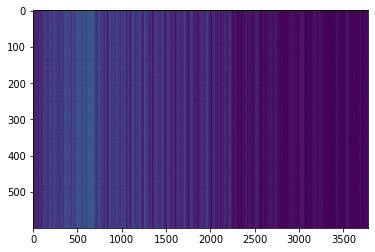

,AUC,pAUC
Source_0,0.623200,0.604211
Source_1,0.715000,0.609474
Source_2,0.829400,0.696316
Target_0,0.568300,0.644211
Target_1,0.733900,0.607368
Target_2,0.594800,0.508947
mean,0.677433,0.611754
h_mean,0.665752,0.606335


2021-05-30 21:06:56,005 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:63226.834635, val_AUC_hmean:0.665752, val_pAUC_hmean:0.606335, best_flag:True
2021-05-30 21:06:56,005 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.21it/s]
2021-05-30 21:06:56,602 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.61it/s]
2021-05-30 21:06:56,646 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.70it/s]


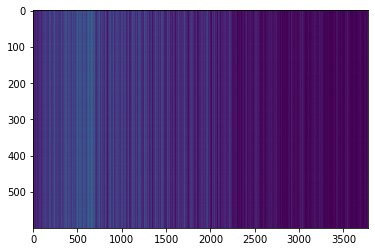

,AUC,pAUC
Source_0,0.637800,0.612632
Source_1,0.702300,0.597895
Source_2,0.814100,0.706842
Target_0,0.587500,0.642632
Target_1,0.726800,0.612105
Target_2,0.635600,0.508947
mean,0.684017,0.613509
h_mean,0.676325,0.607642


2021-05-30 21:06:58,344 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:62618.292318, val_AUC_hmean:0.676325, val_pAUC_hmean:0.607642, best_flag:True
2021-05-30 21:06:58,345 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.70it/s]
2021-05-30 21:06:58,957 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.43it/s]
2021-05-30 21:06:59,005 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.97it/s]


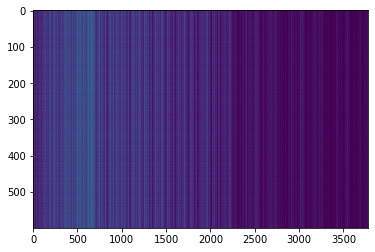

,AUC,pAUC
Source_0,0.642800,0.607895
Source_1,0.719000,0.624737
Source_2,0.822300,0.681579
Target_0,0.578900,0.645789
Target_1,0.737900,0.622105
Target_2,0.651000,0.520526
mean,0.691983,0.617105
h_mean,0.683268,0.612874


2021-05-30 21:07:00,673 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:61547.488932, val_AUC_hmean:0.683268, val_pAUC_hmean:0.612874, best_flag:True
2021-05-30 21:07:00,674 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.20it/s]
2021-05-30 21:07:01,270 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.50it/s]
2021-05-30 21:07:01,313 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.32it/s]


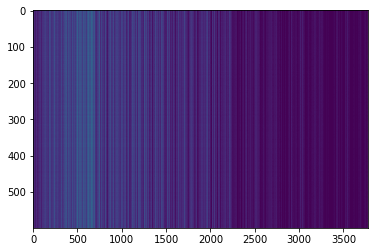

,AUC,pAUC
Source_0,0.652900,0.621579
Source_1,0.732600,0.613684
Source_2,0.829500,0.699474
Target_0,0.595600,0.645789
Target_1,0.741200,0.607368
Target_2,0.646500,0.526842
mean,0.699717,0.619123
h_mean,0.691475,0.614691


2021-05-30 21:07:02,966 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:60882.640625, val_AUC_hmean:0.691475, val_pAUC_hmean:0.614691, best_flag:True
2021-05-30 21:07:02,967 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.99it/s]
2021-05-30 21:07:03,569 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.42it/s]
2021-05-30 21:07:03,614 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.14it/s]
2021-05-30 21:07:03,662 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:60163.606771, val_AUC_hmean:0.681774, val_pAUC_hmean:0.611064, best_flag:False
2021-05-30 21:07:03,663 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.44it/s]
2021-05-30 21:07:04,252 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.33it/s]
2021-05-30 21:07:04,295 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.55it/s]


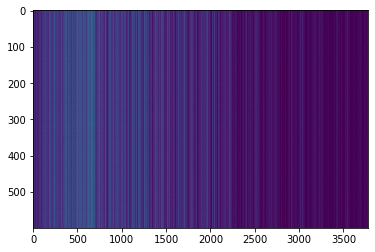

,AUC,pAUC
Source_0,0.643000,0.615789
Source_1,0.734000,0.638947
Source_2,0.826400,0.703684
Target_0,0.585400,0.641579
Target_1,0.762600,0.632632
Target_2,0.658900,0.517895
mean,0.701717,0.625088
h_mean,0.692449,0.619813


2021-05-30 21:07:06,082 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:59623.349935, val_AUC_hmean:0.692449, val_pAUC_hmean:0.619813, best_flag:True
2021-05-30 21:07:06,083 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.15it/s]
2021-05-30 21:07:06,711 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.60it/s]
2021-05-30 21:07:06,759 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.51it/s]
2021-05-30 21:07:06,810 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:59142.629557, val_AUC_hmean:0.696715, val_pAUC_hmean:0.618110, best_flag:False
2021-05-30 21:07:06,812 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.14it/s]
2021-05-30 21:07:07,441 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.30it/s]
2021-05-30 21:07:07,491 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.19it/s]


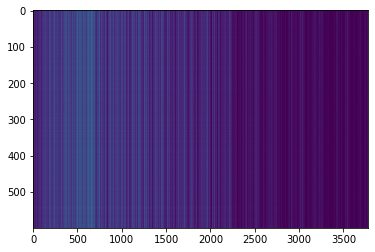

,AUC,pAUC
Source_0,0.636500,0.617895
Source_1,0.720700,0.620000
Source_2,0.823600,0.708947
Target_0,0.588100,0.649474
Target_1,0.751800,0.630526
Target_2,0.679800,0.527895
mean,0.700083,0.625789
h_mean,0.691693,0.620999


2021-05-30 21:07:09,305 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:58469.638997, val_AUC_hmean:0.691693, val_pAUC_hmean:0.620999, best_flag:True
2021-05-30 21:07:09,306 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.96it/s]
2021-05-30 21:07:10,061 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.94it/s]
2021-05-30 21:07:10,117 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.97it/s]


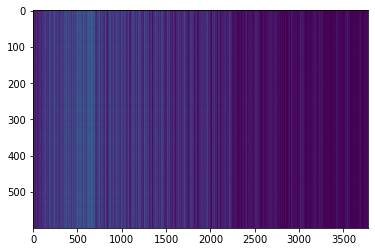

,AUC,pAUC
Source_0,0.646500,0.625263
Source_1,0.745500,0.641053
Source_2,0.838800,0.707368
Target_0,0.589800,0.649474
Target_1,0.756400,0.627895
Target_2,0.667500,0.524737
mean,0.707417,0.629298
h_mean,0.697997,0.624285


2021-05-30 21:07:11,998 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:57900.064128, val_AUC_hmean:0.697997, val_pAUC_hmean:0.624285, best_flag:True
2021-05-30 21:07:12,000 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.67it/s]
2021-05-30 21:07:12,645 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.40it/s]
2021-05-30 21:07:12,695 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.68it/s]
2021-05-30 21:07:12,749 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:57425.536458, val_AUC_hmean:0.695675, val_pAUC_hmean:0.623786, best_flag:False
2021-05-30 21:07:12,750 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.67it/s]
2021-05-30 21:07:13,363 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.06it/s]
2021-05-30 21:07:13,414 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.84it/s]
2021-05-30 21

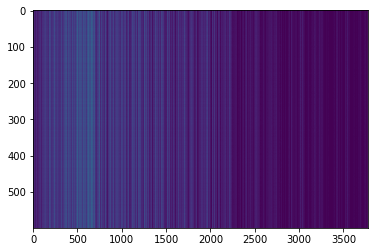

,AUC,pAUC
Source_0,0.653000,0.622105
Source_1,0.749500,0.660000
Source_2,0.803800,0.715789
Target_0,0.593500,0.658421
Target_1,0.790700,0.652105
Target_2,0.674700,0.524737
mean,0.710867,0.638860
h_mean,0.702455,0.633068


2021-05-30 21:07:16,538 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:55985.940430, val_AUC_hmean:0.702455, val_pAUC_hmean:0.633068, best_flag:True
2021-05-30 21:07:16,540 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.79it/s]
2021-05-30 21:07:17,181 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.43it/s]
2021-05-30 21:07:17,235 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.18it/s]
2021-05-30 21:07:17,290 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:55754.487630, val_AUC_hmean:0.693761, val_pAUC_hmean:0.611147, best_flag:False
2021-05-30 21:07:17,291 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.40it/s]
2021-05-30 21:07:17,912 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.65it/s]
2021-05-30 21:07:17,971 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.75it/s]
2021-05-30 21

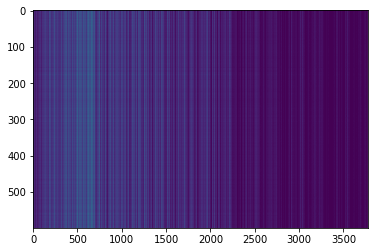

,AUC,pAUC
Source_0,0.684800,0.633684
Source_1,0.760800,0.654211
Source_2,0.819700,0.715263
Target_0,0.616100,0.653158
Target_1,0.789100,0.647895
Target_2,0.684500,0.533684
mean,0.725833,0.639649
h_mean,0.718912,0.634721


2021-05-30 21:07:22,689 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:53318.192708, val_AUC_hmean:0.718912, val_pAUC_hmean:0.634721, best_flag:True
2021-05-30 21:07:22,695 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.86it/s]
2021-05-30 21:07:23,301 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.64it/s]
2021-05-30 21:07:23,348 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.66it/s]
2021-05-30 21:07:23,396 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:53005.941732, val_AUC_hmean:0.703154, val_pAUC_hmean:0.616388, best_flag:False
2021-05-30 21:07:23,398 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.25it/s]
2021-05-30 21:07:23,992 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.11it/s]
2021-05-30 21:07:24,037 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.89it/s]
2021-05-30 21

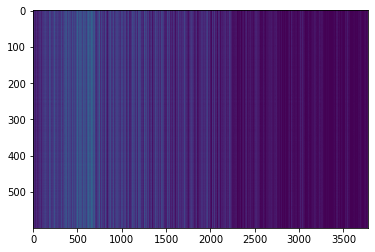

,AUC,pAUC
Source_0,0.701200,0.641053
Source_1,0.770400,0.663158
Source_2,0.821100,0.710526
Target_0,0.611100,0.654211
Target_1,0.803600,0.654737
Target_2,0.680500,0.523158
mean,0.731317,0.641140
h_mean,0.723560,0.635416


2021-05-30 21:07:32,133 - pytorch_modeler.py - INFO - epoch:44/300, train_losses:49191.216471, val_AUC_hmean:0.723560, val_pAUC_hmean:0.635416, best_flag:True
2021-05-30 21:07:32,134 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.49it/s]
2021-05-30 21:07:32,786 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 14.68it/s]
2021-05-30 21:07:32,944 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.70it/s]
2021-05-30 21:07:32,994 - pytorch_modeler.py - INFO - epoch:45/300, train_losses:48806.816406, val_AUC_hmean:0.717812, val_pAUC_hmean:0.625582, best_flag:False
2021-05-30 21:07:32,995 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.76it/s]
2021-05-30 21:07:33,605 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.50it/s]
2021-05-30 21:07:33,650 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.25it/s]
2021-05-30 21

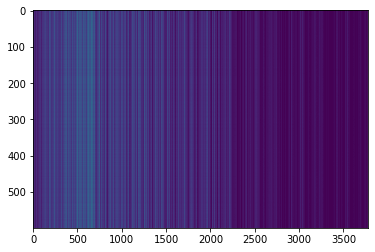

,AUC,pAUC
Source_0,0.711000,0.633684
Source_1,0.768700,0.674737
Source_2,0.813000,0.703158
Target_0,0.622800,0.654211
Target_1,0.830700,0.701579
Target_2,0.681800,0.526842
mean,0.738000,0.649035
h_mean,0.730501,0.642790


2021-05-30 21:07:41,176 - pytorch_modeler.py - INFO - epoch:54/300, train_losses:45874.293945, val_AUC_hmean:0.730501, val_pAUC_hmean:0.642790, best_flag:True
2021-05-30 21:07:41,177 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.78it/s]
2021-05-30 21:07:41,786 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.12it/s]
2021-05-30 21:07:41,836 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.64it/s]
2021-05-30 21:07:41,886 - pytorch_modeler.py - INFO - epoch:55/300, train_losses:45413.635091, val_AUC_hmean:0.723674, val_pAUC_hmean:0.629283, best_flag:False
2021-05-30 21:07:41,887 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.38it/s]
2021-05-30 21:07:42,508 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.34it/s]
2021-05-30 21:07:42,566 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.46it/s]
2021-05-30 21

100%|██████████| 2/2 [00:00<00:00, 80.18it/s]
2021-05-30 21:07:53,641 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.01it/s]
2021-05-30 21:07:53,692 - pytorch_modeler.py - INFO - epoch:71/300, train_losses:40382.089193, val_AUC_hmean:0.733154, val_pAUC_hmean:0.630915, best_flag:False
2021-05-30 21:07:53,694 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.06it/s]
2021-05-30 21:07:54,294 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.64it/s]
2021-05-30 21:07:54,342 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.84it/s]
2021-05-30 21:07:54,390 - pytorch_modeler.py - INFO - epoch:72/300, train_losses:39988.288737, val_AUC_hmean:0.732619, val_pAUC_hmean:0.628445, best_flag:False
2021-05-30 21:07:54,391 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.35it/s]
2021-05-30 21:07:54,983 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 21:08:05,577 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.51it/s]
2021-05-30 21:08:06,228 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.51it/s]
2021-05-30 21:08:06,281 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.86it/s]
2021-05-30 21:08:06,340 - pytorch_modeler.py - INFO - epoch:88/300, train_losses:35528.670573, val_AUC_hmean:0.732014, val_pAUC_hmean:0.630590, best_flag:False
2021-05-30 21:08:06,341 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.26it/s]
2021-05-30 21:08:07,001 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.12it/s]
2021-05-30 21:08:07,060 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.38it/s]
2021-05-30 21:08:07,123 - pytorch_modeler.py - INFO - epoch:89/300, train_losses:35309.930339, val_AUC_hmean:0.740532, val_pAUC_hmean:0.633156, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 62.20it/s]
2021-05-30 21:08:21,648 - pytorch_modeler.py - INFO - epoch:104/300, train_losses:31518.374186, val_AUC_hmean:0.731806, val_pAUC_hmean:0.630693, best_flag:False
2021-05-30 21:08:21,650 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.09it/s]
2021-05-30 21:08:22,645 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.96it/s]
2021-05-30 21:08:22,718 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.48it/s]
2021-05-30 21:08:22,770 - pytorch_modeler.py - INFO - epoch:105/300, train_losses:31215.983236, val_AUC_hmean:0.742140, val_pAUC_hmean:0.637626, best_flag:False
2021-05-30 21:08:22,771 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.53it/s]
2021-05-30 21:08:23,388 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.67it/s]
2021-05-30 21:08:23,442 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:01<00:00, 12.00it/s]
2021-05-30 21:08:37,050 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 41.00it/s]
2021-05-30 21:08:37,125 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 57.99it/s]
2021-05-30 21:08:37,192 - pytorch_modeler.py - INFO - epoch:121/300, train_losses:27467.497233, val_AUC_hmean:0.732290, val_pAUC_hmean:0.627571, best_flag:False
2021-05-30 21:08:37,193 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.70it/s]
2021-05-30 21:08:38,220 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.64it/s]
2021-05-30 21:08:38,299 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.65it/s]
2021-05-30 21:08:38,367 - pytorch_modeler.py - INFO - epoch:122/300, train_losses:27317.166667, val_AUC_hmean:0.743889, val_pAUC_hmean:0.630253, best_flag:False
2021-05-30 21:08:38,369 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 54.11it/s]
2021-05-30 21:08:54,917 - pytorch_modeler.py - INFO - epoch:137/300, train_losses:24360.069987, val_AUC_hmean:0.739508, val_pAUC_hmean:0.632010, best_flag:False
2021-05-30 21:08:54,918 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.47it/s]
2021-05-30 21:08:55,882 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.33it/s]
2021-05-30 21:08:55,943 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 53.03it/s]
2021-05-30 21:08:56,026 - pytorch_modeler.py - INFO - epoch:138/300, train_losses:24128.774577, val_AUC_hmean:0.745803, val_pAUC_hmean:0.632016, best_flag:False
2021-05-30 21:08:56,028 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.45it/s]
2021-05-30 21:08:56,684 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.28it/s]
2021-05-30 21:08:56,731 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 19.18it/s]
2021-05-30 21:09:07,606 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.19it/s]
2021-05-30 21:09:07,652 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.98it/s]
2021-05-30 21:09:07,702 - pytorch_modeler.py - INFO - epoch:154/300, train_losses:20936.644043, val_AUC_hmean:0.742031, val_pAUC_hmean:0.624918, best_flag:False
2021-05-30 21:09:07,703 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.77it/s]
2021-05-30 21:09:08,313 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.57it/s]
2021-05-30 21:09:08,366 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.46it/s]
2021-05-30 21:09:08,423 - pytorch_modeler.py - INFO - epoch:155/300, train_losses:20730.036133, val_AUC_hmean:0.738795, val_pAUC_hmean:0.624030, best_flag:False
2021-05-30 21:09:08,424 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 75.67it/s]
2021-05-30 21:09:19,915 - pytorch_modeler.py - INFO - epoch:170/300, train_losses:18298.980794, val_AUC_hmean:0.739068, val_pAUC_hmean:0.631099, best_flag:False
2021-05-30 21:09:19,917 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.39it/s]
2021-05-30 21:09:20,571 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.95it/s]
2021-05-30 21:09:20,624 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.62it/s]
2021-05-30 21:09:20,682 - pytorch_modeler.py - INFO - epoch:171/300, train_losses:18055.307943, val_AUC_hmean:0.734440, val_pAUC_hmean:0.625245, best_flag:False
2021-05-30 21:09:20,684 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.49it/s]
2021-05-30 21:09:21,334 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.69it/s]
2021-05-30 21:09:21,386 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 15.65it/s]
2021-05-30 21:09:33,861 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.82it/s]
2021-05-30 21:09:33,926 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.05it/s]
2021-05-30 21:09:34,002 - pytorch_modeler.py - INFO - epoch:187/300, train_losses:15585.760579, val_AUC_hmean:0.749357, val_pAUC_hmean:0.633666, best_flag:False
2021-05-30 21:09:34,004 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.25it/s]
2021-05-30 21:09:34,912 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.63it/s]
2021-05-30 21:09:34,969 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 57.87it/s]
2021-05-30 21:09:35,036 - pytorch_modeler.py - INFO - epoch:188/300, train_losses:15428.676839, val_AUC_hmean:0.732721, val_pAUC_hmean:0.619447, best_flag:False
2021-05-30 21:09:35,037 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 53.08it/s]
2021-05-30 21:09:48,254 - pytorch_modeler.py - INFO - epoch:203/300, train_losses:13474.512695, val_AUC_hmean:0.744794, val_pAUC_hmean:0.626059, best_flag:False
2021-05-30 21:09:48,255 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.70it/s]
2021-05-30 21:09:49,135 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.32it/s]
2021-05-30 21:09:49,227 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 36.40it/s]
2021-05-30 21:09:49,318 - pytorch_modeler.py - INFO - epoch:204/300, train_losses:13229.007894, val_AUC_hmean:0.729033, val_pAUC_hmean:0.624853, best_flag:False
2021-05-30 21:09:49,319 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.93it/s]
2021-05-30 21:09:50,029 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.27it/s]
2021-05-30 21:09:50,079 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 17.64it/s]
2021-05-30 21:10:03,628 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.41it/s]
2021-05-30 21:10:03,680 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.77it/s]
2021-05-30 21:10:03,740 - pytorch_modeler.py - INFO - epoch:220/300, train_losses:11376.052165, val_AUC_hmean:0.727875, val_pAUC_hmean:0.626252, best_flag:False
2021-05-30 21:10:03,742 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.69it/s]
2021-05-30 21:10:04,353 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.51it/s]
2021-05-30 21:10:04,399 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.45it/s]
2021-05-30 21:10:04,456 - pytorch_modeler.py - INFO - epoch:221/300, train_losses:11285.672933, val_AUC_hmean:0.729777, val_pAUC_hmean:0.622564, best_flag:False
2021-05-30 21:10:04,457 - pytorch_modeler.py - INFO - train
100%|█████

2021-05-30 21:10:18,307 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.71it/s]
2021-05-30 21:10:19,125 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.36it/s]
2021-05-30 21:10:19,189 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.30it/s]
2021-05-30 21:10:19,248 - pytorch_modeler.py - INFO - epoch:237/300, train_losses:9588.540527, val_AUC_hmean:0.736950, val_pAUC_hmean:0.619101, best_flag:False
2021-05-30 21:10:19,249 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.73it/s]
2021-05-30 21:10:20,193 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.48it/s]
2021-05-30 21:10:20,254 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 36.99it/s]
2021-05-30 21:10:20,338 - pytorch_modeler.py - INFO - epoch:238/300, train_losses:9540.997559, val_AUC_hmean:0.744642, val_pAUC_hmean:0.627009, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 52.73it/s]
2021-05-30 21:10:35,738 - pytorch_modeler.py - INFO - epoch:253/300, train_losses:8191.607951, val_AUC_hmean:0.730125, val_pAUC_hmean:0.619410, best_flag:False
2021-05-30 21:10:35,740 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.53it/s]
2021-05-30 21:10:36,391 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.86it/s]
2021-05-30 21:10:36,438 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.27it/s]
2021-05-30 21:10:36,497 - pytorch_modeler.py - INFO - epoch:254/300, train_losses:7998.914225, val_AUC_hmean:0.732008, val_pAUC_hmean:0.620009, best_flag:False
2021-05-30 21:10:36,498 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.01it/s]
2021-05-30 21:10:37,131 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.98it/s]
2021-05-30 21:10:37,185 - pytorch_modeler.py - INFO - valid_target
100%|███████

100%|██████████| 12/12 [00:00<00:00, 12.04it/s]
2021-05-30 21:10:52,633 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.80it/s]
2021-05-30 21:10:52,696 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.57it/s]
2021-05-30 21:10:52,762 - pytorch_modeler.py - INFO - epoch:270/300, train_losses:6649.075358, val_AUC_hmean:0.737106, val_pAUC_hmean:0.623851, best_flag:False
2021-05-30 21:10:52,764 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.60it/s]
2021-05-30 21:10:53,802 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.33it/s]
2021-05-30 21:10:53,871 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.75it/s]
2021-05-30 21:10:53,935 - pytorch_modeler.py - INFO - epoch:271/300, train_losses:6579.807170, val_AUC_hmean:0.731691, val_pAUC_hmean:0.620166, best_flag:False
2021-05-30 21:10:53,937 - pytorch_modeler.py - INFO - train
100%|███████

2021-05-30 21:11:06,037 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.82it/s]
2021-05-30 21:11:06,644 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.75it/s]
2021-05-30 21:11:06,690 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.30it/s]
2021-05-30 21:11:06,738 - pytorch_modeler.py - INFO - epoch:287/300, train_losses:5441.888468, val_AUC_hmean:0.737692, val_pAUC_hmean:0.619868, best_flag:False
2021-05-30 21:11:06,739 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.90it/s]
2021-05-30 21:11:07,345 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.91it/s]
2021-05-30 21:11:07,396 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.88it/s]
2021-05-30 21:11:07,449 - pytorch_modeler.py - INFO - epoch:288/300, train_losses:5437.742065, val_AUC_hmean:0.736810, val_pAUC_hmean:0.623613, best_flag:False
2021-05-30 2

,AUC,pAUC
Source_0,0.711000,0.633684
Source_1,0.768700,0.674737
Source_2,0.813000,0.703158
Target_0,0.622800,0.654211
Target_1,0.830700,0.701579
Target_2,0.681800,0.526842
mean,0.738000,0.649035
h_mean,0.730501,0.642790


2021-05-30 21:11:16,173 - 00_train.py - INFO - TARGET MACHINE_TYPE: valve
2021-05-30 21:11:16,174 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 21:11:16,192 - 00_train.py - INFO - TRAINING


elapsed time: 289.961305141 [sec]


2021-05-30 21:11:16,608 - pytorch_modeler.py - INFO - train
 17%|█▋        | 2/12 [00:00<00:00, 17.92it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 18.17it/s]
2021-05-30 21:11:17,271 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.37it/s]
2021-05-30 21:11:17,330 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.72it/s]


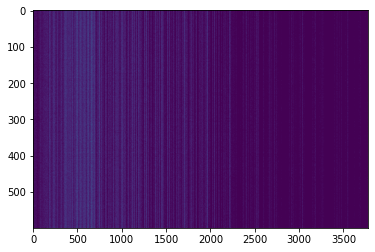

,AUC,pAUC
Source_0,0.516000,0.546842
Source_1,0.572600,0.527368
Source_2,0.574800,0.525789
Target_0,0.482500,0.554737
Target_1,0.668750,0.622105
Target_2,0.513300,0.494737
mean,0.554658,0.545263
h_mean,0.548437,0.542585


2021-05-30 21:11:19,499 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:190431.914062, val_AUC_hmean:0.548437, val_pAUC_hmean:0.542585, best_flag:True
2021-05-30 21:11:19,500 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.36it/s]
2021-05-30 21:11:20,158 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.57it/s]
2021-05-30 21:11:20,235 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 46.63it/s]


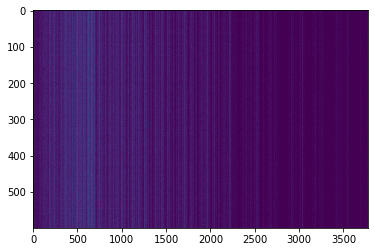

,AUC,pAUC
Source_0,0.540500,0.551053
Source_1,0.607600,0.554211
Source_2,0.654600,0.551579
Target_0,0.509900,0.584211
Target_1,0.708000,0.577368
Target_2,0.586000,0.492105
mean,0.601100,0.551754
h_mean,0.593842,0.550063


2021-05-30 21:11:22,448 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:129296.975911, val_AUC_hmean:0.593842, val_pAUC_hmean:0.550063, best_flag:True
2021-05-30 21:11:22,449 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.40it/s]
2021-05-30 21:11:23,286 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.42it/s]
2021-05-30 21:11:23,358 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.86it/s]


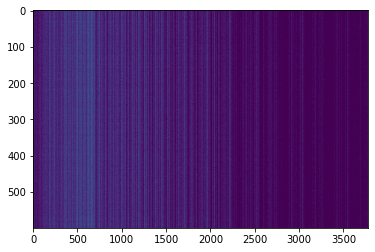

,AUC,pAUC
Source_0,0.56090,0.565789
Source_1,0.64540,0.587895
Source_2,0.68690,0.595789
Target_0,0.54200,0.603684
Target_1,0.71080,0.571053
Target_2,0.60700,0.501579
mean,0.62550,0.570965
h_mean,0.61936,0.568816


2021-05-30 21:11:25,413 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:100050.741536, val_AUC_hmean:0.619360, val_pAUC_hmean:0.568816, best_flag:True
2021-05-30 21:11:25,414 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.06it/s]
2021-05-30 21:11:26,120 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.38it/s]
2021-05-30 21:11:26,182 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.47it/s]


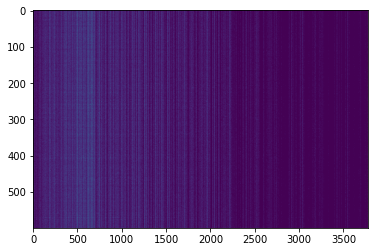

,AUC,pAUC
Source_0,0.565000,0.564211
Source_1,0.661000,0.587368
Source_2,0.739800,0.651579
Target_0,0.546600,0.600526
Target_1,0.701900,0.564737
Target_2,0.624800,0.506842
mean,0.639850,0.579211
h_mean,0.632298,0.575895


2021-05-30 21:11:28,294 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:85773.384115, val_AUC_hmean:0.632298, val_pAUC_hmean:0.575895, best_flag:True
2021-05-30 21:11:28,295 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 12.00it/s]
2021-05-30 21:11:29,298 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.40it/s]
2021-05-30 21:11:29,353 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.05it/s]


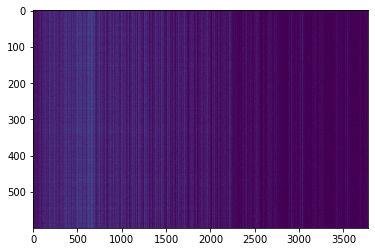

,AUC,pAUC
Source_0,0.576600,0.572632
Source_1,0.675300,0.595263
Source_2,0.781400,0.670000
Target_0,0.554700,0.606316
Target_1,0.700700,0.570526
Target_2,0.637100,0.504211
mean,0.654300,0.586491
h_mean,0.645549,0.582289


2021-05-30 21:11:31,552 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:78701.938151, val_AUC_hmean:0.645549, val_pAUC_hmean:0.582289, best_flag:True
2021-05-30 21:11:31,553 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.50it/s]
2021-05-30 21:11:32,515 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.95it/s]
2021-05-30 21:11:32,581 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.44it/s]


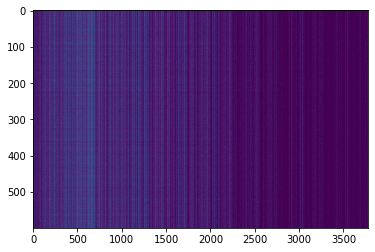

,AUC,pAUC
Source_0,0.577100,0.584737
Source_1,0.678400,0.573158
Source_2,0.799900,0.662105
Target_0,0.543500,0.615263
Target_1,0.700000,0.583684
Target_2,0.629500,0.504211
mean,0.654733,0.587193
h_mean,0.644186,0.583255


2021-05-30 21:11:34,699 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:74415.665365, val_AUC_hmean:0.644186, val_pAUC_hmean:0.583255, best_flag:True
2021-05-30 21:11:34,701 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.03it/s]
2021-05-30 21:11:35,701 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.59it/s]
2021-05-30 21:11:35,756 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.28it/s]


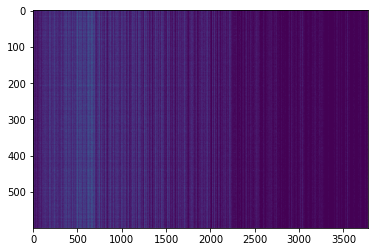

,AUC,pAUC
Source_0,0.584100,0.586842
Source_1,0.697500,0.589474
Source_2,0.792400,0.643158
Target_0,0.549900,0.631579
Target_1,0.704500,0.579474
Target_2,0.586100,0.500000
mean,0.652417,0.588421
h_mean,0.641583,0.584549


2021-05-30 21:11:37,845 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:71582.018880, val_AUC_hmean:0.641583, val_pAUC_hmean:0.584549, best_flag:True
2021-05-30 21:11:37,846 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.84it/s]
2021-05-30 21:11:38,783 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 65.17it/s]
2021-05-30 21:11:38,842 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 53.81it/s]


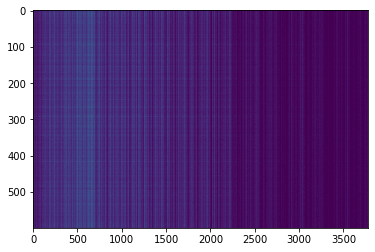

,AUC,pAUC
Source_0,0.591600,0.595263
Source_1,0.701200,0.608421
Source_2,0.784900,0.654737
Target_0,0.559100,0.625789
Target_1,0.703300,0.594737
Target_2,0.614000,0.501579
mean,0.659017,0.596754
h_mean,0.650080,0.592653


2021-05-30 21:11:40,832 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:69457.565755, val_AUC_hmean:0.650080, val_pAUC_hmean:0.592653, best_flag:True
2021-05-30 21:11:40,833 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.68it/s]
2021-05-30 21:11:41,514 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.44it/s]
2021-05-30 21:11:41,571 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 41.96it/s]
2021-05-30 21:11:41,664 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:67799.924479, val_AUC_hmean:0.649251, val_pAUC_hmean:0.592187, best_flag:False
2021-05-30 21:11:41,667 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.83it/s]
2021-05-30 21:11:42,478 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.74it/s]
2021-05-30 21:11:42,525 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.02it/s]
2021-05-30 21:1

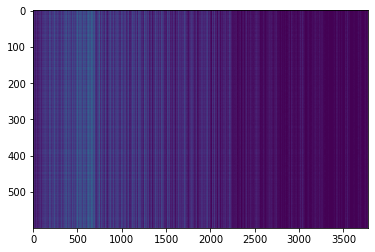

,AUC,pAUC
Source_0,0.631200,0.605263
Source_1,0.708500,0.621053
Source_2,0.822300,0.668421
Target_0,0.584400,0.628421
Target_1,0.706200,0.606316
Target_2,0.659000,0.515789
mean,0.685267,0.607544
h_mean,0.677472,0.603757


2021-05-30 21:11:47,206 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:63400.878581, val_AUC_hmean:0.677472, val_pAUC_hmean:0.603757, best_flag:True
2021-05-30 21:11:47,206 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.70it/s]
2021-05-30 21:11:48,085 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 65.69it/s]
2021-05-30 21:11:48,141 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.66it/s]


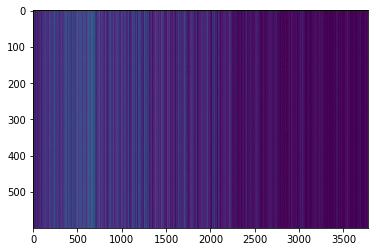

,AUC,pAUC
Source_0,0.638500,0.620526
Source_1,0.726900,0.623684
Source_2,0.807700,0.701579
Target_0,0.590600,0.637368
Target_1,0.707000,0.594737
Target_2,0.648100,0.508947
mean,0.686467,0.614474
h_mean,0.679459,0.608799


2021-05-30 21:11:50,189 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:62660.222982, val_AUC_hmean:0.679459, val_pAUC_hmean:0.608799, best_flag:True
2021-05-30 21:11:50,191 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.01it/s]
2021-05-30 21:11:50,943 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.51it/s]
2021-05-30 21:11:50,997 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.09it/s]
2021-05-30 21:11:51,049 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:61827.299805, val_AUC_hmean:0.679177, val_pAUC_hmean:0.607211, best_flag:False
2021-05-30 21:11:51,050 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.92it/s]
2021-05-30 21:11:51,655 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.93it/s]
2021-05-30 21:11:51,705 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.59it/s]
2021-05-30 21

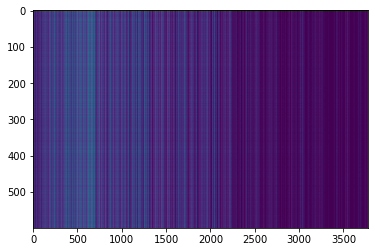

,AUC,pAUC
Source_0,0.650000,0.612632
Source_1,0.722900,0.620526
Source_2,0.817900,0.707895
Target_0,0.608000,0.637895
Target_1,0.733300,0.616316
Target_2,0.662500,0.514737
mean,0.699100,0.618333
h_mean,0.692657,0.612907


2021-05-30 21:11:55,629 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:59931.704427, val_AUC_hmean:0.692657, val_pAUC_hmean:0.612907, best_flag:True
2021-05-30 21:11:55,630 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.25it/s]
2021-05-30 21:11:56,372 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.69it/s]
2021-05-30 21:11:56,423 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.38it/s]
2021-05-30 21:11:56,489 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:59003.800781, val_AUC_hmean:0.682360, val_pAUC_hmean:0.609434, best_flag:False
2021-05-30 21:11:56,490 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.72it/s]
2021-05-30 21:11:57,102 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.41it/s]
2021-05-30 21:11:57,147 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.32it/s]


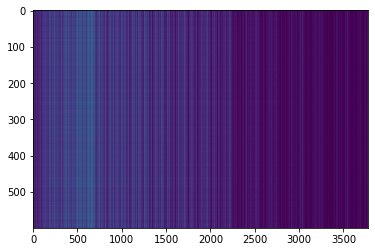

,AUC,pAUC
Source_0,0.658500,0.624211
Source_1,0.743400,0.637895
Source_2,0.794400,0.697895
Target_0,0.619700,0.638947
Target_1,0.735400,0.608947
Target_2,0.642200,0.505789
mean,0.698933,0.618947
h_mean,0.693383,0.613063


2021-05-30 21:11:59,043 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:58440.458333, val_AUC_hmean:0.693383, val_pAUC_hmean:0.613063, best_flag:True
2021-05-30 21:11:59,045 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.49it/s]
2021-05-30 21:11:59,737 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 72.15it/s]
2021-05-30 21:11:59,791 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.14it/s]


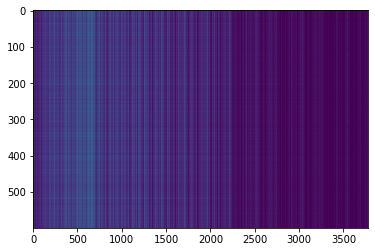

,AUC,pAUC
Source_0,0.663800,0.632105
Source_1,0.758100,0.643684
Source_2,0.811600,0.701579
Target_0,0.619500,0.641579
Target_1,0.747300,0.603158
Target_2,0.628100,0.503684
mean,0.704733,0.620965
h_mean,0.697499,0.614572


2021-05-30 21:12:01,833 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:57908.019206, val_AUC_hmean:0.697499, val_pAUC_hmean:0.614572, best_flag:True
2021-05-30 21:12:01,833 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.20it/s]
2021-05-30 21:12:02,681 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.84it/s]
2021-05-30 21:12:02,728 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.41it/s]
2021-05-30 21:12:02,783 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:57319.469727, val_AUC_hmean:0.705258, val_pAUC_hmean:0.611490, best_flag:False
2021-05-30 21:12:02,783 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.55it/s]
2021-05-30 21:12:03,472 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.22it/s]
2021-05-30 21:12:03,536 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 49.89it/s]
2021-05-30 21

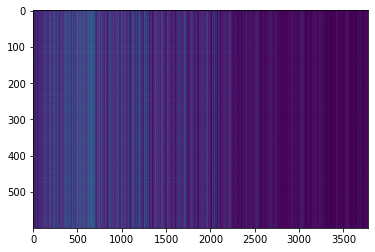

,AUC,pAUC
Source_0,0.689100,0.633158
Source_1,0.757700,0.640526
Source_2,0.806700,0.717368
Target_0,0.612700,0.636842
Target_1,0.754800,0.626316
Target_2,0.682300,0.521579
mean,0.717217,0.629298
h_mean,0.711476,0.623783


2021-05-30 21:12:07,839 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:55956.867188, val_AUC_hmean:0.711476, val_pAUC_hmean:0.623783, best_flag:True
2021-05-30 21:12:07,841 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.28it/s]
2021-05-30 21:12:08,580 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.35it/s]
2021-05-30 21:12:08,640 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.18it/s]
2021-05-30 21:12:08,715 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:55465.832031, val_AUC_hmean:0.706454, val_pAUC_hmean:0.620963, best_flag:False
2021-05-30 21:12:08,716 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.76it/s]
2021-05-30 21:12:09,480 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.33it/s]
2021-05-30 21:12:09,528 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.44it/s]
2021-05-30 21

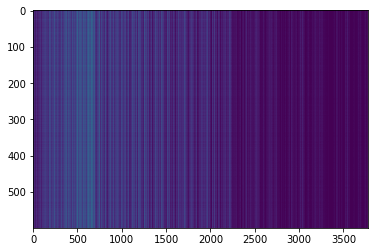

,AUC,pAUC
Source_0,0.678000,0.636316
Source_1,0.744600,0.644211
Source_2,0.822800,0.698421
Target_0,0.618300,0.648421
Target_1,0.765500,0.638947
Target_2,0.674300,0.512632
mean,0.717250,0.629825
h_mean,0.710902,0.624113


2021-05-30 21:12:15,432 - pytorch_modeler.py - INFO - epoch:32/300, train_losses:52762.323893, val_AUC_hmean:0.710902, val_pAUC_hmean:0.624113, best_flag:True
2021-05-30 21:12:15,433 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.50it/s]
2021-05-30 21:12:16,084 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.87it/s]
2021-05-30 21:12:16,133 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.17it/s]


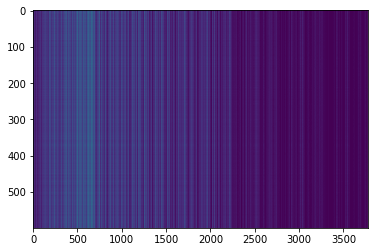

,AUC,pAUC
Source_0,0.695000,0.646842
Source_1,0.744500,0.633684
Source_2,0.825500,0.717895
Target_0,0.631000,0.657368
Target_1,0.756400,0.636316
Target_2,0.675600,0.522105
mean,0.721333,0.635702
h_mean,0.715954,0.629915


2021-05-30 21:12:18,029 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:52498.027344, val_AUC_hmean:0.715954, val_pAUC_hmean:0.629915, best_flag:True
2021-05-30 21:12:18,031 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.09it/s]
2021-05-30 21:12:19,026 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.96it/s]
2021-05-30 21:12:19,089 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 44.04it/s]
2021-05-30 21:12:19,168 - pytorch_modeler.py - INFO - epoch:34/300, train_losses:52185.146810, val_AUC_hmean:0.699630, val_pAUC_hmean:0.621348, best_flag:False
2021-05-30 21:12:19,169 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.33it/s]
2021-05-30 21:12:20,144 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.91it/s]
2021-05-30 21:12:20,209 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.49it/s]
2021-05-30 21

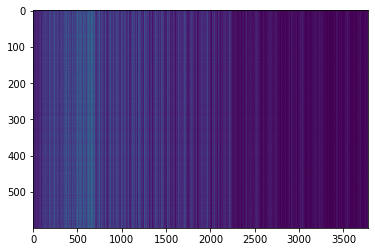

,AUC,pAUC
Source_0,0.698200,0.630000
Source_1,0.766100,0.683684
Source_2,0.819300,0.705789
Target_0,0.614600,0.648421
Target_1,0.785900,0.660000
Target_2,0.683700,0.523684
mean,0.727967,0.641930
h_mean,0.721132,0.636016


2021-05-30 21:12:27,018 - pytorch_modeler.py - INFO - epoch:40/300, train_losses:49734.991862, val_AUC_hmean:0.721132, val_pAUC_hmean:0.636016, best_flag:True
2021-05-30 21:12:27,019 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.38it/s]
2021-05-30 21:12:27,990 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.02it/s]
2021-05-30 21:12:28,053 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.06it/s]
2021-05-30 21:12:28,116 - pytorch_modeler.py - INFO - epoch:41/300, train_losses:49253.701497, val_AUC_hmean:0.701641, val_pAUC_hmean:0.614320, best_flag:False
2021-05-30 21:12:28,117 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.45it/s]
2021-05-30 21:12:28,807 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.56it/s]
2021-05-30 21:12:28,861 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.17it/s]
2021-05-30 21

100%|██████████| 2/2 [00:00<00:00, 70.28it/s]
2021-05-30 21:12:42,350 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.87it/s]
2021-05-30 21:12:42,401 - pytorch_modeler.py - INFO - epoch:57/300, train_losses:43640.267904, val_AUC_hmean:0.726035, val_pAUC_hmean:0.629592, best_flag:False
2021-05-30 21:12:42,402 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.35it/s]
2021-05-30 21:12:43,025 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 72.66it/s]
2021-05-30 21:12:43,075 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 84.71it/s]
2021-05-30 21:12:43,126 - pytorch_modeler.py - INFO - epoch:58/300, train_losses:43496.042969, val_AUC_hmean:0.719475, val_pAUC_hmean:0.618635, best_flag:False
2021-05-30 21:12:43,128 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.17it/s]
2021-05-30 21:12:43,791 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 21:12:58,516 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.08it/s]
2021-05-30 21:12:59,511 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.85it/s]
2021-05-30 21:12:59,587 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 49.74it/s]
2021-05-30 21:12:59,657 - pytorch_modeler.py - INFO - epoch:74/300, train_losses:38357.229818, val_AUC_hmean:0.717679, val_pAUC_hmean:0.623531, best_flag:False
2021-05-30 21:12:59,658 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.97it/s]
2021-05-30 21:13:00,662 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.03it/s]
2021-05-30 21:13:00,724 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.69it/s]
2021-05-30 21:13:00,782 - pytorch_modeler.py - INFO - epoch:75/300, train_losses:38197.370443, val_AUC_hmean:0.717894, val_pAUC_hmean:0.621477, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 54.20it/s]
2021-05-30 21:13:17,416 - pytorch_modeler.py - INFO - epoch:90/300, train_losses:34200.560547, val_AUC_hmean:0.721445, val_pAUC_hmean:0.624472, best_flag:False
2021-05-30 21:13:17,417 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.65it/s]
2021-05-30 21:13:18,300 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.00it/s]
2021-05-30 21:13:18,368 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.42it/s]
2021-05-30 21:13:18,444 - pytorch_modeler.py - INFO - epoch:91/300, train_losses:34310.334635, val_AUC_hmean:0.722491, val_pAUC_hmean:0.615384, best_flag:False
2021-05-30 21:13:18,446 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.41it/s]
2021-05-30 21:13:19,101 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.86it/s]
2021-05-30 21:13:19,168 - pytorch_modeler.py - INFO - valid_target
100%|███████

100%|██████████| 12/12 [00:00<00:00, 12.54it/s]
2021-05-30 21:13:34,528 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.49it/s]
2021-05-30 21:13:34,601 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.84it/s]
2021-05-30 21:13:34,661 - pytorch_modeler.py - INFO - epoch:107/300, train_losses:29964.866699, val_AUC_hmean:0.725166, val_pAUC_hmean:0.618483, best_flag:False
2021-05-30 21:13:34,662 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.01it/s]
2021-05-30 21:13:35,755 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.96it/s]
2021-05-30 21:13:35,828 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.62it/s]
2021-05-30 21:13:35,900 - pytorch_modeler.py - INFO - epoch:108/300, train_losses:29510.033691, val_AUC_hmean:0.733863, val_pAUC_hmean:0.630232, best_flag:False
2021-05-30 21:13:35,902 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 56.56it/s]
2021-05-30 21:13:52,428 - pytorch_modeler.py - INFO - epoch:123/300, train_losses:26216.072266, val_AUC_hmean:0.730929, val_pAUC_hmean:0.624027, best_flag:False
2021-05-30 21:13:52,429 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.28it/s]
2021-05-30 21:13:53,408 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 61.29it/s]
2021-05-30 21:13:53,464 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 40.05it/s]
2021-05-30 21:13:53,547 - pytorch_modeler.py - INFO - epoch:124/300, train_losses:25980.267253, val_AUC_hmean:0.734815, val_pAUC_hmean:0.624735, best_flag:False
2021-05-30 21:13:53,549 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.48it/s]
2021-05-30 21:13:54,512 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.05it/s]
2021-05-30 21:13:54,568 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 12.47it/s]
2021-05-30 21:14:11,007 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.64it/s]
2021-05-30 21:14:11,065 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.21it/s]
2021-05-30 21:14:11,124 - pytorch_modeler.py - INFO - epoch:140/300, train_losses:22698.530762, val_AUC_hmean:0.730706, val_pAUC_hmean:0.623122, best_flag:False
2021-05-30 21:14:11,125 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.34it/s]
2021-05-30 21:14:12,186 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.43it/s]
2021-05-30 21:14:12,247 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.07it/s]
2021-05-30 21:14:12,312 - pytorch_modeler.py - INFO - epoch:141/300, train_losses:22564.020182, val_AUC_hmean:0.724774, val_pAUC_hmean:0.624913, best_flag:False
2021-05-30 21:14:12,314 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 45.90it/s]
2021-05-30 21:14:28,926 - pytorch_modeler.py - INFO - epoch:156/300, train_losses:19742.040365, val_AUC_hmean:0.727283, val_pAUC_hmean:0.626356, best_flag:False
2021-05-30 21:14:28,927 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.47it/s]
2021-05-30 21:14:29,892 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.67it/s]
2021-05-30 21:14:29,948 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.38it/s]
2021-05-30 21:14:30,007 - pytorch_modeler.py - INFO - epoch:157/300, train_losses:19591.998210, val_AUC_hmean:0.723987, val_pAUC_hmean:0.623170, best_flag:False
2021-05-30 21:14:30,008 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.27it/s]
2021-05-30 21:14:30,991 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.67it/s]
2021-05-30 21:14:31,047 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 12.72it/s]
2021-05-30 21:14:47,532 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.39it/s]
2021-05-30 21:14:47,590 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.39it/s]
2021-05-30 21:14:47,649 - pytorch_modeler.py - INFO - epoch:173/300, train_losses:16878.290853, val_AUC_hmean:0.725297, val_pAUC_hmean:0.618801, best_flag:False
2021-05-30 21:14:47,650 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.45it/s]
2021-05-30 21:14:48,700 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.05it/s]
2021-05-30 21:14:48,763 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 50.80it/s]
2021-05-30 21:14:48,827 - pytorch_modeler.py - INFO - epoch:174/300, train_losses:16777.428385, val_AUC_hmean:0.723920, val_pAUC_hmean:0.623250, best_flag:False
2021-05-30 21:14:48,828 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 64.02it/s]
2021-05-30 21:15:05,412 - pytorch_modeler.py - INFO - epoch:189/300, train_losses:14573.469889, val_AUC_hmean:0.727805, val_pAUC_hmean:0.619900, best_flag:False
2021-05-30 21:15:05,413 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.43it/s]
2021-05-30 21:15:06,380 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.79it/s]
2021-05-30 21:15:06,449 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 46.51it/s]
2021-05-30 21:15:06,523 - pytorch_modeler.py - INFO - epoch:190/300, train_losses:14416.964274, val_AUC_hmean:0.722240, val_pAUC_hmean:0.618860, best_flag:False
2021-05-30 21:15:06,526 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.77it/s]
2021-05-30 21:15:07,548 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 64.92it/s]
2021-05-30 21:15:07,609 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 12.31it/s]
2021-05-30 21:15:24,339 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 38.32it/s]
2021-05-30 21:15:24,417 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 50.94it/s]
2021-05-30 21:15:24,482 - pytorch_modeler.py - INFO - epoch:206/300, train_losses:12305.127930, val_AUC_hmean:0.732693, val_pAUC_hmean:0.618194, best_flag:False
2021-05-30 21:15:24,484 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.51it/s]
2021-05-30 21:15:25,445 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 38.37it/s]
2021-05-30 21:15:25,526 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 46.00it/s]
2021-05-30 21:15:25,606 - pytorch_modeler.py - INFO - epoch:207/300, train_losses:12280.113118, val_AUC_hmean:0.723302, val_pAUC_hmean:0.617486, best_flag:False
2021-05-30 21:15:25,607 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 70.44it/s]
2021-05-30 21:15:41,552 - pytorch_modeler.py - INFO - epoch:222/300, train_losses:10464.177327, val_AUC_hmean:0.727408, val_pAUC_hmean:0.620370, best_flag:False
2021-05-30 21:15:41,555 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.40it/s]
2021-05-30 21:15:42,177 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.96it/s]
2021-05-30 21:15:42,223 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.79it/s]
2021-05-30 21:15:42,271 - pytorch_modeler.py - INFO - epoch:223/300, train_losses:10399.020752, val_AUC_hmean:0.727415, val_pAUC_hmean:0.618540, best_flag:False
2021-05-30 21:15:42,273 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.52it/s]
2021-05-30 21:15:42,890 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 85.30it/s]
2021-05-30 21:15:42,932 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 19.41it/s]
2021-05-30 21:15:53,859 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.71it/s]
2021-05-30 21:15:53,907 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.98it/s]
2021-05-30 21:15:53,959 - pytorch_modeler.py - INFO - epoch:239/300, train_losses:8811.114990, val_AUC_hmean:0.731381, val_pAUC_hmean:0.621302, best_flag:False
2021-05-30 21:15:53,960 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.52it/s]
2021-05-30 21:15:54,576 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.92it/s]
2021-05-30 21:15:54,624 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.99it/s]
2021-05-30 21:15:54,673 - pytorch_modeler.py - INFO - epoch:240/300, train_losses:8607.910319, val_AUC_hmean:0.726822, val_pAUC_hmean:0.619416, best_flag:False
2021-05-30 21:15:54,675 - pytorch_modeler.py - INFO - train
100%|███████

2021-05-30 21:16:05,396 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.91it/s]
2021-05-30 21:16:06,000 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.31it/s]
2021-05-30 21:16:06,047 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 86.81it/s]
2021-05-30 21:16:06,093 - pytorch_modeler.py - INFO - epoch:256/300, train_losses:7603.325033, val_AUC_hmean:0.725371, val_pAUC_hmean:0.608738, best_flag:False
2021-05-30 21:16:06,094 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.66it/s]
2021-05-30 21:16:06,707 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.57it/s]
2021-05-30 21:16:06,758 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.46it/s]
2021-05-30 21:16:06,813 - pytorch_modeler.py - INFO - epoch:257/300, train_losses:7435.550171, val_AUC_hmean:0.724143, val_pAUC_hmean:0.606671, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 78.18it/s]
2021-05-30 21:16:17,379 - pytorch_modeler.py - INFO - epoch:272/300, train_losses:6198.917806, val_AUC_hmean:0.712622, val_pAUC_hmean:0.613963, best_flag:False
2021-05-30 21:16:17,381 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.78it/s]
2021-05-30 21:16:17,989 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.11it/s]
2021-05-30 21:16:18,036 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.87it/s]
2021-05-30 21:16:18,086 - pytorch_modeler.py - INFO - epoch:273/300, train_losses:6001.960775, val_AUC_hmean:0.719035, val_pAUC_hmean:0.614851, best_flag:False
2021-05-30 21:16:18,087 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.77it/s]
2021-05-30 21:16:18,696 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.54it/s]
2021-05-30 21:16:18,741 - pytorch_modeler.py - INFO - valid_target
100%|███████

100%|██████████| 12/12 [00:00<00:00, 16.40it/s]
2021-05-30 21:16:29,914 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.12it/s]
2021-05-30 21:16:29,961 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.42it/s]
2021-05-30 21:16:30,015 - pytorch_modeler.py - INFO - epoch:289/300, train_losses:5009.314453, val_AUC_hmean:0.715408, val_pAUC_hmean:0.611772, best_flag:False
2021-05-30 21:16:30,016 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.39it/s]
2021-05-30 21:16:30,671 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.89it/s]
2021-05-30 21:16:30,724 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.41it/s]
2021-05-30 21:16:30,773 - pytorch_modeler.py - INFO - epoch:290/300, train_losses:4992.224406, val_AUC_hmean:0.721485, val_pAUC_hmean:0.619069, best_flag:False
2021-05-30 21:16:30,775 - pytorch_modeler.py - INFO - train
100%|███████

,AUC,pAUC
Source_0,0.698200,0.630000
Source_1,0.766100,0.683684
Source_2,0.819300,0.705789
Target_0,0.614600,0.648421
Target_1,0.785900,0.660000
Target_2,0.683700,0.523684
mean,0.727967,0.641930
h_mean,0.721132,0.636016


2021-05-30 21:16:38,214 - 00_train.py - INFO - TARGET MACHINE_TYPE: ToyTrain
2021-05-30 21:16:38,215 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 21:16:38,238 - 00_train.py - INFO - TRAINING


elapsed time: 322.040821075 [sec]


2021-05-30 21:16:38,664 - pytorch_modeler.py - INFO - train
 17%|█▋        | 2/12 [00:00<00:00, 19.86it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 18.85it/s]
2021-05-30 21:16:39,303 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.54it/s]
2021-05-30 21:16:39,349 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.43it/s]


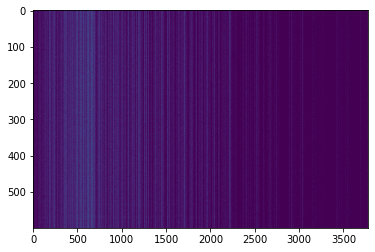

,AUC,pAUC
Source_0,0.533500,0.537895
Source_1,0.581000,0.546316
Source_2,0.630300,0.518947
Target_0,0.481600,0.557895
Target_1,0.679500,0.613158
Target_2,0.523150,0.488947
mean,0.571508,0.543860
h_mean,0.563819,0.541268


2021-05-30 21:16:41,043 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:190266.174479, val_AUC_hmean:0.563819, val_pAUC_hmean:0.541268, best_flag:True
2021-05-30 21:16:41,044 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.16it/s]
2021-05-30 21:16:41,673 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.70it/s]
2021-05-30 21:16:41,723 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.27it/s]


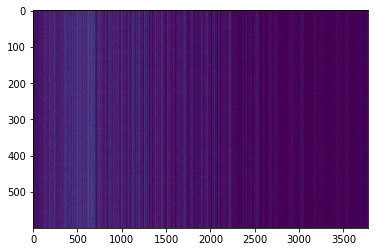

,AUC,pAUC
Source_0,0.545400,0.552632
Source_1,0.625700,0.569474
Source_2,0.663000,0.553158
Target_0,0.508900,0.584737
Target_1,0.708400,0.585789
Target_2,0.583900,0.491579
mean,0.605883,0.556228
h_mean,0.598247,0.554280


2021-05-30 21:16:43,435 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:130984.651693, val_AUC_hmean:0.598247, val_pAUC_hmean:0.554280, best_flag:True
2021-05-30 21:16:43,436 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.90it/s]
2021-05-30 21:16:44,073 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.57it/s]
2021-05-30 21:16:44,123 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.90it/s]


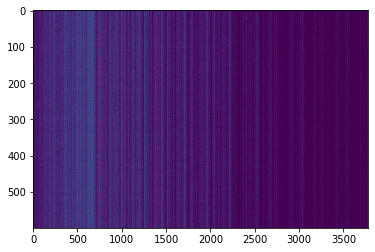

,AUC,pAUC
Source_0,0.558400,0.569474
Source_1,0.645200,0.571053
Source_2,0.681600,0.546316
Target_0,0.536800,0.605263
Target_1,0.682300,0.561579
Target_2,0.644400,0.501579
mean,0.624783,0.559211
h_mean,0.619308,0.557405


2021-05-30 21:16:45,870 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:102002.496745, val_AUC_hmean:0.619308, val_pAUC_hmean:0.557405, best_flag:True
2021-05-30 21:16:45,872 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.14it/s]
2021-05-30 21:16:46,536 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.90it/s]
2021-05-30 21:16:46,591 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.12it/s]
2021-05-30 21:16:46,651 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:87405.875000, val_AUC_hmean:0.622648, val_pAUC_hmean:0.553567, best_flag:False
2021-05-30 21:16:46,652 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.00it/s]
2021-05-30 21:16:47,285 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.07it/s]
2021-05-30 21:16:47,330 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.79it/s]


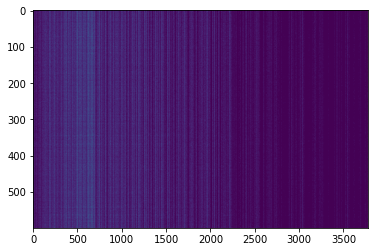

,AUC,pAUC
Source_0,0.572900,0.578947
Source_1,0.664800,0.572632
Source_2,0.753700,0.606316
Target_0,0.546000,0.626316
Target_1,0.697200,0.580000
Target_2,0.628900,0.504211
mean,0.643917,0.578070
h_mean,0.636106,0.575430


2021-05-30 21:16:49,020 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:80214.069661, val_AUC_hmean:0.636106, val_pAUC_hmean:0.575430, best_flag:True
2021-05-30 21:16:49,021 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.59it/s]
2021-05-30 21:16:49,638 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.88it/s]
2021-05-30 21:16:49,687 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.17it/s]


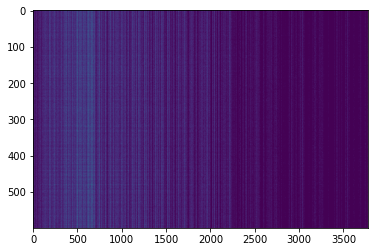

,AUC,pAUC
Source_0,0.585900,0.584737
Source_1,0.674400,0.582105
Source_2,0.818100,0.674737
Target_0,0.537100,0.621579
Target_1,0.691400,0.572105
Target_2,0.638800,0.511053
mean,0.657617,0.591053
h_mean,0.646166,0.586877


2021-05-30 21:16:51,326 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:75917.440104, val_AUC_hmean:0.646166, val_pAUC_hmean:0.586877, best_flag:True
2021-05-30 21:16:51,327 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.04it/s]
2021-05-30 21:16:51,928 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.41it/s]
2021-05-30 21:16:51,975 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.89it/s]
2021-05-30 21:16:52,027 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:72965.982422, val_AUC_hmean:0.641645, val_pAUC_hmean:0.586008, best_flag:False
2021-05-30 21:16:52,028 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.80it/s]
2021-05-30 21:16:52,636 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.24it/s]
2021-05-30 21:16:52,684 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.50it/s]
2021-05-30 21:1

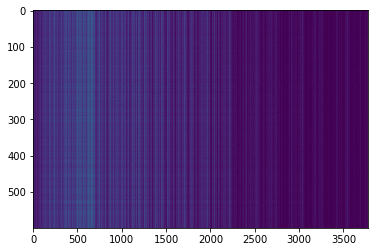

,AUC,pAUC
Source_0,0.591200,0.606316
Source_1,0.721800,0.600526
Source_2,0.804600,0.672105
Target_0,0.556100,0.635263
Target_1,0.703200,0.585263
Target_2,0.614700,0.498421
mean,0.665267,0.599649
h_mean,0.654531,0.594560


2021-05-30 21:16:55,135 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:69031.168620, val_AUC_hmean:0.654531, val_pAUC_hmean:0.594560, best_flag:True
2021-05-30 21:16:55,136 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.57it/s]
2021-05-30 21:16:55,751 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.51it/s]
2021-05-30 21:16:55,797 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.62it/s]


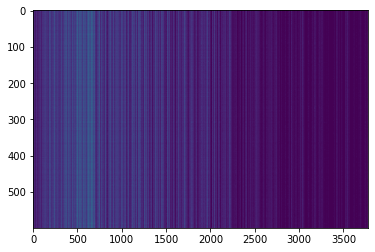

,AUC,pAUC
Source_0,0.589800,0.602105
Source_1,0.697400,0.596316
Source_2,0.815400,0.677895
Target_0,0.544700,0.636842
Target_1,0.701100,0.590000
Target_2,0.620900,0.505789
mean,0.661550,0.601491
h_mean,0.650156,0.596704


2021-05-30 21:16:57,516 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:67332.939453, val_AUC_hmean:0.650156, val_pAUC_hmean:0.596704, best_flag:True
2021-05-30 21:16:57,516 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.23it/s]
2021-05-30 21:16:58,258 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.31it/s]
2021-05-30 21:16:58,305 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.18it/s]
2021-05-30 21:16:58,365 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:66240.233724, val_AUC_hmean:0.655597, val_pAUC_hmean:0.594113, best_flag:False
2021-05-30 21:16:58,366 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.58it/s]
2021-05-30 21:16:58,981 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.50it/s]
2021-05-30 21:16:59,027 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 88.96it/s]
2021-05-30 21

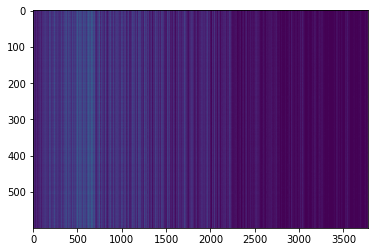

,AUC,pAUC
Source_0,0.628400,0.617368
Source_1,0.731200,0.612632
Source_2,0.826200,0.693684
Target_0,0.584200,0.647368
Target_1,0.716300,0.581579
Target_2,0.631700,0.512105
mean,0.686333,0.610789
h_mean,0.677189,0.605415


2021-05-30 21:17:03,329 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:62451.111979, val_AUC_hmean:0.677189, val_pAUC_hmean:0.605415, best_flag:True
2021-05-30 21:17:03,329 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.05it/s]
2021-05-30 21:17:03,961 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.07it/s]
2021-05-30 21:17:04,006 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.09it/s]


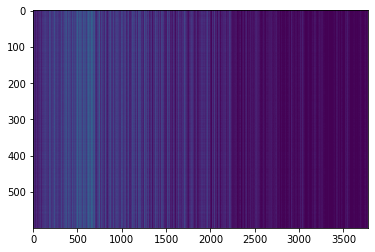

,AUC,pAUC
Source_0,0.647300,0.628421
Source_1,0.736700,0.630526
Source_2,0.806000,0.683158
Target_0,0.603600,0.653158
Target_1,0.725100,0.600526
Target_2,0.641800,0.511053
mean,0.693417,0.617807
h_mean,0.686739,0.612618


2021-05-30 21:17:05,701 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:61784.990234, val_AUC_hmean:0.686739, val_pAUC_hmean:0.612618, best_flag:True
2021-05-30 21:17:05,702 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.09it/s]
2021-05-30 21:17:06,368 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.28it/s]
2021-05-30 21:17:06,424 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.58it/s]
2021-05-30 21:17:06,490 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:61200.136393, val_AUC_hmean:0.686405, val_pAUC_hmean:0.606020, best_flag:False
2021-05-30 21:17:06,492 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.42it/s]
2021-05-30 21:17:07,185 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.57it/s]
2021-05-30 21:17:07,241 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.81it/s]
2021-05-30 21

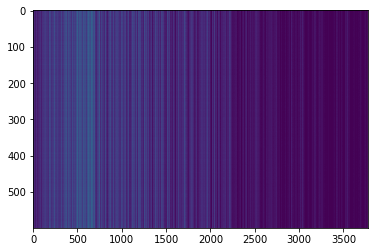

,AUC,pAUC
Source_0,0.663700,0.626316
Source_1,0.719400,0.614737
Source_2,0.837300,0.703158
Target_0,0.607700,0.655263
Target_1,0.717500,0.590526
Target_2,0.650500,0.518421
mean,0.699350,0.618070
h_mean,0.692231,0.612623


2021-05-30 21:17:11,211 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:58590.138021, val_AUC_hmean:0.692231, val_pAUC_hmean:0.612623, best_flag:True
2021-05-30 21:17:11,212 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.57it/s]
2021-05-30 21:17:11,798 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.97it/s]
2021-05-30 21:17:11,841 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 93.46it/s]
2021-05-30 21:17:11,885 - pytorch_modeler.py - INFO - epoch:22/300, train_losses:58079.190755, val_AUC_hmean:0.683116, val_pAUC_hmean:0.609878, best_flag:False
2021-05-30 21:17:11,886 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 21.27it/s]
2021-05-30 21:17:12,452 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.27it/s]
2021-05-30 21:17:12,498 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.21it/s]


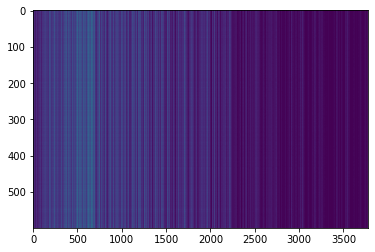

,AUC,pAUC
Source_0,0.684900,0.623158
Source_1,0.744800,0.642632
Source_2,0.833400,0.708421
Target_0,0.620000,0.652632
Target_1,0.740500,0.613684
Target_2,0.676800,0.522105
mean,0.716733,0.627105
h_mean,0.710606,0.621794


2021-05-30 21:17:14,279 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:57682.598307, val_AUC_hmean:0.710606, val_pAUC_hmean:0.621794, best_flag:True
2021-05-30 21:17:14,280 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.90it/s]
2021-05-30 21:17:14,917 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.64it/s]
2021-05-30 21:17:14,963 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 89.51it/s]


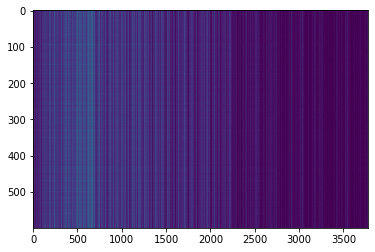

,AUC,pAUC
Source_0,0.649400,0.631579
Source_1,0.747700,0.640526
Source_2,0.817300,0.721579
Target_0,0.587700,0.645789
Target_1,0.742700,0.605263
Target_2,0.651700,0.524211
mean,0.699417,0.628158
h_mean,0.690982,0.622491


2021-05-30 21:17:16,669 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:57370.163737, val_AUC_hmean:0.690982, val_pAUC_hmean:0.622491, best_flag:True
2021-05-30 21:17:16,670 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.36it/s]
2021-05-30 21:17:17,325 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 72.29it/s]
2021-05-30 21:17:17,379 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.21it/s]


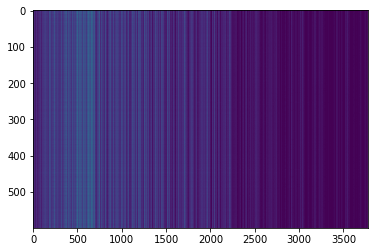

,AUC,pAUC
Source_0,0.679700,0.642632
Source_1,0.744300,0.638421
Source_2,0.814200,0.711053
Target_0,0.620200,0.652105
Target_1,0.744200,0.620000
Target_2,0.676900,0.533158
mean,0.713250,0.632895
h_mean,0.707847,0.628217


2021-05-30 21:17:19,382 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:56731.716797, val_AUC_hmean:0.707847, val_pAUC_hmean:0.628217, best_flag:True
2021-05-30 21:17:19,383 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.61it/s]
2021-05-30 21:17:20,030 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 61.75it/s]
2021-05-30 21:17:20,093 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.73it/s]
2021-05-30 21:17:20,165 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:56136.572591, val_AUC_hmean:0.709711, val_pAUC_hmean:0.627063, best_flag:False
2021-05-30 21:17:20,166 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.01it/s]
2021-05-30 21:17:20,834 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.92it/s]
2021-05-30 21:17:20,890 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.96it/s]


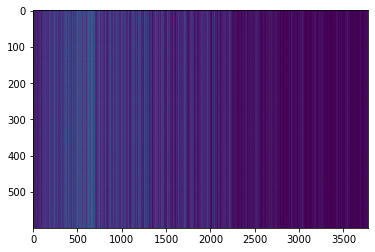

,AUC,pAUC
Source_0,0.666600,0.636842
Source_1,0.763900,0.654211
Source_2,0.822300,0.715789
Target_0,0.599600,0.651579
Target_1,0.758600,0.621053
Target_2,0.685800,0.534211
mean,0.716133,0.635614
h_mean,0.708427,0.630736


2021-05-30 21:17:22,796 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:55652.125000, val_AUC_hmean:0.708427, val_pAUC_hmean:0.630736, best_flag:True
2021-05-30 21:17:22,797 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.50it/s]
2021-05-30 21:17:23,415 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 83.60it/s]
2021-05-30 21:17:23,459 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.76it/s]
2021-05-30 21:17:23,511 - pytorch_modeler.py - INFO - epoch:28/300, train_losses:55263.652344, val_AUC_hmean:0.696429, val_pAUC_hmean:0.609033, best_flag:False
2021-05-30 21:17:23,513 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.01it/s]
2021-05-30 21:17:24,114 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.64it/s]
2021-05-30 21:17:24,161 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.97it/s]
2021-05-30 21

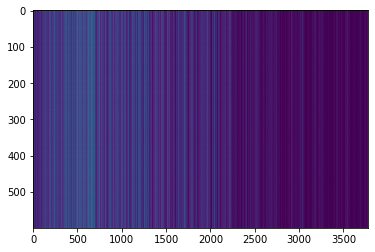

,AUC,pAUC
Source_0,0.720200,0.633158
Source_1,0.771100,0.666842
Source_2,0.825300,0.712632
Target_0,0.634500,0.654211
Target_1,0.785700,0.641053
Target_2,0.684400,0.521053
mean,0.736867,0.638158
h_mean,0.731087,0.632249


2021-05-30 21:17:32,340 - pytorch_modeler.py - INFO - epoch:38/300, train_losses:51007.320638, val_AUC_hmean:0.731087, val_pAUC_hmean:0.632249, best_flag:True
2021-05-30 21:17:32,341 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.20it/s]
2021-05-30 21:17:32,938 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.34it/s]
2021-05-30 21:17:32,987 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.07it/s]
2021-05-30 21:17:33,039 - pytorch_modeler.py - INFO - epoch:39/300, train_losses:50630.194010, val_AUC_hmean:0.715772, val_pAUC_hmean:0.617552, best_flag:False
2021-05-30 21:17:33,040 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 20.20it/s]
2021-05-30 21:17:33,637 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.61it/s]
2021-05-30 21:17:33,680 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.89it/s]


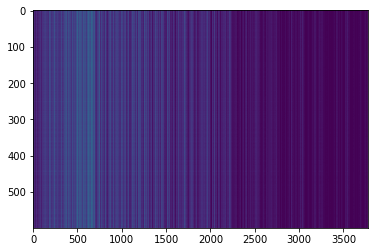

,AUC,pAUC
Source_0,0.706200,0.639474
Source_1,0.769300,0.672105
Source_2,0.819200,0.714211
Target_0,0.625900,0.648421
Target_1,0.772300,0.636842
Target_2,0.687400,0.531053
mean,0.730050,0.640351
h_mean,0.724296,0.635102


2021-05-30 21:17:35,295 - pytorch_modeler.py - INFO - epoch:40/300, train_losses:50237.337891, val_AUC_hmean:0.724296, val_pAUC_hmean:0.635102, best_flag:True
2021-05-30 21:17:35,296 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.80it/s]
2021-05-30 21:17:35,904 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.34it/s]
2021-05-30 21:17:35,958 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.66it/s]
2021-05-30 21:17:36,006 - pytorch_modeler.py - INFO - epoch:41/300, train_losses:49867.078776, val_AUC_hmean:0.722021, val_pAUC_hmean:0.627129, best_flag:False
2021-05-30 21:17:36,007 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.89it/s]
2021-05-30 21:17:36,613 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.90it/s]
2021-05-30 21:17:36,655 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.53it/s]
2021-05-30 21

100%|██████████| 2/2 [00:00<00:00, 64.17it/s]
2021-05-30 21:17:47,558 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.70it/s]
2021-05-30 21:17:47,635 - pytorch_modeler.py - INFO - epoch:57/300, train_losses:44487.525716, val_AUC_hmean:0.727726, val_pAUC_hmean:0.627394, best_flag:False
2021-05-30 21:17:47,636 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.25it/s]
2021-05-30 21:17:48,262 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 64.53it/s]
2021-05-30 21:17:48,330 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.20it/s]
2021-05-30 21:17:48,397 - pytorch_modeler.py - INFO - epoch:58/300, train_losses:44099.991862, val_AUC_hmean:0.728926, val_pAUC_hmean:0.626719, best_flag:False
2021-05-30 21:17:48,398 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.34it/s]
2021-05-30 21:17:49,021 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 21:17:59,588 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.70it/s]
2021-05-30 21:18:00,199 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.02it/s]
2021-05-30 21:18:00,251 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.68it/s]
2021-05-30 21:18:00,311 - pytorch_modeler.py - INFO - epoch:74/300, train_losses:39296.058919, val_AUC_hmean:0.719385, val_pAUC_hmean:0.616057, best_flag:False
2021-05-30 21:18:00,312 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.83it/s]
2021-05-30 21:18:00,951 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.78it/s]
2021-05-30 21:18:01,002 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.28it/s]
2021-05-30 21:18:01,063 - pytorch_modeler.py - INFO - epoch:75/300, train_losses:38939.455729, val_AUC_hmean:0.717811, val_pAUC_hmean:0.618338, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 84.46it/s]
2021-05-30 21:18:12,136 - pytorch_modeler.py - INFO - epoch:90/300, train_losses:34831.512695, val_AUC_hmean:0.733966, val_pAUC_hmean:0.627392, best_flag:False
2021-05-30 21:18:12,137 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.35it/s]
2021-05-30 21:18:12,759 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.49it/s]
2021-05-30 21:18:12,805 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.70it/s]
2021-05-30 21:18:12,859 - pytorch_modeler.py - INFO - epoch:91/300, train_losses:34711.869141, val_AUC_hmean:0.731480, val_pAUC_hmean:0.624578, best_flag:False
2021-05-30 21:18:12,860 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.68it/s]
2021-05-30 21:18:13,472 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 72.26it/s]
2021-05-30 21:18:13,522 - pytorch_modeler.py - INFO - valid_target
100%|███████

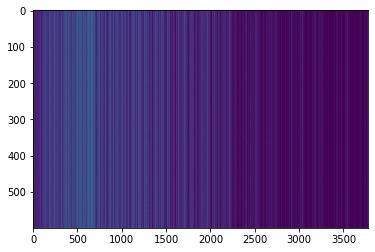

,AUC,pAUC
Source_0,0.753000,0.643158
Source_1,0.762900,0.674211
Source_2,0.818800,0.706316
Target_0,0.665100,0.659474
Target_1,0.767600,0.643158
Target_2,0.677000,0.524737
mean,0.740733,0.641842
h_mean,0.736783,0.636217


2021-05-30 21:18:22,144 - pytorch_modeler.py - INFO - epoch:101/300, train_losses:32084.382812, val_AUC_hmean:0.736783, val_pAUC_hmean:0.636217, best_flag:True
2021-05-30 21:18:22,145 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.74it/s]
2021-05-30 21:18:22,788 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 81.21it/s]
2021-05-30 21:18:22,835 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.64it/s]
2021-05-30 21:18:22,896 - pytorch_modeler.py - INFO - epoch:102/300, train_losses:31807.956706, val_AUC_hmean:0.735247, val_pAUC_hmean:0.626738, best_flag:False
2021-05-30 21:18:22,897 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.48it/s]
2021-05-30 21:18:23,515 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 84.74it/s]
2021-05-30 21:18:23,561 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.41it/s]
2021-05-30 

100%|██████████| 2/2 [00:00<00:00, 76.27it/s]
2021-05-30 21:18:34,534 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.04it/s]
2021-05-30 21:18:34,589 - pytorch_modeler.py - INFO - epoch:118/300, train_losses:28060.566081, val_AUC_hmean:0.730604, val_pAUC_hmean:0.627391, best_flag:False
2021-05-30 21:18:34,591 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.40it/s]
2021-05-30 21:18:35,212 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.87it/s]
2021-05-30 21:18:35,257 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.58it/s]
2021-05-30 21:18:35,307 - pytorch_modeler.py - INFO - epoch:119/300, train_losses:27764.040039, val_AUC_hmean:0.737654, val_pAUC_hmean:0.626673, best_flag:False
2021-05-30 21:18:35,308 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.55it/s]
2021-05-30 21:18:35,924 - pytorch_modeler.py - INFO - valid_source
100%|█████

2021-05-30 21:18:46,569 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.29it/s]
2021-05-30 21:18:47,228 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.16it/s]
2021-05-30 21:18:47,277 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.91it/s]
2021-05-30 21:18:47,329 - pytorch_modeler.py - INFO - epoch:135/300, train_losses:24453.188151, val_AUC_hmean:0.735322, val_pAUC_hmean:0.627542, best_flag:False
2021-05-30 21:18:47,332 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.31it/s]
2021-05-30 21:18:47,989 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.01it/s]
2021-05-30 21:18:48,041 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.06it/s]
2021-05-30 21:18:48,101 - pytorch_modeler.py - INFO - epoch:136/300, train_losses:24300.611816, val_AUC_hmean:0.735124, val_pAUC_hmean:0.627147, best_flag:False
2021-05-30

100%|██████████| 2/2 [00:00<00:00, 80.95it/s]
2021-05-30 21:19:00,616 - pytorch_modeler.py - INFO - epoch:151/300, train_losses:21326.041341, val_AUC_hmean:0.730927, val_pAUC_hmean:0.620807, best_flag:False
2021-05-30 21:19:00,618 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.90it/s]
2021-05-30 21:19:01,330 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.96it/s]
2021-05-30 21:19:01,391 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.31it/s]
2021-05-30 21:19:01,447 - pytorch_modeler.py - INFO - epoch:152/300, train_losses:21189.155111, val_AUC_hmean:0.737778, val_pAUC_hmean:0.625038, best_flag:False
2021-05-30 21:19:01,448 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.67it/s]
2021-05-30 21:19:02,328 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.98it/s]
2021-05-30 21:19:02,391 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 19.39it/s]
2021-05-30 21:19:13,577 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.01it/s]
2021-05-30 21:19:13,631 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.56it/s]
2021-05-30 21:19:13,683 - pytorch_modeler.py - INFO - epoch:168/300, train_losses:18553.606120, val_AUC_hmean:0.737310, val_pAUC_hmean:0.632417, best_flag:False
2021-05-30 21:19:13,685 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.75it/s]
2021-05-30 21:19:14,295 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.73it/s]
2021-05-30 21:19:14,347 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.04it/s]
2021-05-30 21:19:14,402 - pytorch_modeler.py - INFO - epoch:169/300, train_losses:18301.028158, val_AUC_hmean:0.732399, val_pAUC_hmean:0.624827, best_flag:False
2021-05-30 21:19:14,403 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 64.71it/s]
2021-05-30 21:19:25,688 - pytorch_modeler.py - INFO - epoch:184/300, train_losses:16153.620605, val_AUC_hmean:0.739863, val_pAUC_hmean:0.633139, best_flag:False
2021-05-30 21:19:25,690 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.86it/s]
2021-05-30 21:19:26,296 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 87.89it/s]
2021-05-30 21:19:26,342 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.29it/s]
2021-05-30 21:19:26,392 - pytorch_modeler.py - INFO - epoch:185/300, train_losses:16117.923421, val_AUC_hmean:0.724791, val_pAUC_hmean:0.618839, best_flag:False
2021-05-30 21:19:26,393 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.94it/s]
2021-05-30 21:19:27,029 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.04it/s]
2021-05-30 21:19:27,077 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 18.44it/s]
2021-05-30 21:19:38,142 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 65.08it/s]
2021-05-30 21:19:38,203 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.48it/s]
2021-05-30 21:19:38,269 - pytorch_modeler.py - INFO - epoch:201/300, train_losses:13919.764567, val_AUC_hmean:0.750857, val_pAUC_hmean:0.629998, best_flag:False
2021-05-30 21:19:38,271 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.99it/s]
2021-05-30 21:19:38,940 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.27it/s]
2021-05-30 21:19:39,003 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.98it/s]
2021-05-30 21:19:39,068 - pytorch_modeler.py - INFO - epoch:202/300, train_losses:13645.701904, val_AUC_hmean:0.744446, val_pAUC_hmean:0.630769, best_flag:False
2021-05-30 21:19:39,069 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 50.57it/s]
2021-05-30 21:19:53,059 - pytorch_modeler.py - INFO - epoch:217/300, train_losses:11975.893229, val_AUC_hmean:0.737085, val_pAUC_hmean:0.627673, best_flag:False
2021-05-30 21:19:53,061 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.33it/s]
2021-05-30 21:19:54,122 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 45.95it/s]
2021-05-30 21:19:54,189 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 50.64it/s]
2021-05-30 21:19:54,252 - pytorch_modeler.py - INFO - epoch:218/300, train_losses:11717.327799, val_AUC_hmean:0.737988, val_pAUC_hmean:0.628625, best_flag:False
2021-05-30 21:19:54,254 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.33it/s]
2021-05-30 21:19:55,315 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.99it/s]
2021-05-30 21:19:55,366 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:01<00:00, 11.26it/s]
2021-05-30 21:20:12,827 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.28it/s]
2021-05-30 21:20:12,899 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 50.60it/s]
2021-05-30 21:20:12,983 - pytorch_modeler.py - INFO - epoch:234/300, train_losses:10084.682536, val_AUC_hmean:0.722605, val_pAUC_hmean:0.622459, best_flag:False
2021-05-30 21:20:12,984 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.84it/s]
2021-05-30 21:20:13,699 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.11it/s]
2021-05-30 21:20:13,754 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.62it/s]
2021-05-30 21:20:13,822 - pytorch_modeler.py - INFO - epoch:235/300, train_losses:9920.907878, val_AUC_hmean:0.735093, val_pAUC_hmean:0.627337, best_flag:False
2021-05-30 21:20:13,823 - pytorch_modeler.py - INFO - train
100%|██████

2021-05-30 21:20:30,911 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.29it/s]
2021-05-30 21:20:31,569 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.39it/s]
2021-05-30 21:20:31,627 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.79it/s]
2021-05-30 21:20:31,685 - pytorch_modeler.py - INFO - epoch:251/300, train_losses:8516.862386, val_AUC_hmean:0.735609, val_pAUC_hmean:0.622839, best_flag:False
2021-05-30 21:20:31,687 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.35it/s]
2021-05-30 21:20:32,309 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 64.91it/s]
2021-05-30 21:20:32,370 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.43it/s]
2021-05-30 21:20:32,431 - pytorch_modeler.py - INFO - epoch:252/300, train_losses:8396.948812, val_AUC_hmean:0.739089, val_pAUC_hmean:0.630283, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 50.15it/s]
2021-05-30 21:20:49,816 - pytorch_modeler.py - INFO - epoch:267/300, train_losses:7118.352946, val_AUC_hmean:0.730160, val_pAUC_hmean:0.629064, best_flag:False
2021-05-30 21:20:49,817 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.37it/s]
2021-05-30 21:20:50,875 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.37it/s]
2021-05-30 21:20:50,948 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 50.94it/s]
2021-05-30 21:20:51,017 - pytorch_modeler.py - INFO - epoch:268/300, train_losses:7086.787191, val_AUC_hmean:0.736088, val_pAUC_hmean:0.629055, best_flag:False
2021-05-30 21:20:51,018 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.85it/s]
2021-05-30 21:20:51,954 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.59it/s]
2021-05-30 21:20:52,016 - pytorch_modeler.py - INFO - valid_target
100%|███████

100%|██████████| 12/12 [00:00<00:00, 17.63it/s]
2021-05-30 21:21:08,010 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.25it/s]
2021-05-30 21:21:08,078 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.52it/s]
2021-05-30 21:21:08,138 - pytorch_modeler.py - INFO - epoch:284/300, train_losses:5949.349447, val_AUC_hmean:0.730865, val_pAUC_hmean:0.624691, best_flag:False
2021-05-30 21:21:08,144 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.66it/s]
2021-05-30 21:21:08,826 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.10it/s]
2021-05-30 21:21:08,870 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.28it/s]
2021-05-30 21:21:08,924 - pytorch_modeler.py - INFO - epoch:285/300, train_losses:5811.998494, val_AUC_hmean:0.728293, val_pAUC_hmean:0.625195, best_flag:False
2021-05-30 21:21:08,925 - pytorch_modeler.py - INFO - train
100%|███████

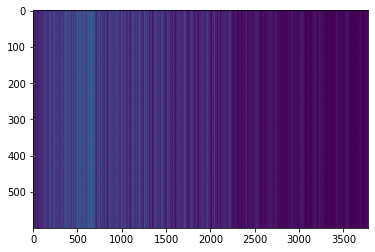

,AUC,pAUC
Source_0,0.802300,0.642105
Source_1,0.741400,0.650000
Source_2,0.841400,0.725789
Target_0,0.699300,0.655789
Target_1,0.766600,0.656316
Target_2,0.662900,0.525263
mean,0.752317,0.642544
h_mean,0.747505,0.636538


2021-05-30 21:21:12,821 - pytorch_modeler.py - INFO - epoch:288/300, train_losses:5694.138428, val_AUC_hmean:0.747505, val_pAUC_hmean:0.636538, best_flag:True
2021-05-30 21:21:12,823 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.33it/s]
2021-05-30 21:21:13,517 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 61.03it/s]
2021-05-30 21:21:13,579 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.22it/s]
2021-05-30 21:21:13,637 - pytorch_modeler.py - INFO - epoch:289/300, train_losses:5682.305501, val_AUC_hmean:0.745229, val_pAUC_hmean:0.631302, best_flag:False
2021-05-30 21:21:13,638 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.26it/s]
2021-05-30 21:21:14,298 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.52it/s]
2021-05-30 21:21:14,351 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.67it/s]
2021-05-30 21

,AUC,pAUC
Source_0,0.802300,0.642105
Source_1,0.741400,0.650000
Source_2,0.841400,0.725789
Target_0,0.699300,0.655789
Target_1,0.766600,0.656316
Target_2,0.662900,0.525263
mean,0.752317,0.642544
h_mean,0.747505,0.636538


2021-05-30 21:21:23,018 - 00_train.py - INFO - TARGET MACHINE_TYPE: pump
2021-05-30 21:21:23,019 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 21:21:23,021 - 00_train.py - INFO - TRAINING


elapsed time: 284.803560972 [sec]


2021-05-30 21:21:23,509 - pytorch_modeler.py - INFO - train
 17%|█▋        | 2/12 [00:00<00:00, 19.06it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 18.24it/s]
2021-05-30 21:21:24,170 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.21it/s]
2021-05-30 21:21:24,224 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.24it/s]


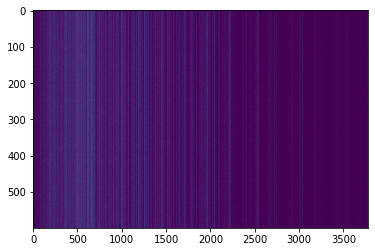

,AUC,pAUC
Source_0,0.524750,0.540000
Source_1,0.574100,0.539474
Source_2,0.592900,0.540000
Target_0,0.480700,0.534737
Target_1,0.665100,0.595789
Target_2,0.570250,0.515263
mean,0.567967,0.544211
h_mean,0.562240,0.543151


2021-05-30 21:21:26,082 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:191057.980469, val_AUC_hmean:0.562240, val_pAUC_hmean:0.543151, best_flag:True
2021-05-30 21:21:26,084 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.39it/s]
2021-05-30 21:21:26,705 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.01it/s]
2021-05-30 21:21:26,754 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.15it/s]


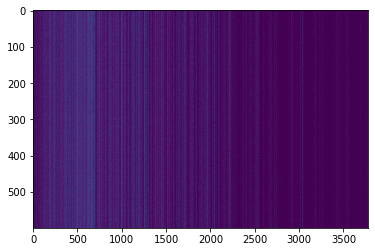

,AUC,pAUC
Source_0,0.536600,0.542105
Source_1,0.590100,0.542105
Source_2,0.659100,0.570000
Target_0,0.496600,0.567895
Target_1,0.674300,0.571579
Target_2,0.642800,0.513684
mean,0.599917,0.551228
h_mean,0.592426,0.550415


2021-05-30 21:21:28,463 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:130660.190755, val_AUC_hmean:0.592426, val_pAUC_hmean:0.550415, best_flag:True
2021-05-30 21:21:28,464 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.77it/s]
2021-05-30 21:21:29,107 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.90it/s]
2021-05-30 21:21:29,155 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.55it/s]


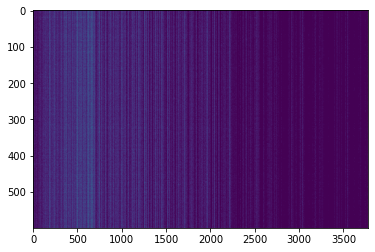

,AUC,pAUC
Source_0,0.547200,0.564737
Source_1,0.607000,0.537895
Source_2,0.681400,0.574211
Target_0,0.521000,0.590000
Target_1,0.702600,0.594737
Target_2,0.669500,0.533158
mean,0.621450,0.565789
h_mean,0.613571,0.564796


2021-05-30 21:21:31,027 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:101729.639974, val_AUC_hmean:0.613571, val_pAUC_hmean:0.564796, best_flag:True
2021-05-30 21:21:31,028 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.03it/s]
2021-05-30 21:21:31,699 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.37it/s]
2021-05-30 21:21:31,764 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.23it/s]
2021-05-30 21:21:31,823 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:87406.324870, val_AUC_hmean:0.626135, val_pAUC_hmean:0.563004, best_flag:False
2021-05-30 21:21:31,825 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.99it/s]
2021-05-30 21:21:32,459 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 65.34it/s]
2021-05-30 21:21:32,523 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.17it/s]


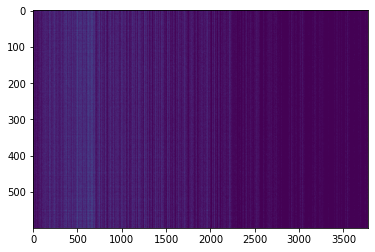

,AUC,pAUC
Source_0,0.553400,0.570000
Source_1,0.640600,0.542632
Source_2,0.780100,0.635263
Target_0,0.515600,0.608421
Target_1,0.704000,0.572105
Target_2,0.656000,0.511579
mean,0.641617,0.573333
h_mean,0.629309,0.570469


2021-05-30 21:21:34,521 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:80288.158854, val_AUC_hmean:0.629309, val_pAUC_hmean:0.570469, best_flag:True
2021-05-30 21:21:34,522 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.42it/s]
2021-05-30 21:21:35,176 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 61.70it/s]
2021-05-30 21:21:35,230 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.62it/s]


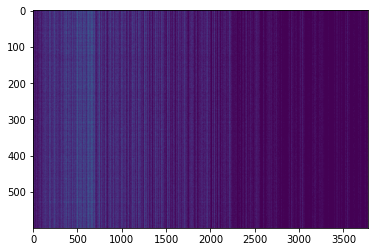

,AUC,pAUC
Source_0,0.566600,0.586842
Source_1,0.619500,0.537895
Source_2,0.811600,0.666316
Target_0,0.514900,0.607895
Target_1,0.692900,0.588421
Target_2,0.665000,0.510526
mean,0.645083,0.582982
h_mean,0.631556,0.578750


2021-05-30 21:21:37,190 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:75979.337240, val_AUC_hmean:0.631556, val_pAUC_hmean:0.578750, best_flag:True
2021-05-30 21:21:37,191 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.17it/s]
2021-05-30 21:21:37,854 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.09it/s]
2021-05-30 21:21:37,911 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.66it/s]


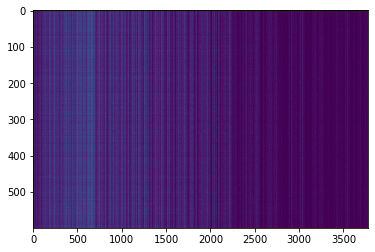

,AUC,pAUC
Source_0,0.571200,0.594737
Source_1,0.646900,0.561053
Source_2,0.818800,0.677368
Target_0,0.509900,0.618947
Target_1,0.706300,0.594211
Target_2,0.645100,0.510526
mean,0.649700,0.592807
h_mean,0.635258,0.588386


2021-05-30 21:21:39,678 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:73468.964193, val_AUC_hmean:0.635258, val_pAUC_hmean:0.588386, best_flag:True
2021-05-30 21:21:39,679 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.31it/s]
2021-05-30 21:21:40,338 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.62it/s]
2021-05-30 21:21:40,388 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.91it/s]


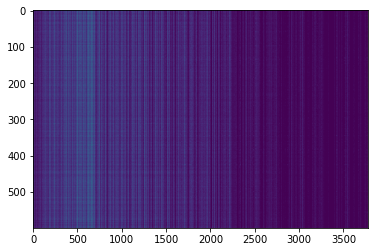

,AUC,pAUC
Source_0,0.575400,0.595789
Source_1,0.666700,0.570000
Source_2,0.824500,0.693158
Target_0,0.522100,0.619474
Target_1,0.710000,0.595263
Target_2,0.676000,0.512632
mean,0.662450,0.597719
h_mean,0.648383,0.592860


2021-05-30 21:21:42,207 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:71265.800781, val_AUC_hmean:0.648383, val_pAUC_hmean:0.592860, best_flag:True
2021-05-30 21:21:42,208 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.30it/s]
2021-05-30 21:21:42,832 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 76.89it/s]
2021-05-30 21:21:42,881 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.97it/s]


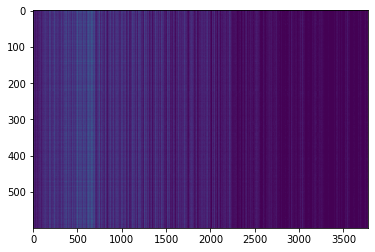

,AUC,pAUC
Source_0,0.595100,0.597895
Source_1,0.657200,0.554737
Source_2,0.816600,0.688421
Target_0,0.541200,0.628421
Target_1,0.711800,0.603158
Target_2,0.639800,0.524211
mean,0.660283,0.599474
h_mean,0.649195,0.594964


2021-05-30 21:21:45,011 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:69925.000651, val_AUC_hmean:0.649195, val_pAUC_hmean:0.594964, best_flag:True
2021-05-30 21:21:45,012 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.26it/s]
2021-05-30 21:21:45,672 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.57it/s]
2021-05-30 21:21:45,723 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.91it/s]


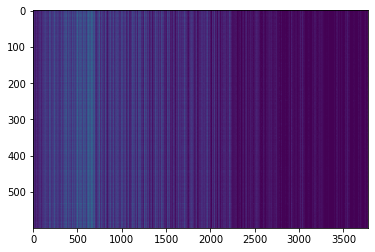

,AUC,pAUC
Source_0,0.579600,0.600000
Source_1,0.694900,0.610526
Source_2,0.826100,0.661053
Target_0,0.527100,0.624211
Target_1,0.723900,0.601579
Target_2,0.655900,0.505789
mean,0.667917,0.600526
h_mean,0.653731,0.596495


2021-05-30 21:21:47,731 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:68664.861328, val_AUC_hmean:0.653731, val_pAUC_hmean:0.596495, best_flag:True
2021-05-30 21:21:47,732 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.41it/s]
2021-05-30 21:21:48,353 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.23it/s]
2021-05-30 21:21:48,402 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.54it/s]


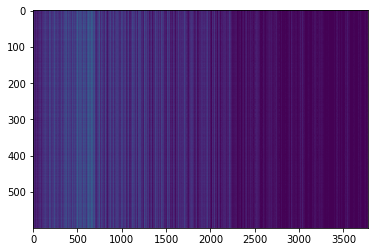

,AUC,pAUC
Source_0,0.601900,0.606316
Source_1,0.705600,0.589474
Source_2,0.805200,0.687368
Target_0,0.551400,0.637895
Target_1,0.733300,0.614737
Target_2,0.664100,0.512632
mean,0.676917,0.608070
h_mean,0.666398,0.603279


2021-05-30 21:21:50,329 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:67270.097005, val_AUC_hmean:0.666398, val_pAUC_hmean:0.603279, best_flag:True
2021-05-30 21:21:50,330 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.74it/s]
2021-05-30 21:21:51,049 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 10.77it/s]
2021-05-30 21:21:51,261 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.88it/s]


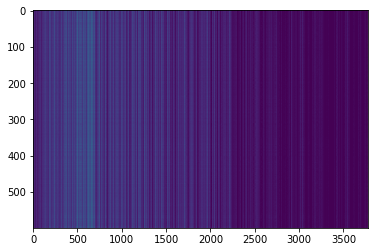

,AUC,pAUC
Source_0,0.590400,0.602105
Source_1,0.729100,0.602632
Source_2,0.814700,0.704737
Target_0,0.549500,0.636842
Target_1,0.733100,0.617895
Target_2,0.663200,0.516842
mean,0.680000,0.613509
h_mean,0.667816,0.608354


2021-05-30 21:21:53,210 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:66241.146810, val_AUC_hmean:0.667816, val_pAUC_hmean:0.608354, best_flag:True
2021-05-30 21:21:53,211 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.94it/s]
2021-05-30 21:21:53,848 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 72.44it/s]
2021-05-30 21:21:53,898 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.93it/s]
2021-05-30 21:21:53,951 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:65305.782878, val_AUC_hmean:0.649746, val_pAUC_hmean:0.596082, best_flag:False
2021-05-30 21:21:53,952 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.79it/s]
2021-05-30 21:21:54,629 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.61it/s]
2021-05-30 21:21:54,678 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.29it/s]
2021-05-30 21

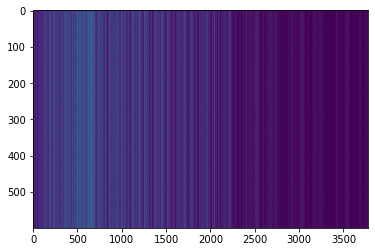

,AUC,pAUC
Source_0,0.622100,0.614211
Source_1,0.738600,0.626316
Source_2,0.818700,0.721053
Target_0,0.577200,0.638421
Target_1,0.741000,0.614737
Target_2,0.656100,0.518947
mean,0.692283,0.622281
h_mean,0.682671,0.616544


2021-05-30 21:22:00,372 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:61533.121419, val_AUC_hmean:0.682671, val_pAUC_hmean:0.616544, best_flag:True
2021-05-30 21:22:00,374 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.23it/s]
2021-05-30 21:22:01,284 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.97it/s]
2021-05-30 21:22:01,349 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 38.23it/s]


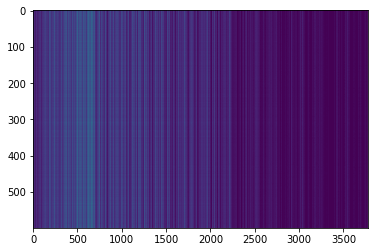

,AUC,pAUC
Source_0,0.630000,0.626316
Source_1,0.716800,0.607895
Source_2,0.819300,0.716842
Target_0,0.574900,0.640000
Target_1,0.739000,0.615789
Target_2,0.692000,0.528947
mean,0.695333,0.622632
h_mean,0.686448,0.617688


2021-05-30 21:22:03,590 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:60700.788086, val_AUC_hmean:0.686448, val_pAUC_hmean:0.617688, best_flag:True
2021-05-30 21:22:03,591 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.11it/s]
2021-05-30 21:22:04,583 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 40.60it/s]
2021-05-30 21:22:04,666 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 53.98it/s]


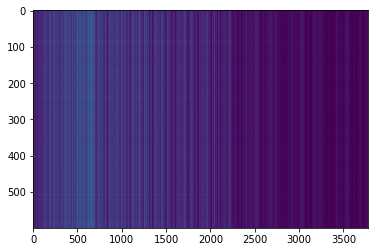

,AUC,pAUC
Source_0,0.637100,0.613684
Source_1,0.726700,0.630000
Source_2,0.817800,0.712632
Target_0,0.586200,0.645263
Target_1,0.749200,0.617368
Target_2,0.676200,0.520526
mean,0.698867,0.623246
h_mean,0.690608,0.617874


2021-05-30 21:22:06,852 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:60156.078451, val_AUC_hmean:0.690608, val_pAUC_hmean:0.617874, best_flag:True
2021-05-30 21:22:06,853 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.90it/s]
2021-05-30 21:22:07,865 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.47it/s]
2021-05-30 21:22:07,932 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.91it/s]
2021-05-30 21:22:07,996 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:59874.579427, val_AUC_hmean:0.687425, val_pAUC_hmean:0.616995, best_flag:False
2021-05-30 21:22:07,998 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.44it/s]
2021-05-30 21:22:08,651 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.53it/s]
2021-05-30 21:22:08,700 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.87it/s]
2021-05-30 21

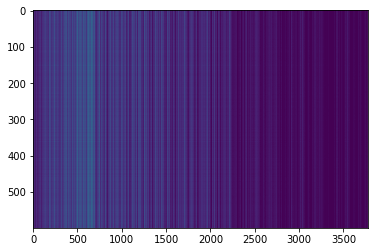

,AUC,pAUC
Source_0,0.645900,0.634737
Source_1,0.717200,0.615789
Source_2,0.819500,0.724737
Target_0,0.584000,0.643158
Target_1,0.744800,0.630526
Target_2,0.711400,0.532105
mean,0.703800,0.630175
h_mean,0.695778,0.625044


2021-05-30 21:22:14,480 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:57156.340169, val_AUC_hmean:0.695778, val_pAUC_hmean:0.625044, best_flag:True
2021-05-30 21:22:14,481 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.57it/s]
2021-05-30 21:22:15,167 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 72.42it/s]
2021-05-30 21:22:15,214 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.07it/s]
2021-05-30 21:22:15,268 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:56795.837565, val_AUC_hmean:0.685438, val_pAUC_hmean:0.618209, best_flag:False
2021-05-30 21:22:15,272 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.43it/s]
2021-05-30 21:22:15,963 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 82.56it/s]
2021-05-30 21:22:16,011 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.21it/s]
2021-05-30 21

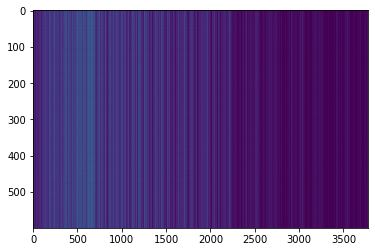

,AUC,pAUC
Source_0,0.649900,0.638947
Source_1,0.734500,0.632632
Source_2,0.813400,0.725789
Target_0,0.588400,0.650526
Target_1,0.741900,0.618947
Target_2,0.676000,0.527895
mean,0.700683,0.632456
h_mean,0.693138,0.626909


2021-05-30 21:22:22,557 - pytorch_modeler.py - INFO - epoch:32/300, train_losses:54450.540039, val_AUC_hmean:0.693138, val_pAUC_hmean:0.626909, best_flag:True
2021-05-30 21:22:22,560 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.59it/s]
2021-05-30 21:22:23,244 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.57it/s]
2021-05-30 21:22:23,291 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.27it/s]
2021-05-30 21:22:23,348 - pytorch_modeler.py - INFO - epoch:33/300, train_losses:53971.216146, val_AUC_hmean:0.702141, val_pAUC_hmean:0.624402, best_flag:False
2021-05-30 21:22:23,349 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.69it/s]
2021-05-30 21:22:24,029 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.43it/s]
2021-05-30 21:22:24,082 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 47.69it/s]
2021-05-30 21

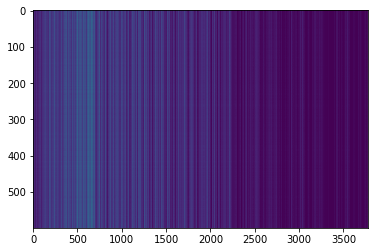

,AUC,pAUC
Source_0,0.674900,0.636842
Source_1,0.749300,0.624737
Source_2,0.824300,0.721579
Target_0,0.611100,0.653684
Target_1,0.746400,0.632105
Target_2,0.696200,0.527895
mean,0.717033,0.632807
h_mean,0.710736,0.627425


2021-05-30 21:22:31,459 - pytorch_modeler.py - INFO - epoch:40/300, train_losses:51297.880208, val_AUC_hmean:0.710736, val_pAUC_hmean:0.627425, best_flag:True
2021-05-30 21:22:31,464 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.97it/s]
2021-05-30 21:22:32,393 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.07it/s]
2021-05-30 21:22:32,451 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 44.43it/s]


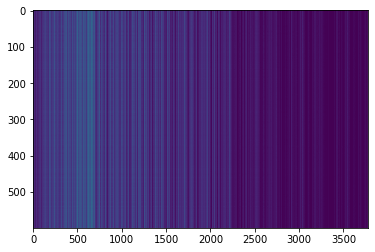

,AUC,pAUC
Source_0,0.679200,0.635789
Source_1,0.747100,0.645789
Source_2,0.827200,0.722632
Target_0,0.607500,0.646316
Target_1,0.754900,0.634737
Target_2,0.692400,0.527368
mean,0.718050,0.635439
h_mean,0.711343,0.629983


2021-05-30 21:22:34,479 - pytorch_modeler.py - INFO - epoch:41/300, train_losses:50909.670573, val_AUC_hmean:0.711343, val_pAUC_hmean:0.629983, best_flag:True
2021-05-30 21:22:34,482 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.28it/s]
2021-05-30 21:22:35,142 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.99it/s]
2021-05-30 21:22:35,196 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.30it/s]
2021-05-30 21:22:35,249 - pytorch_modeler.py - INFO - epoch:42/300, train_losses:50426.789388, val_AUC_hmean:0.707838, val_pAUC_hmean:0.620751, best_flag:False
2021-05-30 21:22:35,251 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.71it/s]
2021-05-30 21:22:36,128 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.86it/s]
2021-05-30 21:22:36,198 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.66it/s]
2021-05-30 21

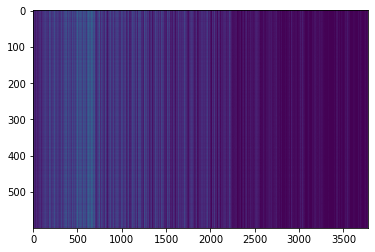

,AUC,pAUC
Source_0,0.664500,0.630526
Source_1,0.760700,0.665789
Source_2,0.817700,0.709474
Target_0,0.594600,0.645789
Target_1,0.764400,0.638421
Target_2,0.692100,0.525789
mean,0.715667,0.635965
h_mean,0.707772,0.630636


2021-05-30 21:22:40,281 - pytorch_modeler.py - INFO - epoch:45/300, train_losses:49220.997070, val_AUC_hmean:0.707772, val_pAUC_hmean:0.630636, best_flag:True
2021-05-30 21:22:40,282 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.42it/s]
2021-05-30 21:22:41,250 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.29it/s]
2021-05-30 21:22:41,318 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.12it/s]
2021-05-30 21:22:41,390 - pytorch_modeler.py - INFO - epoch:46/300, train_losses:48859.453125, val_AUC_hmean:0.705620, val_pAUC_hmean:0.619228, best_flag:False
2021-05-30 21:22:41,391 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.19it/s]
2021-05-30 21:22:42,019 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.53it/s]
2021-05-30 21:22:42,079 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.67it/s]
2021-05-30 21

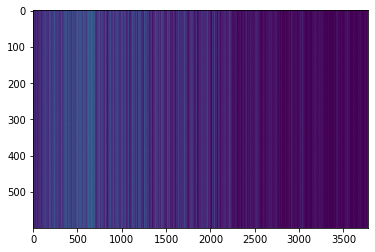

,AUC,pAUC
Source_0,0.703300,0.634211
Source_1,0.761600,0.671053
Source_2,0.826800,0.710000
Target_0,0.611100,0.648947
Target_1,0.759800,0.635789
Target_2,0.676300,0.520526
mean,0.723150,0.636754
h_mean,0.716372,0.630892


2021-05-30 21:22:47,652 - pytorch_modeler.py - INFO - epoch:51/300, train_losses:47255.192708, val_AUC_hmean:0.716372, val_pAUC_hmean:0.630892, best_flag:True
2021-05-30 21:22:47,653 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.56it/s]
2021-05-30 21:22:48,540 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.37it/s]
2021-05-30 21:22:48,596 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.91it/s]
2021-05-30 21:22:48,651 - pytorch_modeler.py - INFO - epoch:52/300, train_losses:47017.333333, val_AUC_hmean:0.713463, val_pAUC_hmean:0.623395, best_flag:False
2021-05-30 21:22:48,652 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.51it/s]
2021-05-30 21:22:49,270 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.16it/s]
2021-05-30 21:22:49,326 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.22it/s]
2021-05-30 21

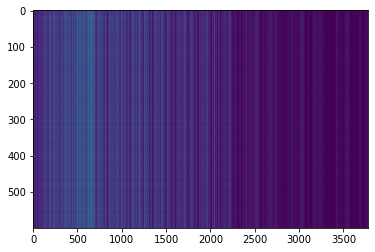

,AUC,pAUC
Source_0,0.720300,0.639474
Source_1,0.758700,0.666316
Source_2,0.821900,0.703158
Target_0,0.623100,0.652632
Target_1,0.763200,0.644211
Target_2,0.666400,0.518421
mean,0.725600,0.637368
h_mean,0.719528,0.631565


2021-05-30 21:22:57,680 - pytorch_modeler.py - INFO - epoch:60/300, train_losses:44365.852214, val_AUC_hmean:0.719528, val_pAUC_hmean:0.631565, best_flag:True
2021-05-30 21:22:57,681 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.09it/s]
2021-05-30 21:22:58,676 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.09it/s]
2021-05-30 21:22:58,732 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.52it/s]
2021-05-30 21:22:58,795 - pytorch_modeler.py - INFO - epoch:61/300, train_losses:43926.553385, val_AUC_hmean:0.716866, val_pAUC_hmean:0.620801, best_flag:False
2021-05-30 21:22:58,797 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.82it/s]
2021-05-30 21:22:59,735 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 45.14it/s]
2021-05-30 21:22:59,808 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 44.04it/s]
2021-05-30 21

100%|██████████| 2/2 [00:00<00:00, 60.17it/s]
2021-05-30 21:23:15,231 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.96it/s]
2021-05-30 21:23:15,289 - pytorch_modeler.py - INFO - epoch:77/300, train_losses:39192.827799, val_AUC_hmean:0.713478, val_pAUC_hmean:0.616626, best_flag:False
2021-05-30 21:23:15,291 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.49it/s]
2021-05-30 21:23:16,254 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.45it/s]
2021-05-30 21:23:16,313 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.60it/s]
2021-05-30 21:23:16,386 - pytorch_modeler.py - INFO - epoch:78/300, train_losses:38920.722005, val_AUC_hmean:0.730327, val_pAUC_hmean:0.630183, best_flag:False
2021-05-30 21:23:16,387 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.16it/s]
2021-05-30 21:23:17,377 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 21:23:32,397 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.32it/s]
2021-05-30 21:23:33,020 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 65.08it/s]
2021-05-30 21:23:33,075 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.46it/s]
2021-05-30 21:23:33,133 - pytorch_modeler.py - INFO - epoch:94/300, train_losses:34389.879883, val_AUC_hmean:0.720540, val_pAUC_hmean:0.617798, best_flag:False
2021-05-30 21:23:33,135 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.56it/s]
2021-05-30 21:23:34,092 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.49it/s]
2021-05-30 21:23:34,146 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.75it/s]
2021-05-30 21:23:34,216 - pytorch_modeler.py - INFO - epoch:95/300, train_losses:34252.720052, val_AUC_hmean:0.717306, val_pAUC_hmean:0.624294, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 43.95it/s]
2021-05-30 21:23:49,883 - pytorch_modeler.py - INFO - epoch:110/300, train_losses:30506.015462, val_AUC_hmean:0.723009, val_pAUC_hmean:0.621611, best_flag:False
2021-05-30 21:23:49,884 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 10.94it/s]
2021-05-30 21:23:50,985 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.19it/s]
2021-05-30 21:23:51,050 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 38.83it/s]
2021-05-30 21:23:51,132 - pytorch_modeler.py - INFO - epoch:111/300, train_losses:30311.926107, val_AUC_hmean:0.730435, val_pAUC_hmean:0.619964, best_flag:False
2021-05-30 21:23:51,134 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.55it/s]
2021-05-30 21:23:52,092 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.09it/s]
2021-05-30 21:23:52,170 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 12.64it/s]
2021-05-30 21:24:08,454 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.05it/s]
2021-05-30 21:24:08,518 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.95it/s]
2021-05-30 21:24:08,577 - pytorch_modeler.py - INFO - epoch:127/300, train_losses:26649.639486, val_AUC_hmean:0.723661, val_pAUC_hmean:0.620707, best_flag:False
2021-05-30 21:24:08,578 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.62it/s]
2021-05-30 21:24:09,531 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.64it/s]
2021-05-30 21:24:09,587 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 47.74it/s]
2021-05-30 21:24:09,659 - pytorch_modeler.py - INFO - epoch:128/300, train_losses:26554.409831, val_AUC_hmean:0.724550, val_pAUC_hmean:0.621753, best_flag:False
2021-05-30 21:24:09,660 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 67.75it/s]
2021-05-30 21:24:26,372 - pytorch_modeler.py - INFO - epoch:143/300, train_losses:23422.292155, val_AUC_hmean:0.733895, val_pAUC_hmean:0.626632, best_flag:False
2021-05-30 21:24:26,373 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.33it/s]
2021-05-30 21:24:27,348 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.84it/s]
2021-05-30 21:24:27,407 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 42.42it/s]
2021-05-30 21:24:27,486 - pytorch_modeler.py - INFO - epoch:144/300, train_losses:23279.295410, val_AUC_hmean:0.723526, val_pAUC_hmean:0.618847, best_flag:False
2021-05-30 21:24:27,487 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.73it/s]
2021-05-30 21:24:28,432 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.10it/s]
2021-05-30 21:24:28,496 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 12.62it/s]
2021-05-30 21:24:44,921 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.38it/s]
2021-05-30 21:24:44,987 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.46it/s]
2021-05-30 21:24:45,058 - pytorch_modeler.py - INFO - epoch:160/300, train_losses:20221.639974, val_AUC_hmean:0.734096, val_pAUC_hmean:0.619669, best_flag:False
2021-05-30 21:24:45,059 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.40it/s]
2021-05-30 21:24:46,029 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.33it/s]
2021-05-30 21:24:46,083 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 43.60it/s]
2021-05-30 21:24:46,160 - pytorch_modeler.py - INFO - epoch:161/300, train_losses:20052.531413, val_AUC_hmean:0.738563, val_pAUC_hmean:0.627121, best_flag:False
2021-05-30 21:24:46,161 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 36.66it/s]
2021-05-30 21:25:02,411 - pytorch_modeler.py - INFO - epoch:176/300, train_losses:17759.018392, val_AUC_hmean:0.727730, val_pAUC_hmean:0.616925, best_flag:False
2021-05-30 21:25:02,413 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.28it/s]
2021-05-30 21:25:03,318 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 64.65it/s]
2021-05-30 21:25:03,368 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.85it/s]
2021-05-30 21:25:03,427 - pytorch_modeler.py - INFO - epoch:177/300, train_losses:17498.992188, val_AUC_hmean:0.728141, val_pAUC_hmean:0.621403, best_flag:False
2021-05-30 21:25:03,428 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.76it/s]
2021-05-30 21:25:04,370 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.46it/s]
2021-05-30 21:25:04,427 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 12.24it/s]
2021-05-30 21:25:20,681 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 36.03it/s]
2021-05-30 21:25:20,766 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 44.49it/s]
2021-05-30 21:25:20,865 - pytorch_modeler.py - INFO - epoch:193/300, train_losses:15206.837565, val_AUC_hmean:0.724693, val_pAUC_hmean:0.615369, best_flag:False
2021-05-30 21:25:20,866 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.15it/s]
2021-05-30 21:25:21,857 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.66it/s]
2021-05-30 21:25:21,917 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 39.31it/s]
2021-05-30 21:25:21,997 - pytorch_modeler.py - INFO - epoch:194/300, train_losses:15102.923991, val_AUC_hmean:0.722456, val_pAUC_hmean:0.623235, best_flag:False
2021-05-30 21:25:21,998 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 76.03it/s]
2021-05-30 21:25:38,501 - pytorch_modeler.py - INFO - epoch:209/300, train_losses:12976.320882, val_AUC_hmean:0.728938, val_pAUC_hmean:0.618896, best_flag:False
2021-05-30 21:25:38,503 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.29it/s]
2021-05-30 21:25:39,128 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.13it/s]
2021-05-30 21:25:39,178 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.95it/s]
2021-05-30 21:25:39,233 - pytorch_modeler.py - INFO - epoch:210/300, train_losses:12991.107503, val_AUC_hmean:0.738006, val_pAUC_hmean:0.620525, best_flag:False
2021-05-30 21:25:39,235 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.49it/s]
2021-05-30 21:25:39,886 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.31it/s]
2021-05-30 21:25:39,935 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 12.37it/s]
2021-05-30 21:25:52,030 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.75it/s]
2021-05-30 21:25:52,095 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.19it/s]
2021-05-30 21:25:52,152 - pytorch_modeler.py - INFO - epoch:226/300, train_losses:11174.727865, val_AUC_hmean:0.726083, val_pAUC_hmean:0.625423, best_flag:False
2021-05-30 21:25:52,153 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.03it/s]
2021-05-30 21:25:52,786 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.84it/s]
2021-05-30 21:25:52,847 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.12it/s]
2021-05-30 21:25:52,908 - pytorch_modeler.py - INFO - epoch:227/300, train_losses:10888.173421, val_AUC_hmean:0.733911, val_pAUC_hmean:0.620250, best_flag:False
2021-05-30 21:25:52,910 - pytorch_modeler.py - INFO - train
100%|█████

2021-05-30 21:26:06,270 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.51it/s]
2021-05-30 21:26:07,232 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.30it/s]
2021-05-30 21:26:07,278 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.89it/s]
2021-05-30 21:26:07,328 - pytorch_modeler.py - INFO - epoch:243/300, train_losses:9308.372803, val_AUC_hmean:0.728076, val_pAUC_hmean:0.619968, best_flag:False
2021-05-30 21:26:07,329 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.37it/s]
2021-05-30 21:26:08,066 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.61it/s]
2021-05-30 21:26:08,129 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.24it/s]
2021-05-30 21:26:08,180 - pytorch_modeler.py - INFO - epoch:244/300, train_losses:9128.524821, val_AUC_hmean:0.724785, val_pAUC_hmean:0.614042, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 50.27it/s]
2021-05-30 21:26:21,477 - pytorch_modeler.py - INFO - epoch:259/300, train_losses:7860.054321, val_AUC_hmean:0.724755, val_pAUC_hmean:0.616393, best_flag:False
2021-05-30 21:26:21,485 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.90it/s]
2021-05-30 21:26:22,418 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.20it/s]
2021-05-30 21:26:22,482 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.59it/s]
2021-05-30 21:26:22,546 - pytorch_modeler.py - INFO - epoch:260/300, train_losses:7900.622477, val_AUC_hmean:0.738850, val_pAUC_hmean:0.624355, best_flag:False
2021-05-30 21:26:22,548 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.66it/s]
2021-05-30 21:26:23,229 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.21it/s]
2021-05-30 21:26:23,283 - pytorch_modeler.py - INFO - valid_target
100%|███████

100%|██████████| 12/12 [00:00<00:00, 19.54it/s]
2021-05-30 21:26:36,793 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.45it/s]
2021-05-30 21:26:36,845 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 89.54it/s]
2021-05-30 21:26:36,894 - pytorch_modeler.py - INFO - epoch:276/300, train_losses:6755.010417, val_AUC_hmean:0.733208, val_pAUC_hmean:0.609961, best_flag:False
2021-05-30 21:26:36,895 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.96it/s]
2021-05-30 21:26:37,530 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.12it/s]
2021-05-30 21:26:37,581 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 87.20it/s]
2021-05-30 21:26:37,635 - pytorch_modeler.py - INFO - epoch:277/300, train_losses:6684.026367, val_AUC_hmean:0.733366, val_pAUC_hmean:0.609585, best_flag:False
2021-05-30 21:26:37,636 - pytorch_modeler.py - INFO - train
100%|███████

2021-05-30 21:26:52,815 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.35it/s]
2021-05-30 21:26:53,438 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.32it/s]
2021-05-30 21:26:53,502 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.58it/s]
2021-05-30 21:26:53,564 - pytorch_modeler.py - INFO - epoch:293/300, train_losses:5531.689006, val_AUC_hmean:0.725211, val_pAUC_hmean:0.610484, best_flag:False
2021-05-30 21:26:53,566 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.21it/s]
2021-05-30 21:26:54,412 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.26it/s]
2021-05-30 21:26:54,472 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.85it/s]
2021-05-30 21:26:54,533 - pytorch_modeler.py - INFO - epoch:294/300, train_losses:5521.237752, val_AUC_hmean:0.730461, val_pAUC_hmean:0.616460, best_flag:False
2021-05-30 2

,AUC,pAUC
Source_0,0.720300,0.639474
Source_1,0.758700,0.666316
Source_2,0.821900,0.703158
Target_0,0.623100,0.652632
Target_1,0.763200,0.644211
Target_2,0.666400,0.518421
mean,0.725600,0.637368
h_mean,0.719528,0.631565


2021-05-30 21:27:00,493 - 00_train.py - INFO - TARGET MACHINE_TYPE: fan
2021-05-30 21:27:00,494 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 21:27:00,496 - 00_train.py - INFO - TRAINING


elapsed time: 337.473862648 [sec]


2021-05-30 21:27:00,904 - pytorch_modeler.py - INFO - train
 17%|█▋        | 2/12 [00:00<00:00, 19.15it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 19.11it/s]
2021-05-30 21:27:01,535 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.79it/s]
2021-05-30 21:27:01,585 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.15it/s]


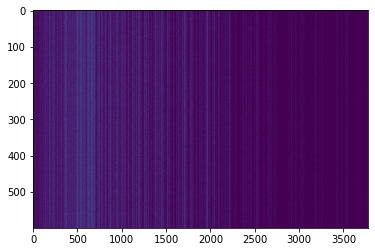

,AUC,pAUC
Source_0,0.528800,0.533684
Source_1,0.577500,0.525789
Source_2,0.634500,0.517895
Target_0,0.483800,0.545789
Target_1,0.632200,0.584211
Target_2,0.508300,0.490000
mean,0.560850,0.532895
h_mean,0.554795,0.531383


2021-05-30 21:27:03,404 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:192756.845052, val_AUC_hmean:0.554795, val_pAUC_hmean:0.531383, best_flag:True
2021-05-30 21:27:03,405 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.49it/s]
2021-05-30 21:27:04,368 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.08it/s]
2021-05-30 21:27:04,436 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.57it/s]


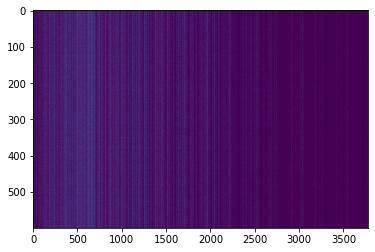

,AUC,pAUC
Source_0,0.543800,0.549474
Source_1,0.575900,0.541053
Source_2,0.651800,0.543684
Target_0,0.509900,0.584211
Target_1,0.661800,0.567895
Target_2,0.584100,0.493684
mean,0.587883,0.546667
h_mean,0.582877,0.545174


2021-05-30 21:27:06,233 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:131230.410156, val_AUC_hmean:0.582877, val_pAUC_hmean:0.545174, best_flag:True
2021-05-30 21:27:06,234 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.50it/s]
2021-05-30 21:27:07,196 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 51.78it/s]
2021-05-30 21:27:07,264 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.15it/s]


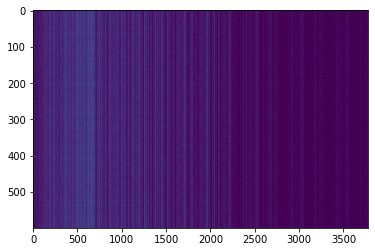

,AUC,pAUC
Source_0,0.557500,0.562632
Source_1,0.585700,0.538947
Source_2,0.673800,0.562632
Target_0,0.541700,0.608947
Target_1,0.654100,0.561579
Target_2,0.602100,0.516316
mean,0.602483,0.558509
h_mean,0.598748,0.557110


2021-05-30 21:27:09,080 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:101921.861979, val_AUC_hmean:0.598748, val_pAUC_hmean:0.557110, best_flag:True
2021-05-30 21:27:09,082 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 13.47it/s]
2021-05-30 21:27:09,975 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.72it/s]
2021-05-30 21:27:10,043 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.48it/s]


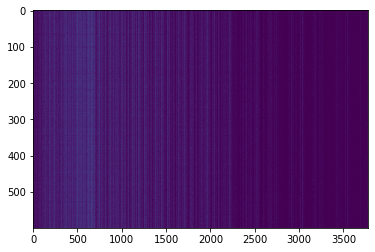

,AUC,pAUC
Source_0,0.565700,0.586842
Source_1,0.628800,0.557895
Source_2,0.727300,0.581053
Target_0,0.551300,0.623684
Target_1,0.678000,0.561579
Target_2,0.638400,0.508947
mean,0.631583,0.570000
h_mean,0.625767,0.567837


2021-05-30 21:27:12,012 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:87415.554688, val_AUC_hmean:0.625767, val_pAUC_hmean:0.567837, best_flag:True
2021-05-30 21:27:12,014 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.32it/s]
2021-05-30 21:27:12,995 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.43it/s]
2021-05-30 21:27:13,062 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 38.92it/s]


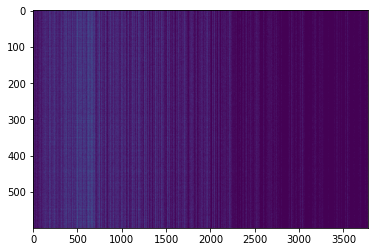

,AUC,pAUC
Source_0,0.575900,0.582105
Source_1,0.629300,0.568947
Source_2,0.771700,0.584211
Target_0,0.547500,0.621053
Target_1,0.681900,0.565263
Target_2,0.649600,0.501053
mean,0.642650,0.570439
h_mean,0.634672,0.568058


2021-05-30 21:27:15,174 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:79851.922526, val_AUC_hmean:0.634672, val_pAUC_hmean:0.568058, best_flag:True
2021-05-30 21:27:15,175 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.77it/s]
2021-05-30 21:27:16,117 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.84it/s]
2021-05-30 21:27:16,191 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.13it/s]


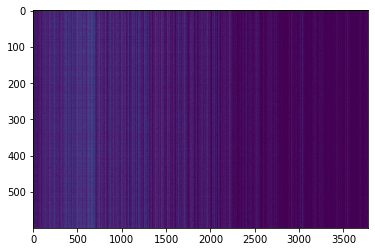

,AUC,pAUC
Source_0,0.587500,0.585789
Source_1,0.664400,0.564211
Source_2,0.810800,0.633158
Target_0,0.556000,0.628947
Target_1,0.684600,0.568421
Target_2,0.636300,0.503158
mean,0.656600,0.580614
h_mean,0.647148,0.577171


2021-05-30 21:27:18,305 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:75621.634115, val_AUC_hmean:0.647148, val_pAUC_hmean:0.577171, best_flag:True
2021-05-30 21:27:18,306 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.51it/s]
2021-05-30 21:27:19,268 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.36it/s]
2021-05-30 21:27:19,341 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 44.97it/s]


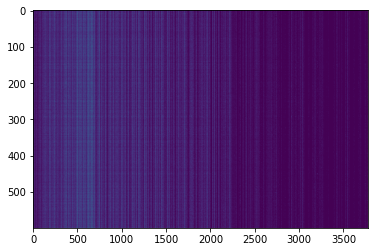

,AUC,pAUC
Source_0,0.594400,0.587368
Source_1,0.679300,0.572632
Source_2,0.817500,0.624211
Target_0,0.550900,0.633684
Target_1,0.695400,0.575263
Target_2,0.620400,0.493684
mean,0.659650,0.581140
h_mean,0.649153,0.577320


2021-05-30 21:27:21,653 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:72494.524740, val_AUC_hmean:0.649153, val_pAUC_hmean:0.577320, best_flag:True
2021-05-30 21:27:21,654 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.56it/s]
2021-05-30 21:27:22,611 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.18it/s]
2021-05-30 21:27:22,671 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.73it/s]


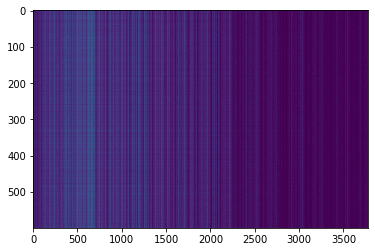

,AUC,pAUC
Source_0,0.596800,0.589474
Source_1,0.687000,0.595263
Source_2,0.809000,0.640526
Target_0,0.564500,0.638947
Target_1,0.698500,0.591053
Target_2,0.684200,0.506842
mean,0.673333,0.593684
h_mean,0.664306,0.590113


2021-05-30 21:27:24,582 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:70638.839844, val_AUC_hmean:0.664306, val_pAUC_hmean:0.590113, best_flag:True
2021-05-30 21:27:24,583 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.66it/s]
2021-05-30 21:27:25,533 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 65.56it/s]
2021-05-30 21:27:25,586 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.23it/s]
2021-05-30 21:27:25,666 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:68737.241536, val_AUC_hmean:0.644317, val_pAUC_hmean:0.583719, best_flag:False
2021-05-30 21:27:25,667 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.24it/s]
2021-05-30 21:27:26,650 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.82it/s]
2021-05-30 21:27:26,708 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.02it/s]
2021-05-30 21:2

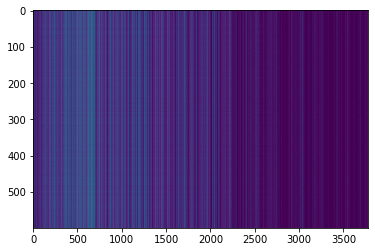

,AUC,pAUC
Source_0,0.622200,0.609474
Source_1,0.700000,0.585789
Source_2,0.816700,0.670000
Target_0,0.585800,0.645789
Target_1,0.706100,0.593684
Target_2,0.643900,0.500000
mean,0.679117,0.600789
h_mean,0.671400,0.595635


2021-05-30 21:27:29,874 - pytorch_modeler.py - INFO - epoch:11/300, train_losses:66267.267253, val_AUC_hmean:0.671400, val_pAUC_hmean:0.595635, best_flag:True
2021-05-30 21:27:29,875 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.59it/s]
2021-05-30 21:27:30,491 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 73.44it/s]
2021-05-30 21:27:30,540 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 82.56it/s]


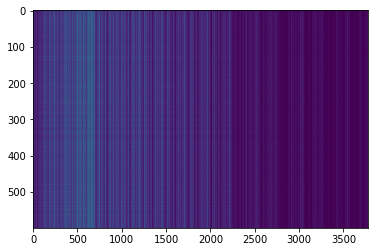

,AUC,pAUC
Source_0,0.633000,0.608947
Source_1,0.709200,0.610526
Source_2,0.832700,0.683158
Target_0,0.587600,0.641579
Target_1,0.706800,0.592632
Target_2,0.674400,0.504737
mean,0.690617,0.606930
h_mean,0.682579,0.601735


2021-05-30 21:27:32,449 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:65119.800781, val_AUC_hmean:0.682579, val_pAUC_hmean:0.601735, best_flag:True
2021-05-30 21:27:32,450 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.41it/s]
2021-05-30 21:27:33,421 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.32it/s]
2021-05-30 21:27:33,478 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.06it/s]
2021-05-30 21:27:33,543 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:64859.759766, val_AUC_hmean:0.674980, val_pAUC_hmean:0.586585, best_flag:False
2021-05-30 21:27:33,545 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 10.75it/s]
2021-05-30 21:27:34,665 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 40.49it/s]
2021-05-30 21:27:34,753 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.00it/s]


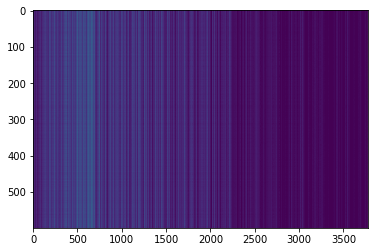

,AUC,pAUC
Source_0,0.644700,0.614211
Source_1,0.690000,0.584211
Source_2,0.815000,0.706842
Target_0,0.606200,0.650526
Target_1,0.715700,0.604211
Target_2,0.662500,0.514211
mean,0.689017,0.612368
h_mean,0.683086,0.606578


2021-05-30 21:27:36,727 - pytorch_modeler.py - INFO - epoch:14/300, train_losses:63822.285807, val_AUC_hmean:0.683086, val_pAUC_hmean:0.606578, best_flag:True
2021-05-30 21:27:36,728 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.64it/s]
2021-05-30 21:27:37,680 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.66it/s]
2021-05-30 21:27:37,741 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.26it/s]
2021-05-30 21:27:37,813 - pytorch_modeler.py - INFO - epoch:15/300, train_losses:63185.137695, val_AUC_hmean:0.686690, val_pAUC_hmean:0.597913, best_flag:False
2021-05-30 21:27:37,814 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.54it/s]
2021-05-30 21:27:38,774 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.49it/s]
2021-05-30 21:27:38,829 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 67.02it/s]


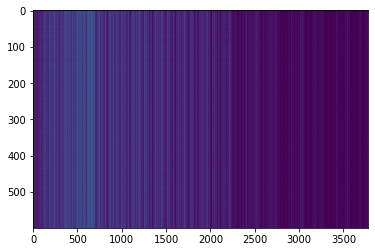

,AUC,pAUC
Source_0,0.664500,0.624737
Source_1,0.718200,0.603158
Source_2,0.836000,0.689474
Target_0,0.618800,0.649474
Target_1,0.721500,0.598947
Target_2,0.671200,0.513684
mean,0.705033,0.613246
h_mean,0.698866,0.608210


2021-05-30 21:27:40,824 - pytorch_modeler.py - INFO - epoch:16/300, train_losses:62275.820964, val_AUC_hmean:0.698866, val_pAUC_hmean:0.608210, best_flag:True
2021-05-30 21:27:40,825 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.72it/s]
2021-05-30 21:27:41,469 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 64.77it/s]
2021-05-30 21:27:41,528 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 76.33it/s]


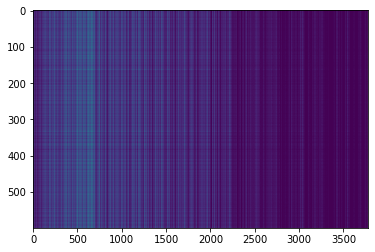

,AUC,pAUC
Source_0,0.663100,0.615789
Source_1,0.733300,0.624211
Source_2,0.827200,0.673684
Target_0,0.619300,0.654737
Target_1,0.723500,0.591053
Target_2,0.676600,0.522632
mean,0.707167,0.613684
h_mean,0.701300,0.609573


2021-05-30 21:27:43,408 - pytorch_modeler.py - INFO - epoch:17/300, train_losses:61347.401367, val_AUC_hmean:0.701300, val_pAUC_hmean:0.609573, best_flag:True
2021-05-30 21:27:43,410 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.60it/s]
2021-05-30 21:27:44,057 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.99it/s]
2021-05-30 21:27:44,116 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.93it/s]
2021-05-30 21:27:44,175 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:60685.520833, val_AUC_hmean:0.695859, val_pAUC_hmean:0.607739, best_flag:False
2021-05-30 21:27:44,178 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.99it/s]
2021-05-30 21:27:44,812 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.19it/s]
2021-05-30 21:27:44,859 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.42it/s]


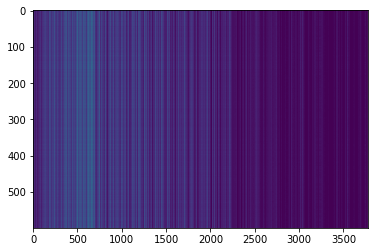

,AUC,pAUC
Source_0,0.671100,0.622105
Source_1,0.720800,0.616842
Source_2,0.838200,0.699474
Target_0,0.615100,0.653158
Target_1,0.715400,0.590526
Target_2,0.672900,0.520526
mean,0.705583,0.617105
h_mean,0.699289,0.612007


2021-05-30 21:27:46,551 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:60079.493164, val_AUC_hmean:0.699289, val_pAUC_hmean:0.612007, best_flag:True
2021-05-30 21:27:46,552 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.38it/s]
2021-05-30 21:27:47,174 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.17it/s]
2021-05-30 21:27:47,221 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.44it/s]


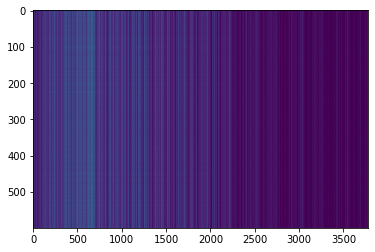

,AUC,pAUC
Source_0,0.672100,0.621579
Source_1,0.743700,0.646316
Source_2,0.836900,0.718421
Target_0,0.624300,0.645789
Target_1,0.732300,0.593158
Target_2,0.677900,0.515263
mean,0.714533,0.623421
h_mean,0.708392,0.617086


2021-05-30 21:27:49,042 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:59516.164062, val_AUC_hmean:0.708392, val_pAUC_hmean:0.617086, best_flag:True
2021-05-30 21:27:49,043 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.90it/s]
2021-05-30 21:27:49,716 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.70it/s]
2021-05-30 21:27:49,764 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.99it/s]
2021-05-30 21:27:49,819 - pytorch_modeler.py - INFO - epoch:21/300, train_losses:58820.072266, val_AUC_hmean:0.701717, val_pAUC_hmean:0.616007, best_flag:False
2021-05-30 21:27:49,820 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.51it/s]
2021-05-30 21:27:50,471 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.82it/s]
2021-05-30 21:27:50,541 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.42it/s]
2021-05-30 21

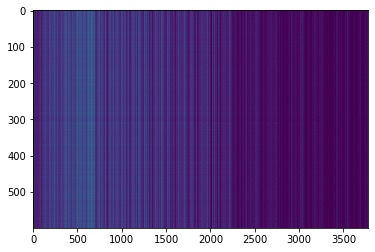

,AUC,pAUC
Source_0,0.676200,0.630526
Source_1,0.754600,0.647895
Source_2,0.813500,0.696842
Target_0,0.631000,0.655789
Target_1,0.749200,0.612105
Target_2,0.673900,0.524737
mean,0.716400,0.627982
h_mean,0.711174,0.623132


2021-05-30 21:27:53,295 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:57972.561198, val_AUC_hmean:0.711174, val_pAUC_hmean:0.623132, best_flag:True
2021-05-30 21:27:53,296 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.22it/s]
2021-05-30 21:27:53,922 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.15it/s]
2021-05-30 21:27:53,977 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 68.05it/s]
2021-05-30 21:27:54,033 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:57538.533854, val_AUC_hmean:0.709807, val_pAUC_hmean:0.615349, best_flag:False
2021-05-30 21:27:54,035 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.37it/s]
2021-05-30 21:27:54,770 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.84it/s]
2021-05-30 21:27:54,837 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 44.11it/s]


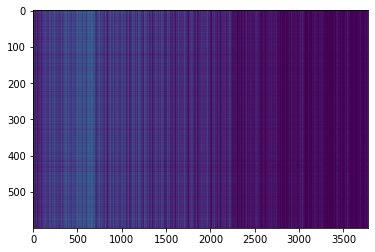

,AUC,pAUC
Source_0,0.668100,0.623158
Source_1,0.752000,0.665263
Source_2,0.817100,0.706842
Target_0,0.614500,0.648421
Target_1,0.759800,0.626316
Target_2,0.697400,0.534211
mean,0.718150,0.634035
h_mean,0.711931,0.629366


2021-05-30 21:27:56,898 - pytorch_modeler.py - INFO - epoch:25/300, train_losses:57010.713867, val_AUC_hmean:0.711931, val_pAUC_hmean:0.629366, best_flag:True
2021-05-30 21:27:56,900 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.28it/s]
2021-05-30 21:27:57,743 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.59it/s]
2021-05-30 21:27:57,811 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.94it/s]
2021-05-30 21:27:57,885 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:56364.637695, val_AUC_hmean:0.722141, val_pAUC_hmean:0.626635, best_flag:False
2021-05-30 21:27:57,886 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 16.72it/s]
2021-05-30 21:27:58,606 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.27it/s]
2021-05-30 21:27:58,656 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.68it/s]
2021-05-30 21

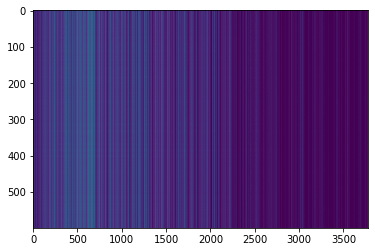

,AUC,pAUC
Source_0,0.708200,0.633684
Source_1,0.761500,0.659474
Source_2,0.825100,0.701053
Target_0,0.650300,0.663158
Target_1,0.757200,0.623158
Target_2,0.694500,0.537895
mean,0.732800,0.636404
h_mean,0.728554,0.632070


2021-05-30 21:28:03,984 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:54183.800781, val_AUC_hmean:0.728554, val_pAUC_hmean:0.632070, best_flag:True
2021-05-30 21:28:03,986 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.46it/s]
2021-05-30 21:28:04,639 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.52it/s]
2021-05-30 21:28:04,690 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.71it/s]
2021-05-30 21:28:04,747 - pytorch_modeler.py - INFO - epoch:32/300, train_losses:53773.364909, val_AUC_hmean:0.712612, val_pAUC_hmean:0.618350, best_flag:False
2021-05-30 21:28:04,748 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.48it/s]
2021-05-30 21:28:05,399 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.61it/s]
2021-05-30 21:28:05,454 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 42.89it/s]
2021-05-30 21

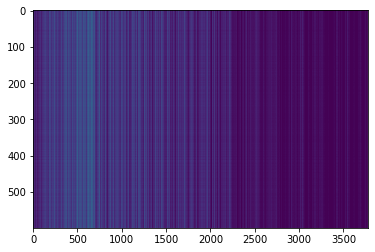

,AUC,pAUC
Source_0,0.697600,0.640000
Source_1,0.754300,0.649474
Source_2,0.837000,0.720000
Target_0,0.611100,0.653158
Target_1,0.760900,0.621579
Target_2,0.691000,0.537368
mean,0.725317,0.636930
h_mean,0.718411,0.632121


2021-05-30 21:28:11,211 - pytorch_modeler.py - INFO - epoch:37/300, train_losses:51765.095378, val_AUC_hmean:0.718411, val_pAUC_hmean:0.632121, best_flag:True
2021-05-30 21:28:11,212 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.16it/s]
2021-05-30 21:28:11,914 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.96it/s]
2021-05-30 21:28:11,968 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 40.91it/s]
2021-05-30 21:28:12,048 - pytorch_modeler.py - INFO - epoch:38/300, train_losses:51271.099284, val_AUC_hmean:0.718509, val_pAUC_hmean:0.622446, best_flag:False
2021-05-30 21:28:12,049 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.29it/s]
2021-05-30 21:28:13,028 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 45.57it/s]
2021-05-30 21:28:13,099 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.06it/s]
2021-05-30 21

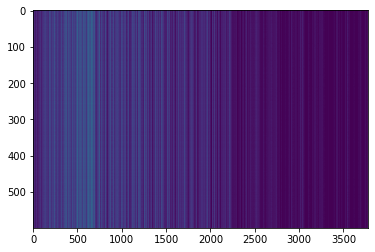

,AUC,pAUC
Source_0,0.696800,0.641579
Source_1,0.768400,0.681579
Source_2,0.821000,0.714737
Target_0,0.612500,0.658947
Target_1,0.784800,0.643684
Target_2,0.704000,0.545263
mean,0.731250,0.647632
h_mean,0.724473,0.643083


2021-05-30 21:28:17,349 - pytorch_modeler.py - INFO - epoch:42/300, train_losses:49769.696940, val_AUC_hmean:0.724473, val_pAUC_hmean:0.643083, best_flag:True
2021-05-30 21:28:17,350 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.24it/s]
2021-05-30 21:28:18,332 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.22it/s]
2021-05-30 21:28:18,396 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 36.15it/s]
2021-05-30 21:28:18,478 - pytorch_modeler.py - INFO - epoch:43/300, train_losses:49487.178060, val_AUC_hmean:0.729538, val_pAUC_hmean:0.622123, best_flag:False
2021-05-30 21:28:18,479 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.49it/s]
2021-05-30 21:28:19,442 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.62it/s]
2021-05-30 21:28:19,503 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 42.44it/s]
2021-05-30 21

100%|██████████| 2/2 [00:00<00:00, 52.15it/s]
2021-05-30 21:28:36,031 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.79it/s]
2021-05-30 21:28:36,097 - pytorch_modeler.py - INFO - epoch:59/300, train_losses:43835.468099, val_AUC_hmean:0.727718, val_pAUC_hmean:0.624546, best_flag:False
2021-05-30 21:28:36,098 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.45it/s]
2021-05-30 21:28:37,064 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 40.18it/s]
2021-05-30 21:28:37,139 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 53.87it/s]
2021-05-30 21:28:37,202 - pytorch_modeler.py - INFO - epoch:60/300, train_losses:43606.808594, val_AUC_hmean:0.725691, val_pAUC_hmean:0.634819, best_flag:False
2021-05-30 21:28:37,203 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.72it/s]
2021-05-30 21:28:38,148 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 21:28:53,892 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.50it/s]
2021-05-30 21:28:54,854 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.26it/s]
2021-05-30 21:28:54,926 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.52it/s]
2021-05-30 21:28:54,985 - pytorch_modeler.py - INFO - epoch:76/300, train_losses:38780.863281, val_AUC_hmean:0.722256, val_pAUC_hmean:0.631461, best_flag:False
2021-05-30 21:28:54,986 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.41it/s]
2021-05-30 21:28:55,956 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.67it/s]
2021-05-30 21:28:56,023 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.35it/s]
2021-05-30 21:28:56,079 - pytorch_modeler.py - INFO - epoch:77/300, train_losses:38545.431315, val_AUC_hmean:0.731142, val_pAUC_hmean:0.626239, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 73.01it/s]
2021-05-30 21:29:12,392 - pytorch_modeler.py - INFO - epoch:92/300, train_losses:34323.113281, val_AUC_hmean:0.729554, val_pAUC_hmean:0.626821, best_flag:False
2021-05-30 21:29:12,393 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.49it/s]
2021-05-30 21:29:13,440 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.55it/s]
2021-05-30 21:29:13,497 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 53.57it/s]
2021-05-30 21:29:13,558 - pytorch_modeler.py - INFO - epoch:93/300, train_losses:33996.973958, val_AUC_hmean:0.736472, val_pAUC_hmean:0.632819, best_flag:False
2021-05-30 21:29:13,559 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.38it/s]
2021-05-30 21:29:14,531 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 54.26it/s]
2021-05-30 21:29:14,595 - pytorch_modeler.py - INFO - valid_target
100%|███████

100%|██████████| 12/12 [00:00<00:00, 18.04it/s]
2021-05-30 21:29:27,436 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.35it/s]
2021-05-30 21:29:27,488 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.21it/s]
2021-05-30 21:29:27,544 - pytorch_modeler.py - INFO - epoch:109/300, train_losses:30040.266113, val_AUC_hmean:0.741133, val_pAUC_hmean:0.625147, best_flag:False
2021-05-30 21:29:27,546 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.86it/s]
2021-05-30 21:29:28,186 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.88it/s]
2021-05-30 21:29:28,232 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.47it/s]
2021-05-30 21:29:28,312 - pytorch_modeler.py - INFO - epoch:110/300, train_losses:29869.428711, val_AUC_hmean:0.735272, val_pAUC_hmean:0.628228, best_flag:False
2021-05-30 21:29:28,313 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 78.04it/s]
2021-05-30 21:29:39,812 - pytorch_modeler.py - INFO - epoch:125/300, train_losses:26489.117188, val_AUC_hmean:0.734296, val_pAUC_hmean:0.629867, best_flag:False
2021-05-30 21:29:39,813 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 15.25it/s]
2021-05-30 21:29:40,602 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.04it/s]
2021-05-30 21:29:40,658 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.04it/s]
2021-05-30 21:29:40,720 - pytorch_modeler.py - INFO - epoch:126/300, train_losses:26258.545247, val_AUC_hmean:0.728337, val_pAUC_hmean:0.626537, best_flag:False
2021-05-30 21:29:40,722 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.49it/s]
2021-05-30 21:29:41,685 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.69it/s]
2021-05-30 21:29:41,757 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 18.02it/s]
2021-05-30 21:29:54,784 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 72.47it/s]
2021-05-30 21:29:54,837 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.43it/s]
2021-05-30 21:29:54,896 - pytorch_modeler.py - INFO - epoch:142/300, train_losses:22970.955892, val_AUC_hmean:0.741371, val_pAUC_hmean:0.631992, best_flag:False
2021-05-30 21:29:54,897 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.99it/s]
2021-05-30 21:29:55,567 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.24it/s]
2021-05-30 21:29:55,617 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 81.21it/s]
2021-05-30 21:29:55,671 - pytorch_modeler.py - INFO - epoch:143/300, train_losses:22806.817708, val_AUC_hmean:0.734176, val_pAUC_hmean:0.625600, best_flag:False
2021-05-30 21:29:55,672 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 54.17it/s]
2021-05-30 21:30:09,206 - pytorch_modeler.py - INFO - epoch:158/300, train_losses:20118.305013, val_AUC_hmean:0.739013, val_pAUC_hmean:0.623667, best_flag:False
2021-05-30 21:30:09,207 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.05it/s]
2021-05-30 21:30:10,295 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 69.61it/s]
2021-05-30 21:30:10,346 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.51it/s]
2021-05-30 21:30:10,416 - pytorch_modeler.py - INFO - epoch:159/300, train_losses:19833.342448, val_AUC_hmean:0.735318, val_pAUC_hmean:0.623695, best_flag:False
2021-05-30 21:30:10,417 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.57it/s]
2021-05-30 21:30:11,102 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 65.37it/s]
2021-05-30 21:30:11,159 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 12.56it/s]
2021-05-30 21:30:26,224 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.28it/s]
2021-05-30 21:30:26,284 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.90it/s]
2021-05-30 21:30:26,347 - pytorch_modeler.py - INFO - epoch:175/300, train_losses:17632.034668, val_AUC_hmean:0.731206, val_pAUC_hmean:0.617772, best_flag:False
2021-05-30 21:30:26,349 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.95it/s]
2021-05-30 21:30:27,355 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 58.57it/s]
2021-05-30 21:30:27,412 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 42.99it/s]
2021-05-30 21:30:27,496 - pytorch_modeler.py - INFO - epoch:176/300, train_losses:17231.923828, val_AUC_hmean:0.739285, val_pAUC_hmean:0.626197, best_flag:False
2021-05-30 21:30:27,497 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 49.46it/s]
2021-05-30 21:30:44,400 - pytorch_modeler.py - INFO - epoch:191/300, train_losses:14917.496257, val_AUC_hmean:0.736095, val_pAUC_hmean:0.622056, best_flag:False
2021-05-30 21:30:44,401 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.40it/s]
2021-05-30 21:30:45,373 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.53it/s]
2021-05-30 21:30:45,427 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 62.16it/s]
2021-05-30 21:30:45,502 - pytorch_modeler.py - INFO - epoch:192/300, train_losses:14839.938883, val_AUC_hmean:0.736496, val_pAUC_hmean:0.620130, best_flag:False
2021-05-30 21:30:45,504 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.50it/s]
2021-05-30 21:30:46,466 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.61it/s]
2021-05-30 21:30:46,526 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 19.58it/s]
2021-05-30 21:31:02,283 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.22it/s]
2021-05-30 21:31:02,331 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.64it/s]
2021-05-30 21:31:02,379 - pytorch_modeler.py - INFO - epoch:208/300, train_losses:12697.033773, val_AUC_hmean:0.730351, val_pAUC_hmean:0.611438, best_flag:False
2021-05-30 21:31:02,380 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.99it/s]
2021-05-30 21:31:03,015 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.63it/s]
2021-05-30 21:31:03,066 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.93it/s]
2021-05-30 21:31:03,121 - pytorch_modeler.py - INFO - epoch:209/300, train_losses:12644.616211, val_AUC_hmean:0.736786, val_pAUC_hmean:0.624104, best_flag:False
2021-05-30 21:31:03,122 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 77.70it/s]
2021-05-30 21:31:14,294 - pytorch_modeler.py - INFO - epoch:224/300, train_losses:10843.260254, val_AUC_hmean:0.736433, val_pAUC_hmean:0.619915, best_flag:False
2021-05-30 21:31:14,295 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.08it/s]
2021-05-30 21:31:14,962 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.53it/s]
2021-05-30 21:31:15,011 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 71.79it/s]
2021-05-30 21:31:15,067 - pytorch_modeler.py - INFO - epoch:225/300, train_losses:10648.888835, val_AUC_hmean:0.729921, val_pAUC_hmean:0.616922, best_flag:False
2021-05-30 21:31:15,068 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.75it/s]
2021-05-30 21:31:15,710 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.11it/s]
2021-05-30 21:31:15,773 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 17.77it/s]
2021-05-30 21:31:28,133 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.40it/s]
2021-05-30 21:31:28,187 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.07it/s]
2021-05-30 21:31:28,243 - pytorch_modeler.py - INFO - epoch:241/300, train_losses:9309.700033, val_AUC_hmean:0.731118, val_pAUC_hmean:0.608593, best_flag:False
2021-05-30 21:31:28,245 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.80it/s]
2021-05-30 21:31:28,885 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.14it/s]
2021-05-30 21:31:28,940 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.85it/s]
2021-05-30 21:31:28,996 - pytorch_modeler.py - INFO - epoch:242/300, train_losses:9231.873535, val_AUC_hmean:0.731189, val_pAUC_hmean:0.606813, best_flag:False
2021-05-30 21:31:28,997 - pytorch_modeler.py - INFO - train
100%|███████

2021-05-30 21:31:42,779 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 14.64it/s]
2021-05-30 21:31:43,601 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.89it/s]
2021-05-30 21:31:43,674 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.82it/s]
2021-05-30 21:31:43,738 - pytorch_modeler.py - INFO - epoch:258/300, train_losses:7677.598511, val_AUC_hmean:0.725935, val_pAUC_hmean:0.614575, best_flag:False
2021-05-30 21:31:43,739 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.59it/s]
2021-05-30 21:31:44,694 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 60.69it/s]
2021-05-30 21:31:44,752 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.07it/s]
2021-05-30 21:31:44,814 - pytorch_modeler.py - INFO - epoch:259/300, train_losses:7590.862996, val_AUC_hmean:0.720994, val_pAUC_hmean:0.616225, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 80.07it/s]
2021-05-30 21:32:01,245 - pytorch_modeler.py - INFO - epoch:274/300, train_losses:6437.057902, val_AUC_hmean:0.729315, val_pAUC_hmean:0.617898, best_flag:False
2021-05-30 21:32:01,246 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.10it/s]
2021-05-30 21:32:01,877 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.95it/s]
2021-05-30 21:32:01,927 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.63it/s]
2021-05-30 21:32:01,977 - pytorch_modeler.py - INFO - epoch:275/300, train_losses:6268.690308, val_AUC_hmean:0.724244, val_pAUC_hmean:0.614592, best_flag:False
2021-05-30 21:32:01,978 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.84it/s]
2021-05-30 21:32:02,654 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.84it/s]
2021-05-30 21:32:02,718 - pytorch_modeler.py - INFO - valid_target
100%|███████

100%|██████████| 12/12 [00:00<00:00, 14.56it/s]
2021-05-30 21:32:16,261 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 64.89it/s]
2021-05-30 21:32:16,318 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.39it/s]
2021-05-30 21:32:16,388 - pytorch_modeler.py - INFO - epoch:291/300, train_losses:5270.209676, val_AUC_hmean:0.728187, val_pAUC_hmean:0.615959, best_flag:False
2021-05-30 21:32:16,390 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.99it/s]
2021-05-30 21:32:17,393 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.25it/s]
2021-05-30 21:32:17,463 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 38.60it/s]
2021-05-30 21:32:17,548 - pytorch_modeler.py - INFO - epoch:292/300, train_losses:5176.466878, val_AUC_hmean:0.725862, val_pAUC_hmean:0.615468, best_flag:False
2021-05-30 21:32:17,549 - pytorch_modeler.py - INFO - train
100%|███████

,AUC,pAUC
Source_0,0.696800,0.641579
Source_1,0.768400,0.681579
Source_2,0.821000,0.714737
Target_0,0.612500,0.658947
Target_1,0.784800,0.643684
Target_2,0.704000,0.545263
mean,0.731250,0.647632
h_mean,0.724473,0.643083


2021-05-30 21:32:24,826 - 00_train.py - INFO - TARGET MACHINE_TYPE: slider
2021-05-30 21:32:24,828 - 00_train.py - INFO - MAKE DATA_LOADER
2021-05-30 21:32:24,846 - 00_train.py - INFO - TRAINING


elapsed time: 324.332410097 [sec]


2021-05-30 21:32:25,325 - pytorch_modeler.py - INFO - train
  0%|          | 0/12 [00:00<?, ?it/s]

use: cuda:0


100%|██████████| 12/12 [00:00<00:00, 12.19it/s]
2021-05-30 21:32:26,314 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.08it/s]
2021-05-30 21:32:26,394 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 38.03it/s]


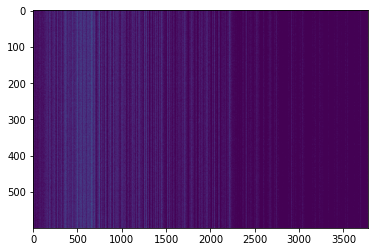

,AUC,pAUC
Source_0,0.517900,0.543158
Source_1,0.561000,0.546316
Source_2,0.565200,0.539474
Target_0,0.485000,0.547895
Target_1,0.666700,0.587895
Target_2,0.519900,0.483684
mean,0.552617,0.541404
h_mean,0.547050,0.539626


2021-05-30 21:32:28,529 - pytorch_modeler.py - INFO - epoch:1/300, train_losses:189635.106771, val_AUC_hmean:0.547050, val_pAUC_hmean:0.539626, best_flag:True
2021-05-30 21:32:28,530 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.73it/s]
2021-05-30 21:32:29,556 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.46it/s]
2021-05-30 21:32:29,634 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.04it/s]


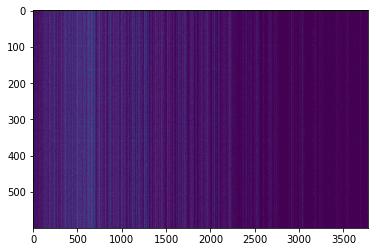

,AUC,pAUC
Source_0,0.543000,0.550000
Source_1,0.588000,0.548421
Source_2,0.646000,0.555789
Target_0,0.520000,0.585789
Target_1,0.683800,0.575789
Target_2,0.605900,0.494211
mean,0.597783,0.551667
h_mean,0.592521,0.550049


2021-05-30 21:32:31,608 - pytorch_modeler.py - INFO - epoch:2/300, train_losses:129325.051432, val_AUC_hmean:0.592521, val_pAUC_hmean:0.550049, best_flag:True
2021-05-30 21:32:31,609 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.13it/s]
2021-05-30 21:32:32,601 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.54it/s]
2021-05-30 21:32:32,677 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 44.61it/s]


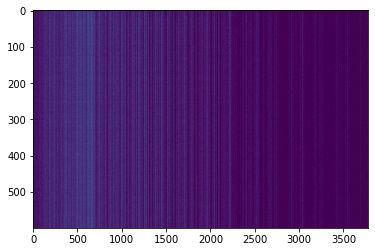

,AUC,pAUC
Source_0,0.564000,0.568947
Source_1,0.629600,0.574737
Source_2,0.626100,0.558947
Target_0,0.542500,0.596842
Target_1,0.688800,0.572105
Target_2,0.609000,0.498421
mean,0.610000,0.561667
h_mean,0.606324,0.559890


2021-05-30 21:32:34,666 - pytorch_modeler.py - INFO - epoch:3/300, train_losses:99283.117839, val_AUC_hmean:0.606324, val_pAUC_hmean:0.559890, best_flag:True
2021-05-30 21:32:34,667 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.64it/s]
2021-05-30 21:32:35,619 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.73it/s]
2021-05-30 21:32:35,673 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 47.80it/s]


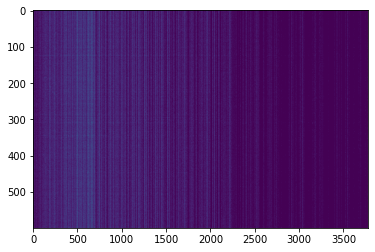

,AUC,pAUC
Source_0,0.556400,0.566316
Source_1,0.651300,0.574211
Source_2,0.675600,0.570000
Target_0,0.541200,0.613684
Target_1,0.686300,0.566842
Target_2,0.588900,0.501579
mean,0.616617,0.565439
h_mean,0.611263,0.563429


2021-05-30 21:32:37,625 - pytorch_modeler.py - INFO - epoch:4/300, train_losses:84731.529948, val_AUC_hmean:0.611263, val_pAUC_hmean:0.563429, best_flag:True
2021-05-30 21:32:37,626 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.45it/s]
2021-05-30 21:32:38,678 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.68it/s]
2021-05-30 21:32:38,748 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.32it/s]


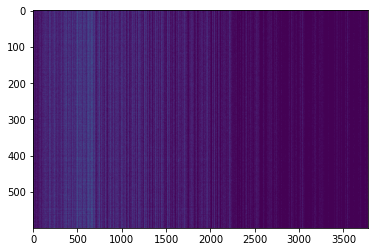

,AUC,pAUC
Source_0,0.571600,0.572105
Source_1,0.660300,0.582105
Source_2,0.750600,0.637368
Target_0,0.545600,0.617368
Target_1,0.692800,0.572105
Target_2,0.629000,0.496842
mean,0.641650,0.579649
h_mean,0.634096,0.576081


2021-05-30 21:32:40,733 - pytorch_modeler.py - INFO - epoch:5/300, train_losses:76956.212891, val_AUC_hmean:0.634096, val_pAUC_hmean:0.576081, best_flag:True
2021-05-30 21:32:40,737 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.88it/s]
2021-05-30 21:32:41,750 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 45.42it/s]
2021-05-30 21:32:41,822 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.36it/s]


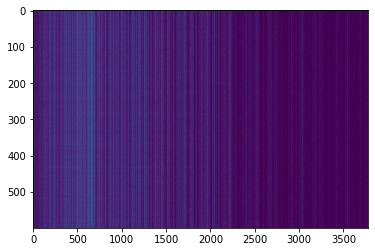

,AUC,pAUC
Source_0,0.578200,0.583684
Source_1,0.704200,0.604211
Source_2,0.782700,0.636316
Target_0,0.543400,0.622632
Target_1,0.709600,0.581053
Target_2,0.621300,0.504737
mean,0.656567,0.588772
h_mean,0.646118,0.585470


2021-05-30 21:32:43,844 - pytorch_modeler.py - INFO - epoch:6/300, train_losses:72614.927083, val_AUC_hmean:0.646118, val_pAUC_hmean:0.585470, best_flag:True
2021-05-30 21:32:43,845 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.94it/s]
2021-05-30 21:32:44,853 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 47.79it/s]
2021-05-30 21:32:44,922 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.69it/s]
2021-05-30 21:32:44,999 - pytorch_modeler.py - INFO - epoch:7/300, train_losses:69713.272135, val_AUC_hmean:0.645255, val_pAUC_hmean:0.583950, best_flag:False
2021-05-30 21:32:45,001 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.62it/s]
2021-05-30 21:32:45,953 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 50.95it/s]
2021-05-30 21:32:46,019 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 51.15it/s]


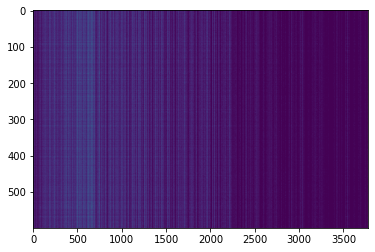

,AUC,pAUC
Source_0,0.567000,0.585263
Source_1,0.655300,0.577895
Source_2,0.812800,0.686842
Target_0,0.538000,0.624737
Target_1,0.687000,0.592105
Target_2,0.590800,0.500526
mean,0.641817,0.594561
h_mean,0.629792,0.589249


2021-05-30 21:32:48,009 - pytorch_modeler.py - INFO - epoch:8/300, train_losses:67480.327474, val_AUC_hmean:0.629792, val_pAUC_hmean:0.589249, best_flag:True
2021-05-30 21:32:48,012 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.46it/s]
2021-05-30 21:32:48,977 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 40.95it/s]
2021-05-30 21:32:49,053 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 49.53it/s]


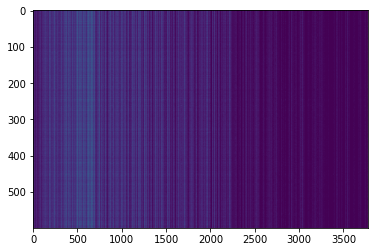

,AUC,pAUC
Source_0,0.577400,0.597895
Source_1,0.702400,0.588421
Source_2,0.803700,0.685789
Target_0,0.547700,0.635789
Target_1,0.702000,0.588947
Target_2,0.627900,0.512632
mean,0.660183,0.601579
h_mean,0.649156,0.596915


2021-05-30 21:32:50,953 - pytorch_modeler.py - INFO - epoch:9/300, train_losses:65911.187500, val_AUC_hmean:0.649156, val_pAUC_hmean:0.596915, best_flag:True
2021-05-30 21:32:50,954 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.76it/s]
2021-05-30 21:32:51,897 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 46.23it/s]
2021-05-30 21:32:51,964 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.34it/s]
2021-05-30 21:32:52,043 - pytorch_modeler.py - INFO - epoch:10/300, train_losses:64794.098633, val_AUC_hmean:0.645289, val_pAUC_hmean:0.595188, best_flag:False
2021-05-30 21:32:52,044 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.29it/s]
2021-05-30 21:32:53,023 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.87it/s]
2021-05-30 21:32:53,090 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 54.74it/s]
2021-05-30 21:

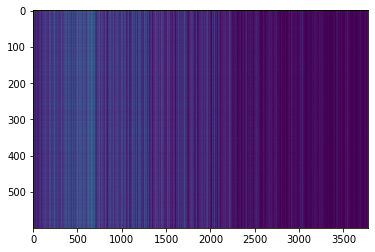

,AUC,pAUC
Source_0,0.601300,0.609474
Source_1,0.692800,0.606316
Source_2,0.816600,0.688947
Target_0,0.566800,0.637895
Target_1,0.708600,0.607368
Target_2,0.656500,0.518421
mean,0.673767,0.611404
h_mean,0.664465,0.607005


2021-05-30 21:32:56,041 - pytorch_modeler.py - INFO - epoch:12/300, train_losses:62410.545573, val_AUC_hmean:0.664465, val_pAUC_hmean:0.607005, best_flag:True
2021-05-30 21:32:56,042 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.36it/s]
2021-05-30 21:32:57,021 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 45.91it/s]
2021-05-30 21:32:57,093 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.84it/s]
2021-05-30 21:32:57,155 - pytorch_modeler.py - INFO - epoch:13/300, train_losses:61525.298828, val_AUC_hmean:0.670370, val_pAUC_hmean:0.595833, best_flag:False
2021-05-30 21:32:57,157 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.92it/s]
2021-05-30 21:32:58,087 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 61.77it/s]
2021-05-30 21:32:58,140 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 42.47it/s]
2021-05-30 21

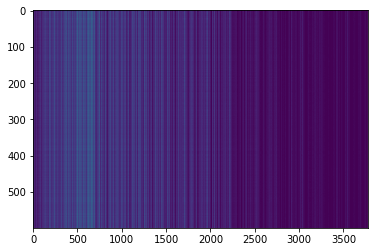

,AUC,pAUC
Source_0,0.630700,0.617368
Source_1,0.704800,0.611053
Source_2,0.810000,0.705789
Target_0,0.600700,0.641053
Target_1,0.723200,0.610526
Target_2,0.640600,0.517895
mean,0.685000,0.617281
h_mean,0.678161,0.612126


2021-05-30 21:33:04,433 - pytorch_modeler.py - INFO - epoch:18/300, train_losses:57889.831055, val_AUC_hmean:0.678161, val_pAUC_hmean:0.612126, best_flag:True
2021-05-30 21:33:04,434 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.65it/s]
2021-05-30 21:33:05,385 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.94it/s]
2021-05-30 21:33:05,445 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 42.98it/s]


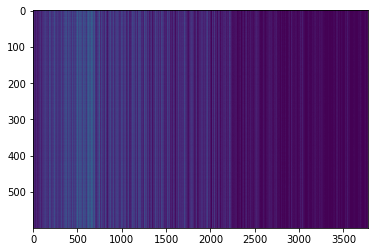

,AUC,pAUC
Source_0,0.627600,0.622105
Source_1,0.744500,0.618421
Source_2,0.792000,0.694211
Target_0,0.595700,0.653684
Target_1,0.746600,0.610000
Target_2,0.663200,0.521579
mean,0.694933,0.620000
h_mean,0.687669,0.615300


2021-05-30 21:33:07,289 - pytorch_modeler.py - INFO - epoch:19/300, train_losses:57202.481445, val_AUC_hmean:0.687669, val_pAUC_hmean:0.615300, best_flag:True
2021-05-30 21:33:07,290 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.58it/s]
2021-05-30 21:33:08,246 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 48.49it/s]
2021-05-30 21:33:08,314 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 64.19it/s]
2021-05-30 21:33:08,370 - pytorch_modeler.py - INFO - epoch:20/300, train_losses:56552.063151, val_AUC_hmean:0.685990, val_pAUC_hmean:0.614893, best_flag:False
2021-05-30 21:33:08,371 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.46it/s]
2021-05-30 21:33:09,336 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 55.30it/s]
2021-05-30 21:33:09,396 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.96it/s]
2021-05-30 21

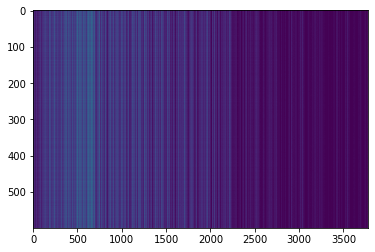

,AUC,pAUC
Source_0,0.6502,0.625789
Source_1,0.7334,0.611579
Source_2,0.8124,0.710000
Target_0,0.6008,0.648947
Target_1,0.7439,0.604737
Target_2,0.6833,0.532105
mean,0.7040,0.622193
h_mean,0.6973,0.617574


2021-05-30 21:33:13,454 - pytorch_modeler.py - INFO - epoch:23/300, train_losses:54946.009440, val_AUC_hmean:0.697300, val_pAUC_hmean:0.617574, best_flag:True
2021-05-30 21:33:13,455 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.44it/s]
2021-05-30 21:33:14,421 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 62.13it/s]
2021-05-30 21:33:14,483 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 55.68it/s]
2021-05-30 21:33:14,554 - pytorch_modeler.py - INFO - epoch:24/300, train_losses:54482.718750, val_AUC_hmean:0.699273, val_pAUC_hmean:0.614757, best_flag:False
2021-05-30 21:33:14,557 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:01<00:00, 11.02it/s]
2021-05-30 21:33:15,648 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 49.93it/s]
2021-05-30 21:33:15,718 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 45.96it/s]
2021-05-30 21

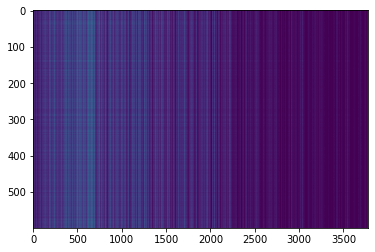

,AUC,pAUC
Source_0,0.650400,0.626316
Source_1,0.739000,0.628421
Source_2,0.825600,0.703158
Target_0,0.605000,0.652632
Target_1,0.736600,0.605263
Target_2,0.675800,0.523158
mean,0.705400,0.623158
h_mean,0.698312,0.618175


2021-05-30 21:33:19,048 - pytorch_modeler.py - INFO - epoch:26/300, train_losses:53382.149740, val_AUC_hmean:0.698312, val_pAUC_hmean:0.618175, best_flag:True
2021-05-30 21:33:19,049 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.69it/s]
2021-05-30 21:33:19,998 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 44.69it/s]
2021-05-30 21:33:20,068 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 41.11it/s]
2021-05-30 21:33:20,163 - pytorch_modeler.py - INFO - epoch:27/300, train_losses:52960.374349, val_AUC_hmean:0.696377, val_pAUC_hmean:0.612241, best_flag:False
2021-05-30 21:33:20,165 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.27it/s]
2021-05-30 21:33:21,144 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 56.36it/s]
2021-05-30 21:33:21,205 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 35.99it/s]
2021-05-30 21

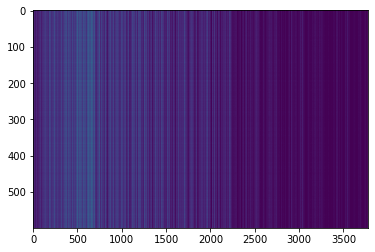

,AUC,pAUC
Source_0,0.661900,0.623684
Source_1,0.743500,0.615789
Source_2,0.815500,0.702632
Target_0,0.609900,0.654737
Target_1,0.761200,0.620526
Target_2,0.679100,0.522105
mean,0.711850,0.623246
h_mean,0.705227,0.618256


2021-05-30 21:33:24,154 - pytorch_modeler.py - INFO - epoch:29/300, train_losses:51950.948242, val_AUC_hmean:0.705227, val_pAUC_hmean:0.618256, best_flag:True
2021-05-30 21:33:24,155 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.37it/s]
2021-05-30 21:33:25,128 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 43.68it/s]
2021-05-30 21:33:25,198 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 52.68it/s]


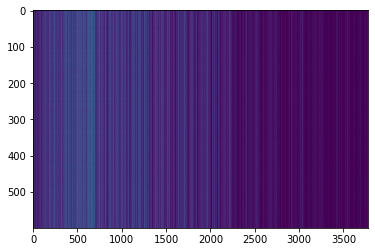

,AUC,pAUC
Source_0,0.657300,0.622632
Source_1,0.757700,0.637895
Source_2,0.812400,0.714211
Target_0,0.595800,0.646842
Target_1,0.765500,0.611053
Target_2,0.687600,0.523158
mean,0.712717,0.625965
h_mean,0.704956,0.620614


2021-05-30 21:33:27,047 - pytorch_modeler.py - INFO - epoch:30/300, train_losses:51607.883789, val_AUC_hmean:0.704956, val_pAUC_hmean:0.620614, best_flag:True
2021-05-30 21:33:27,048 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.84it/s]
2021-05-30 21:33:27,984 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.74it/s]
2021-05-30 21:33:28,054 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.40it/s]


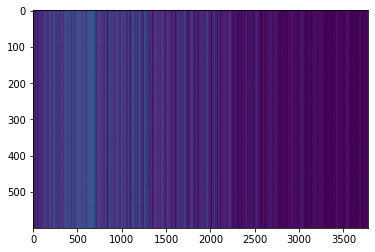

,AUC,pAUC
Source_0,0.672400,0.627895
Source_1,0.744300,0.623684
Source_2,0.835200,0.709474
Target_0,0.619300,0.657368
Target_1,0.772200,0.632632
Target_2,0.684000,0.518947
mean,0.721233,0.628333
h_mean,0.714304,0.622769


2021-05-30 21:33:30,213 - pytorch_modeler.py - INFO - epoch:31/300, train_losses:51110.054362, val_AUC_hmean:0.714304, val_pAUC_hmean:0.622769, best_flag:True
2021-05-30 21:33:30,214 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.50it/s]
2021-05-30 21:33:31,177 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 52.17it/s]
2021-05-30 21:33:31,242 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 39.30it/s]
2021-05-30 21:33:31,331 - pytorch_modeler.py - INFO - epoch:32/300, train_losses:50817.584310, val_AUC_hmean:0.699833, val_pAUC_hmean:0.611741, best_flag:False
2021-05-30 21:33:31,332 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.49it/s]
2021-05-30 21:33:32,295 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 40.55it/s]
2021-05-30 21:33:32,370 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 48.65it/s]
2021-05-30 21

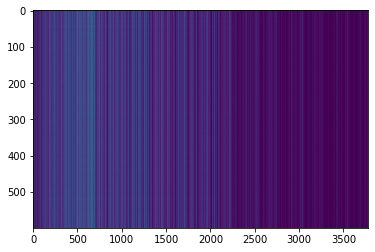

,AUC,pAUC
Source_0,0.695200,0.636316
Source_1,0.758600,0.638947
Source_2,0.811100,0.714211
Target_0,0.625200,0.663684
Target_1,0.777900,0.628421
Target_2,0.686300,0.533158
mean,0.725717,0.635789
h_mean,0.720147,0.630887


2021-05-30 21:33:36,499 - pytorch_modeler.py - INFO - epoch:35/300, train_losses:49601.805013, val_AUC_hmean:0.720147, val_pAUC_hmean:0.630887, best_flag:True
2021-05-30 21:33:36,500 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.12it/s]
2021-05-30 21:33:37,492 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 53.07it/s]
2021-05-30 21:33:37,552 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 58.21it/s]
2021-05-30 21:33:37,614 - pytorch_modeler.py - INFO - epoch:36/300, train_losses:49286.253255, val_AUC_hmean:0.706337, val_pAUC_hmean:0.617986, best_flag:False
2021-05-30 21:33:37,615 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 12.35it/s]
2021-05-30 21:33:38,589 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 57.97it/s]
2021-05-30 21:33:38,646 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.57it/s]
2021-05-30 21

100%|██████████| 2/2 [00:00<00:00, 73.41it/s]
2021-05-30 21:33:50,491 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.34it/s]
2021-05-30 21:33:50,546 - pytorch_modeler.py - INFO - epoch:52/300, train_losses:43520.930990, val_AUC_hmean:0.723120, val_pAUC_hmean:0.622758, best_flag:False
2021-05-30 21:33:50,547 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.12it/s]
2021-05-30 21:33:51,177 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.51it/s]
2021-05-30 21:33:51,225 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.53it/s]
2021-05-30 21:33:51,274 - pytorch_modeler.py - INFO - epoch:53/300, train_losses:43117.798503, val_AUC_hmean:0.719039, val_pAUC_hmean:0.621692, best_flag:False
2021-05-30 21:33:51,276 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.12it/s]
2021-05-30 21:33:51,906 - pytorch_modeler.py - INFO - valid_source
100%|███████

2021-05-30 21:34:02,567 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.12it/s]
2021-05-30 21:34:03,197 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 80.10it/s]
2021-05-30 21:34:03,243 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.87it/s]
2021-05-30 21:34:03,300 - pytorch_modeler.py - INFO - epoch:69/300, train_losses:38199.675781, val_AUC_hmean:0.731920, val_pAUC_hmean:0.622336, best_flag:False
2021-05-30 21:34:03,301 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.42it/s]
2021-05-30 21:34:03,922 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.29it/s]
2021-05-30 21:34:03,971 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 74.69it/s]
2021-05-30 21:34:04,024 - pytorch_modeler.py - INFO - epoch:70/300, train_losses:37870.734375, val_AUC_hmean:0.721442, val_pAUC_hmean:0.619665, best_flag:False
2021-05-30 2

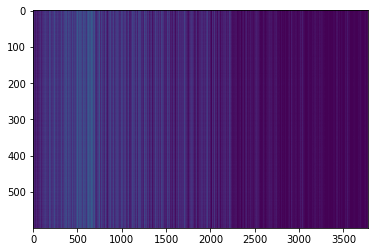

,AUC,pAUC
Source_0,0.741500,0.645263
Source_1,0.760500,0.652632
Source_2,0.824100,0.710000
Target_0,0.629600,0.658421
Target_1,0.805600,0.648947
Target_2,0.677500,0.516316
mean,0.739800,0.638596
h_mean,0.733261,0.632444


2021-05-30 21:34:15,552 - pytorch_modeler.py - INFO - epoch:83/300, train_losses:34385.429362, val_AUC_hmean:0.733261, val_pAUC_hmean:0.632444, best_flag:True
2021-05-30 21:34:15,553 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.31it/s]
2021-05-30 21:34:16,211 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 64.56it/s]
2021-05-30 21:34:16,265 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 72.34it/s]
2021-05-30 21:34:16,324 - pytorch_modeler.py - INFO - epoch:84/300, train_losses:34138.764648, val_AUC_hmean:0.724073, val_pAUC_hmean:0.618694, best_flag:False
2021-05-30 21:34:16,325 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.11it/s]
2021-05-30 21:34:16,955 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.15it/s]
2021-05-30 21:34:17,003 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.81it/s]
2021-05-30 21

100%|██████████| 2/2 [00:00<00:00, 75.89it/s]
2021-05-30 21:34:27,956 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.57it/s]
2021-05-30 21:34:28,005 - pytorch_modeler.py - INFO - epoch:100/300, train_losses:30110.418294, val_AUC_hmean:0.735696, val_pAUC_hmean:0.626876, best_flag:False
2021-05-30 21:34:28,006 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.63it/s]
2021-05-30 21:34:28,620 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.13it/s]
2021-05-30 21:34:28,674 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 63.70it/s]
2021-05-30 21:34:28,730 - pytorch_modeler.py - INFO - epoch:101/300, train_losses:29742.588216, val_AUC_hmean:0.727854, val_pAUC_hmean:0.626702, best_flag:False
2021-05-30 21:34:28,732 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.61it/s]
2021-05-30 21:34:29,346 - pytorch_modeler.py - INFO - valid_source
100%|█████

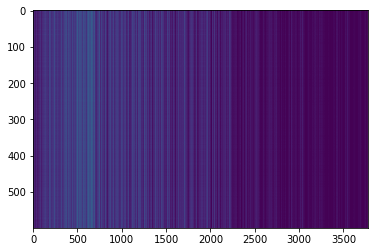

,AUC,pAUC
Source_0,0.732200,0.646842
Source_1,0.761100,0.652105
Source_2,0.820000,0.701053
Target_0,0.645000,0.663158
Target_1,0.801300,0.648947
Target_2,0.664500,0.517895
mean,0.737350,0.638333
h_mean,0.731493,0.632532


2021-05-30 21:34:31,041 - pytorch_modeler.py - INFO - epoch:102/300, train_losses:29568.050293, val_AUC_hmean:0.731493, val_pAUC_hmean:0.632532, best_flag:True
2021-05-30 21:34:31,042 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.17it/s]
2021-05-30 21:34:31,672 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.07it/s]
2021-05-30 21:34:31,723 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 60.98it/s]
2021-05-30 21:34:31,786 - pytorch_modeler.py - INFO - epoch:103/300, train_losses:29390.303060, val_AUC_hmean:0.735683, val_pAUC_hmean:0.626831, best_flag:False
2021-05-30 21:34:31,787 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.07it/s]
2021-05-30 21:34:32,419 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 74.01it/s]
2021-05-30 21:34:32,468 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 79.34it/s]
2021-05-30 

100%|██████████| 2/2 [00:00<00:00, 75.24it/s]
2021-05-30 21:34:43,599 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.77it/s]
2021-05-30 21:34:43,651 - pytorch_modeler.py - INFO - epoch:119/300, train_losses:25986.283691, val_AUC_hmean:0.737582, val_pAUC_hmean:0.629952, best_flag:False
2021-05-30 21:34:43,653 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.46it/s]
2021-05-30 21:34:44,272 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.59it/s]
2021-05-30 21:34:44,321 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.51it/s]
2021-05-30 21:34:44,370 - pytorch_modeler.py - INFO - epoch:120/300, train_losses:25523.350586, val_AUC_hmean:0.730220, val_pAUC_hmean:0.620506, best_flag:False
2021-05-30 21:34:44,371 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.72it/s]
2021-05-30 21:34:44,982 - pytorch_modeler.py - INFO - valid_source
100%|█████

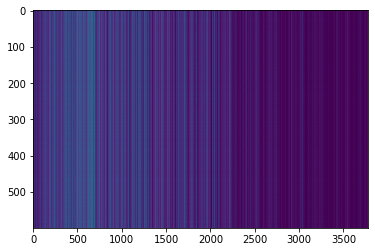

,AUC,pAUC
Source_0,0.764800,0.649474
Source_1,0.765000,0.665263
Source_2,0.823800,0.707368
Target_0,0.668300,0.661579
Target_1,0.800000,0.640000
Target_2,0.640500,0.513684
mean,0.743733,0.639561
h_mean,0.737443,0.633090


2021-05-30 21:34:52,644 - pytorch_modeler.py - INFO - epoch:129/300, train_losses:23752.348307, val_AUC_hmean:0.737443, val_pAUC_hmean:0.633090, best_flag:True
2021-05-30 21:34:52,644 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.47it/s]
2021-05-30 21:34:53,264 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.61it/s]
2021-05-30 21:34:53,313 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 85.89it/s]
2021-05-30 21:34:53,362 - pytorch_modeler.py - INFO - epoch:130/300, train_losses:23507.709310, val_AUC_hmean:0.735365, val_pAUC_hmean:0.619759, best_flag:False
2021-05-30 21:34:53,363 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.83it/s]
2021-05-30 21:34:53,970 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.96it/s]
2021-05-30 21:34:54,016 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 80.34it/s]
2021-05-30 

100%|██████████| 2/2 [00:00<00:00, 79.25it/s]
2021-05-30 21:35:04,926 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.83it/s]
2021-05-30 21:35:04,987 - pytorch_modeler.py - INFO - epoch:146/300, train_losses:20426.101888, val_AUC_hmean:0.731106, val_pAUC_hmean:0.623199, best_flag:False
2021-05-30 21:35:04,989 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.24it/s]
2021-05-30 21:35:05,617 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 59.08it/s]
2021-05-30 21:35:05,683 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 65.62it/s]
2021-05-30 21:35:05,753 - pytorch_modeler.py - INFO - epoch:147/300, train_losses:20335.577962, val_AUC_hmean:0.727596, val_pAUC_hmean:0.620194, best_flag:False
2021-05-30 21:35:05,755 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.70it/s]
2021-05-30 21:35:06,367 - pytorch_modeler.py - INFO - valid_source
100%|█████

2021-05-30 21:35:16,787 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.97it/s]
2021-05-30 21:35:17,458 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.49it/s]
2021-05-30 21:35:17,528 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.18it/s]
2021-05-30 21:35:17,592 - pytorch_modeler.py - INFO - epoch:163/300, train_losses:17676.009603, val_AUC_hmean:0.738504, val_pAUC_hmean:0.622204, best_flag:False
2021-05-30 21:35:17,593 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 17.04it/s]
2021-05-30 21:35:18,300 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.62it/s]
2021-05-30 21:35:18,356 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 70.78it/s]
2021-05-30 21:35:18,420 - pytorch_modeler.py - INFO - epoch:164/300, train_losses:17394.259440, val_AUC_hmean:0.729131, val_pAUC_hmean:0.621738, best_flag:False
2021-05-30

100%|██████████| 2/2 [00:00<00:00, 79.33it/s]
2021-05-30 21:35:30,322 - pytorch_modeler.py - INFO - epoch:179/300, train_losses:15286.188802, val_AUC_hmean:0.724019, val_pAUC_hmean:0.622576, best_flag:False
2021-05-30 21:35:30,323 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.13it/s]
2021-05-30 21:35:30,952 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 67.34it/s]
2021-05-30 21:35:31,003 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.16it/s]
2021-05-30 21:35:31,057 - pytorch_modeler.py - INFO - epoch:180/300, train_losses:15122.132812, val_AUC_hmean:0.740905, val_pAUC_hmean:0.629151, best_flag:False
2021-05-30 21:35:31,058 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.70it/s]
2021-05-30 21:35:31,669 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 86.52it/s]
2021-05-30 21:35:31,713 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 18.87it/s]
2021-05-30 21:35:42,543 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 64.54it/s]
2021-05-30 21:35:42,595 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 78.97it/s]
2021-05-30 21:35:42,647 - pytorch_modeler.py - INFO - epoch:196/300, train_losses:13084.786621, val_AUC_hmean:0.724663, val_pAUC_hmean:0.615054, best_flag:False
2021-05-30 21:35:42,649 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.98it/s]
2021-05-30 21:35:43,283 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 75.67it/s]
2021-05-30 21:35:43,334 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 66.94it/s]
2021-05-30 21:35:43,395 - pytorch_modeler.py - INFO - epoch:197/300, train_losses:12864.445719, val_AUC_hmean:0.728745, val_pAUC_hmean:0.629976, best_flag:False
2021-05-30 21:35:43,396 - pytorch_modeler.py - INFO - train
100%|█████

100%|██████████| 2/2 [00:00<00:00, 63.04it/s]
2021-05-30 21:35:54,558 - pytorch_modeler.py - INFO - epoch:212/300, train_losses:11137.301514, val_AUC_hmean:0.734529, val_pAUC_hmean:0.621833, best_flag:False
2021-05-30 21:35:54,559 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.86it/s]
2021-05-30 21:35:55,198 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 66.20it/s]
2021-05-30 21:35:55,255 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 75.42it/s]
2021-05-30 21:35:55,309 - pytorch_modeler.py - INFO - epoch:213/300, train_losses:10897.905273, val_AUC_hmean:0.738585, val_pAUC_hmean:0.618941, best_flag:False
2021-05-30 21:35:55,311 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.57it/s]
2021-05-30 21:35:55,959 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 61.04it/s]
2021-05-30 21:35:56,014 - pytorch_modeler.py - INFO - valid_target
100%|█████

100%|██████████| 12/12 [00:00<00:00, 19.27it/s]
2021-05-30 21:36:07,044 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.16it/s]
2021-05-30 21:36:07,096 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.10it/s]
2021-05-30 21:36:07,145 - pytorch_modeler.py - INFO - epoch:229/300, train_losses:9555.719482, val_AUC_hmean:0.730444, val_pAUC_hmean:0.617832, best_flag:False
2021-05-30 21:36:07,147 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.37it/s]
2021-05-30 21:36:07,768 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.95it/s]
2021-05-30 21:36:07,815 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 77.39it/s]
2021-05-30 21:36:07,865 - pytorch_modeler.py - INFO - epoch:230/300, train_losses:9299.913818, val_AUC_hmean:0.735678, val_pAUC_hmean:0.623065, best_flag:False
2021-05-30 21:36:07,866 - pytorch_modeler.py - INFO - train
100%|███████

2021-05-30 21:36:19,001 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.82it/s]
2021-05-30 21:36:19,641 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 78.79it/s]
2021-05-30 21:36:19,688 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 89.17it/s]
2021-05-30 21:36:19,735 - pytorch_modeler.py - INFO - epoch:246/300, train_losses:7788.638143, val_AUC_hmean:0.722397, val_pAUC_hmean:0.619196, best_flag:False
2021-05-30 21:36:19,736 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.84it/s]
2021-05-30 21:36:20,375 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 63.98it/s]
2021-05-30 21:36:20,441 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 69.62it/s]
2021-05-30 21:36:20,495 - pytorch_modeler.py - INFO - epoch:247/300, train_losses:7646.653239, val_AUC_hmean:0.716687, val_pAUC_hmean:0.616186, best_flag:False
2021-05-30 2

100%|██████████| 2/2 [00:00<00:00, 66.56it/s]
2021-05-30 21:36:31,532 - pytorch_modeler.py - INFO - epoch:262/300, train_losses:6664.183431, val_AUC_hmean:0.711302, val_pAUC_hmean:0.616305, best_flag:False
2021-05-30 21:36:31,534 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.51it/s]
2021-05-30 21:36:32,185 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 68.93it/s]
2021-05-30 21:36:32,242 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 61.83it/s]
2021-05-30 21:36:32,307 - pytorch_modeler.py - INFO - epoch:263/300, train_losses:6736.256388, val_AUC_hmean:0.721439, val_pAUC_hmean:0.616794, best_flag:False
2021-05-30 21:36:32,309 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 18.05it/s]
2021-05-30 21:36:32,977 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 71.01it/s]
2021-05-30 21:36:33,030 - pytorch_modeler.py - INFO - valid_target
100%|███████

100%|██████████| 12/12 [00:00<00:00, 19.35it/s]
2021-05-30 21:36:44,342 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 79.46it/s]
2021-05-30 21:36:44,389 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 83.83it/s]
2021-05-30 21:36:44,438 - pytorch_modeler.py - INFO - epoch:279/300, train_losses:5464.235514, val_AUC_hmean:0.718536, val_pAUC_hmean:0.615230, best_flag:False
2021-05-30 21:36:44,439 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.13it/s]
2021-05-30 21:36:45,068 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.16it/s]
2021-05-30 21:36:45,115 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 73.56it/s]
2021-05-30 21:36:45,167 - pytorch_modeler.py - INFO - epoch:280/300, train_losses:5378.253784, val_AUC_hmean:0.733519, val_pAUC_hmean:0.618629, best_flag:False
2021-05-30 21:36:45,169 - pytorch_modeler.py - INFO - train
100%|███████

2021-05-30 21:36:56,237 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.30it/s]
2021-05-30 21:36:56,860 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 77.08it/s]
2021-05-30 21:36:56,908 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 59.58it/s]
2021-05-30 21:36:56,973 - pytorch_modeler.py - INFO - epoch:296/300, train_losses:4470.688761, val_AUC_hmean:0.719058, val_pAUC_hmean:0.616950, best_flag:False
2021-05-30 21:36:56,974 - pytorch_modeler.py - INFO - train
100%|██████████| 12/12 [00:00<00:00, 19.20it/s]
2021-05-30 21:36:57,601 - pytorch_modeler.py - INFO - valid_source
100%|██████████| 2/2 [00:00<00:00, 70.91it/s]
2021-05-30 21:36:57,662 - pytorch_modeler.py - INFO - valid_target
100%|██████████| 2/2 [00:00<00:00, 56.95it/s]
2021-05-30 21:36:57,730 - pytorch_modeler.py - INFO - epoch:297/300, train_losses:4397.555990, val_AUC_hmean:0.721747, val_pAUC_hmean:0.616720, best_flag:False
2021-05-30 2

,AUC,pAUC
Source_0,0.764800,0.649474
Source_1,0.765000,0.665263
Source_2,0.823800,0.707368
Target_0,0.668300,0.661579
Target_1,0.800000,0.640000
Target_2,0.640500,0.513684
mean,0.743733,0.639561
h_mean,0.737443,0.633090


elapsed time: 275.091687441 [sec]


In [15]:
for machine_type in machine_types:
    run(machine_type)

In [16]:
#run(machine_types[2])